In [1]:
#%matplotlib notebook
import os
import sys
sys.path.append("numpy_path")
import numpy as np

import struct
from matplotlib import pyplot as plt
import keras
from keras.models import Sequential, load_model
from keras.layers import Dense, Dropout, Activation
from keras.optimizers import RMSprop
import keras.callbacks as cb
from keras.callbacks import EarlyStopping, ModelCheckpoint
from math import cos, sin, pi
import math
from statistics import mean
import os.path

shape_size = 48

# define loss history
class LossHistory(cb.Callback):
    def on_train_begin(self, logs={}):
        self.losses = []
    def on_batch_end(self, batch, logs={}):
        batch_loss = logs.get('loss')
        self.losses.append(batch_loss)

#plot losses
def plot_losses(losses):
    plt.plot(losses)
    plt.title('Loss per batch')
    plt.show()

def feature_scaling(X):
    X = X.T
    for i in range(7):
        mean = X[i].mean()
        std = X[i].std()
        X[i] = [(x - mean)/std for x in X[i]]
    return X.T

Using TensorFlow backend.


In [2]:
data_size = 0
dummy1 = [0]*200
dummy2 = [0]*6
SP = np.array(np.reshape(dummy1, (1, 200)))
SH = np.array(np.reshape(dummy2, (1, 6)))
for i in range(2, 65):
    path = 'meep_code/data/DATA'+str(i)
    if not os.path.exists(path):
        #miss.append(i)
        print('Missing batch:' + str(i))
        continue
        
    files = next(os.walk(path))[2] #dir is your directory path as string]
    num_data = len(files)
    data_size += num_data
    skip = []
    
    coordinates = np.genfromtxt('meep_code/data/DATA'+str(i)+'_sh.txt')
    xc, yc = coordinates[:, 0], coordinates[:, 1]
    xc = np.reshape(xc, (num_data, shape_size))
    yc = np.reshape(yc, (num_data, shape_size))
    
    for j in range(num_data):
        tmp = np.genfromtxt(path+'/'+'DATA'+str(i)+'_sp'+str(j)+'.txt')
        valid = True
        for q in range(200):
            if math.isnan(float(tmp[q])):
                print('Batch '+str(i)+'\tsample '+str(j)+' has NAN value')
                valid = False
                break
            if tmp[q] > 3:
                print('Batch '+str(i)+'\tsample '+str(j)+' has extreme value')
                valid = False
                break
        if not valid:
            #skip.append(j)
            continue
        SP = np.concatenate((SP, np.reshape(tmp, (1, 200))))
        tmp = []
        for q in range(6):
            tmp.append(math.sqrt(xc[j][q]**2 + yc[j][q]**2))
        SH = np.concatenate((SH, np.reshape(np.array(tmp), (1, 6))))
    print('Batch '+str(i)+' has \t'+str(num_data)) 

Batch 2 has 	7
Batch 3 has 	6
Batch 4 has 	17
Batch 5 has 	5
Batch 6 has 	14
Batch 7 has 	14
Batch 8 has 	40
Batch 9 has 	5
Batch 10 has 	14
Batch 11 has 	14
Batch 12 has 	40
Batch 13 has 	13
Batch 14 has 	37
Batch 15 has 	37
Batch 16 has 	106
Batch 17 has 	5
Batch 18 has 	14
Batch 19 has 	14
Batch 20 has 	40
Batch 21 has 	13
Batch 22 has 	37
Batch 23 has 	37
Batch 24 has 	106
Batch 25 has 	13
Batch 26 has 	37
Batch 27 has 	37
Batch 28 has 	106
Batch 29 has 	35
Batch 30 has 	100
Batch 31 has 	100
Batch 32 has 	287
Batch 33 has 	5
Batch 34 has 	14
Batch 35 has 	14
Batch 36 has 	40
Batch 37 has 	13
Batch 38 has 	37
Batch 39 has 	37
Batch 40 has 	106
Batch 41 has 	13
Batch 42 has 	37
Batch 43 has 	37
Batch 44 has 	106
Batch 45 has 	35
Batch 46 has 	100
Batch 47 has 	100
Batch 48 has 	287
Batch 49 has 	13
Batch 50 has 	37
Batch 51 has 	37
Batch 52 has 	106
Batch 53 has 	35
Batch 54 has 	100
Batch 55 has 	100
Batch 56 has 	287
Batch 57 has 	35
Batch 58 has 	100
Batch 59 has 	100
Batch 60 ha

In [3]:
print('Total # of data: ' + str(len(SP)))
x = np.genfromtxt('meep_code/data/SP_xaxis.txt')
SP_F, SH_F = np.reshape(SP[1], (1, 200)),np.reshape(SH[1], (1, 6))
for i in range(2, len(SP)):
    peak_down = 0
    peak_up = 0
    for j in range(1, 200):
        if SP[i][j - 1] >= 0.6 >=SP[i][j]:
            peak_down += 1
        if SP[i][j - 1] <= 0.6 <=SP[i][j]:
            peak_up += 1
    if peak_down == peak_up and peak_up == 2:
        SP_F = np.concatenate((SP_F, np.reshape(SP[i], (1, 200))))
        SH_F = np.concatenate((SH_F, np.reshape(SH[i], (1, 6))))

Total # of data: 4989


In [4]:
DATA = np.append(SP_F, SH_F, axis = 1)
np.random.shuffle(DATA)

Y = DATA[:, :200]
X = DATA[:,200:]
Y = np.subtract(Y, 0.5)
train_size = int(len(DATA) * 0.8)

train_X = X[0:train_size, :]
train_Y = Y[0:train_size, :]
test_X = X[train_size:, :]
test_Y = Y[train_size:, :]

In [17]:
in_dim = 6
out_dim = 200
simulator = Sequential()
simulator.add(Dense(20, activation='relu', input_dim=in_dim))
simulator.add(Dropout(0.5))
# simulator.add(Dense(700, activation='relu'))
# simulator.add(Dropout(0.5))
# simulator.add(Dense(700, activation='relu'))
# simulator.add(Dropout(0.5))
simulator.add(Dense(500, activation='relu'))
simulator.add(Dropout(0.5))
simulator.add(Dense(500, activation='relu'))
simulator.add(Dropout(0.5))
simulator.add(Dense(200, activation='relu'))
simulator.add(Dropout(0.5))
simulator.add(Dense(200, activation='relu'))
simulator.add(Dropout(0.5))
simulator.add(Dense(200, activation='relu'))
simulator.add(Dropout(0.5))
# simulator.add(Dense(200, activation='relu'))
# simulator.add(Dropout(0.5))
simulator.add(Dense(out_dim, activation='elu'))
simulator.compile(loss=keras.losses.mean_squared_error,
                  optimizer=keras.optimizers.Adam(lr = 0.001))

In [18]:
simulator.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_25 (Dense)             (None, 20)                140       
_________________________________________________________________
dropout_21 (Dropout)         (None, 20)                0         
_________________________________________________________________
dense_26 (Dense)             (None, 500)               10500     
_________________________________________________________________
dropout_22 (Dropout)         (None, 500)               0         
_________________________________________________________________
dense_27 (Dense)             (None, 500)               250500    
_________________________________________________________________
dropout_23 (Dropout)         (None, 500)               0         
_________________________________________________________________
dense_28 (Dense)             (None, 200)               100200    
__________

Train on 671 samples, validate on 168 samples
Epoch 1/1000
 - 2s - loss: 0.1128 - val_loss: 0.0851
Epoch 2/1000
 - 0s - loss: 0.0604 - val_loss: 0.0548
Epoch 3/1000
 - 0s - loss: 0.0530 - val_loss: 0.0453
Epoch 4/1000
 - 0s - loss: 0.0504 - val_loss: 0.0429
Epoch 5/1000
 - 0s - loss: 0.0493 - val_loss: 0.0431
Epoch 6/1000
 - 0s - loss: 0.0485 - val_loss: 0.0427
Epoch 7/1000
 - 0s - loss: 0.0481 - val_loss: 0.0424
Epoch 8/1000
 - 0s - loss: 0.0480 - val_loss: 0.0428
Epoch 9/1000
 - 0s - loss: 0.0477 - val_loss: 0.0425
Epoch 10/1000
 - 0s - loss: 0.0474 - val_loss: 0.0427
Epoch 11/1000
 - 0s - loss: 0.0474 - val_loss: 0.0424
Epoch 12/1000
 - 0s - loss: 0.0471 - val_loss: 0.0425
Epoch 13/1000
 - 0s - loss: 0.0468 - val_loss: 0.0423
Epoch 14/1000
 - 0s - loss: 0.0468 - val_loss: 0.0424
Epoch 15/1000
 - 0s - loss: 0.0470 - val_loss: 0.0424
Epoch 16/1000
 - 0s - loss: 0.0469 - val_loss: 0.0423
Epoch 17/1000
 - 0s - loss: 0.0466 - val_loss: 0.0425
Epoch 18/1000
 - 0s - loss: 0.0467 - val_loss

 - 0s - loss: 0.0316 - val_loss: 0.0571
Epoch 152/1000
 - 0s - loss: 0.0305 - val_loss: 0.0588
Epoch 153/1000
 - 0s - loss: 0.0318 - val_loss: 0.0606
Epoch 154/1000
 - 0s - loss: 0.0309 - val_loss: 0.0576
Epoch 155/1000
 - 0s - loss: 0.0317 - val_loss: 0.0594
Epoch 156/1000
 - 0s - loss: 0.0306 - val_loss: 0.0581
Epoch 157/1000
 - 0s - loss: 0.0312 - val_loss: 0.0576
Epoch 158/1000
 - 0s - loss: 0.0310 - val_loss: 0.0581
Epoch 159/1000
 - 0s - loss: 0.0305 - val_loss: 0.0574
Epoch 160/1000
 - 0s - loss: 0.0310 - val_loss: 0.0588
Epoch 161/1000
 - 0s - loss: 0.0310 - val_loss: 0.0588
Epoch 162/1000
 - 0s - loss: 0.0305 - val_loss: 0.0572
Epoch 163/1000
 - 0s - loss: 0.0309 - val_loss: 0.0583
Epoch 164/1000
 - 0s - loss: 0.0317 - val_loss: 0.0595
Epoch 165/1000
 - 0s - loss: 0.0307 - val_loss: 0.0580
Epoch 166/1000
 - 0s - loss: 0.0311 - val_loss: 0.0586
Epoch 167/1000
 - 0s - loss: 0.0315 - val_loss: 0.0596
Epoch 168/1000
 - 0s - loss: 0.0304 - val_loss: 0.0602
Epoch 169/1000
 - 0s - lo

 - 0s - loss: 0.0289 - val_loss: 0.0602
Epoch 301/1000
 - 0s - loss: 0.0284 - val_loss: 0.0605
Epoch 302/1000
 - 0s - loss: 0.0273 - val_loss: 0.0605
Epoch 303/1000
 - 0s - loss: 0.0285 - val_loss: 0.0612
Epoch 304/1000
 - 0s - loss: 0.0277 - val_loss: 0.0598
Epoch 305/1000
 - 0s - loss: 0.0281 - val_loss: 0.0607
Epoch 306/1000
 - 0s - loss: 0.0282 - val_loss: 0.0615
Epoch 307/1000
 - 0s - loss: 0.0280 - val_loss: 0.0595
Epoch 308/1000
 - 0s - loss: 0.0274 - val_loss: 0.0618
Epoch 309/1000
 - 0s - loss: 0.0276 - val_loss: 0.0613
Epoch 310/1000
 - 0s - loss: 0.0276 - val_loss: 0.0629
Epoch 311/1000
 - 0s - loss: 0.0268 - val_loss: 0.0622
Epoch 312/1000
 - 0s - loss: 0.0280 - val_loss: 0.0623
Epoch 313/1000
 - 0s - loss: 0.0275 - val_loss: 0.0609
Epoch 314/1000
 - 0s - loss: 0.0273 - val_loss: 0.0620
Epoch 315/1000
 - 0s - loss: 0.0276 - val_loss: 0.0611
Epoch 316/1000
 - 0s - loss: 0.0269 - val_loss: 0.0612
Epoch 317/1000
 - 0s - loss: 0.0277 - val_loss: 0.0626
Epoch 318/1000
 - 0s - lo

 - 0s - loss: 0.0252 - val_loss: 0.0581
Epoch 450/1000
 - 0s - loss: 0.0263 - val_loss: 0.0607
Epoch 451/1000
 - 0s - loss: 0.0263 - val_loss: 0.0584
Epoch 452/1000
 - 0s - loss: 0.0264 - val_loss: 0.0576
Epoch 453/1000
 - 0s - loss: 0.0263 - val_loss: 0.0564
Epoch 454/1000
 - 0s - loss: 0.0259 - val_loss: 0.0557
Epoch 455/1000
 - 0s - loss: 0.0277 - val_loss: 0.0587
Epoch 456/1000
 - 0s - loss: 0.0263 - val_loss: 0.0587
Epoch 457/1000
 - 0s - loss: 0.0259 - val_loss: 0.0597
Epoch 458/1000
 - 0s - loss: 0.0274 - val_loss: 0.0583
Epoch 459/1000
 - 0s - loss: 0.0259 - val_loss: 0.0572
Epoch 460/1000
 - 0s - loss: 0.0247 - val_loss: 0.0596
Epoch 461/1000
 - 0s - loss: 0.0253 - val_loss: 0.0611
Epoch 462/1000
 - 0s - loss: 0.0262 - val_loss: 0.0566
Epoch 463/1000
 - 0s - loss: 0.0263 - val_loss: 0.0567
Epoch 464/1000
 - 0s - loss: 0.0266 - val_loss: 0.0562
Epoch 465/1000
 - 0s - loss: 0.0267 - val_loss: 0.0585
Epoch 466/1000
 - 0s - loss: 0.0260 - val_loss: 0.0593
Epoch 467/1000
 - 0s - lo

 - 0s - loss: 0.0256 - val_loss: 0.0550
Epoch 599/1000
 - 0s - loss: 0.0249 - val_loss: 0.0575
Epoch 600/1000
 - 0s - loss: 0.0252 - val_loss: 0.0536
Epoch 601/1000
 - 0s - loss: 0.0250 - val_loss: 0.0559
Epoch 602/1000
 - 0s - loss: 0.0259 - val_loss: 0.0572
Epoch 603/1000
 - 0s - loss: 0.0256 - val_loss: 0.0587
Epoch 604/1000
 - 0s - loss: 0.0258 - val_loss: 0.0527
Epoch 605/1000
 - 0s - loss: 0.0264 - val_loss: 0.0562
Epoch 606/1000
 - 0s - loss: 0.0247 - val_loss: 0.0554
Epoch 607/1000
 - 0s - loss: 0.0248 - val_loss: 0.0585
Epoch 608/1000
 - 0s - loss: 0.0261 - val_loss: 0.0552
Epoch 609/1000
 - 0s - loss: 0.0251 - val_loss: 0.0546
Epoch 610/1000
 - 0s - loss: 0.0262 - val_loss: 0.0571
Epoch 611/1000
 - 0s - loss: 0.0255 - val_loss: 0.0583
Epoch 612/1000
 - 0s - loss: 0.0263 - val_loss: 0.0525
Epoch 613/1000
 - 0s - loss: 0.0253 - val_loss: 0.0573
Epoch 614/1000
 - 0s - loss: 0.0255 - val_loss: 0.0558
Epoch 615/1000
 - 0s - loss: 0.0251 - val_loss: 0.0576
Epoch 616/1000
 - 0s - lo

 - 0s - loss: 0.0258 - val_loss: 0.0541
Epoch 748/1000
 - 0s - loss: 0.0256 - val_loss: 0.0568
Epoch 749/1000
 - 0s - loss: 0.0246 - val_loss: 0.0539
Epoch 750/1000
 - 0s - loss: 0.0247 - val_loss: 0.0568
Epoch 751/1000
 - 0s - loss: 0.0266 - val_loss: 0.0524
Epoch 752/1000
 - 0s - loss: 0.0255 - val_loss: 0.0521
Epoch 753/1000
 - 0s - loss: 0.0255 - val_loss: 0.0530
Epoch 754/1000
 - 0s - loss: 0.0260 - val_loss: 0.0580
Epoch 755/1000
 - 0s - loss: 0.0258 - val_loss: 0.0565
Epoch 756/1000
 - 0s - loss: 0.0250 - val_loss: 0.0529
Epoch 757/1000
 - 0s - loss: 0.0258 - val_loss: 0.0541
Epoch 758/1000
 - 0s - loss: 0.0248 - val_loss: 0.0550
Epoch 759/1000
 - 0s - loss: 0.0254 - val_loss: 0.0549
Epoch 760/1000
 - 0s - loss: 0.0263 - val_loss: 0.0532
Epoch 761/1000
 - 0s - loss: 0.0253 - val_loss: 0.0523
Epoch 762/1000
 - 0s - loss: 0.0260 - val_loss: 0.0541
Epoch 763/1000
 - 0s - loss: 0.0256 - val_loss: 0.0566
Epoch 764/1000
 - 0s - loss: 0.0252 - val_loss: 0.0520
Epoch 765/1000
 - 0s - lo

 - 0s - loss: 0.0247 - val_loss: 0.0523
Epoch 897/1000
 - 0s - loss: 0.0245 - val_loss: 0.0550
Epoch 898/1000
 - 0s - loss: 0.0247 - val_loss: 0.0539
Epoch 899/1000
 - 0s - loss: 0.0253 - val_loss: 0.0566
Epoch 900/1000
 - 0s - loss: 0.0248 - val_loss: 0.0539
Epoch 901/1000
 - 0s - loss: 0.0247 - val_loss: 0.0552
Epoch 902/1000
 - 0s - loss: 0.0250 - val_loss: 0.0528
Epoch 903/1000
 - 0s - loss: 0.0248 - val_loss: 0.0558
Epoch 904/1000
 - 0s - loss: 0.0253 - val_loss: 0.0527
Epoch 905/1000
 - 0s - loss: 0.0253 - val_loss: 0.0542
Epoch 906/1000
 - 0s - loss: 0.0250 - val_loss: 0.0526
Epoch 907/1000
 - 0s - loss: 0.0244 - val_loss: 0.0542
Epoch 908/1000
 - 0s - loss: 0.0244 - val_loss: 0.0538
Epoch 909/1000
 - 0s - loss: 0.0253 - val_loss: 0.0541
Epoch 910/1000
 - 0s - loss: 0.0255 - val_loss: 0.0561
Epoch 911/1000
 - 0s - loss: 0.0256 - val_loss: 0.0528
Epoch 912/1000
 - 0s - loss: 0.0255 - val_loss: 0.0546
Epoch 913/1000
 - 0s - loss: 0.0251 - val_loss: 0.0544
Epoch 914/1000
 - 0s - lo

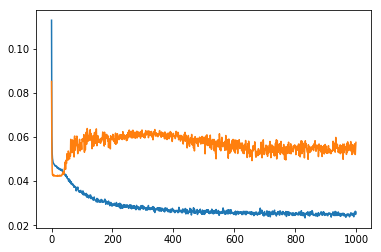

In [19]:
history = simulator.fit(train_X, train_Y, 
                    epochs=1000, 
                    batch_size=20,
                    validation_data=(test_X, test_Y), 
                    verbose=2)

train_score = simulator.evaluate(train_X, train_Y, batch_size=20)
test_score = simulator.evaluate(test_X, test_Y, batch_size= 50)
print(train_score)
print(test_score)
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')

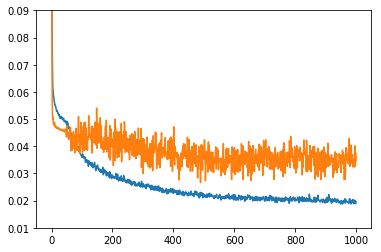

In [42]:
plt.ylim(0.01, 0.09)
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')

Two-peak 20-500-500-200-200 with linear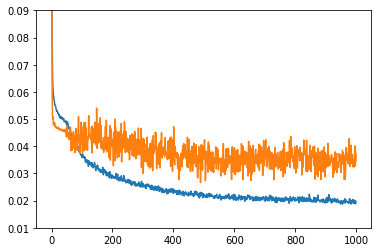

Two-peak 20-500-500-200-200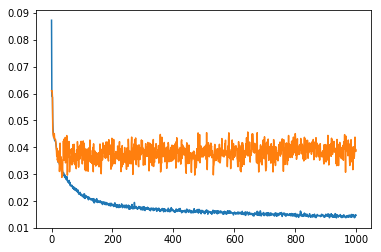

20-500-500-200-200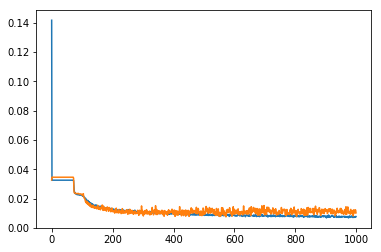

20-500-500-200-200-200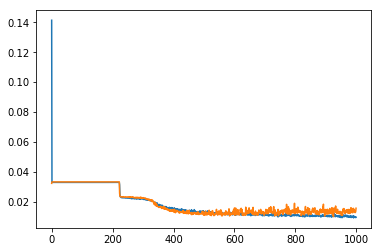

Test 0
True spectrum: 


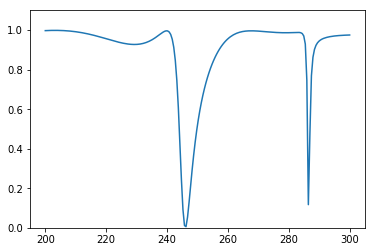

Predicted spectrum: 


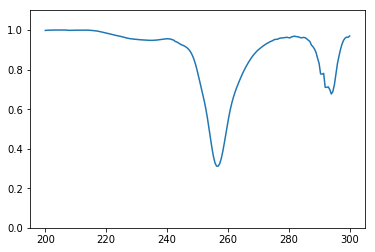

Test 1
True spectrum: 


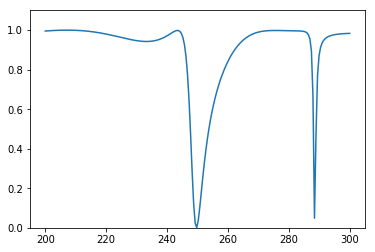

Predicted spectrum: 


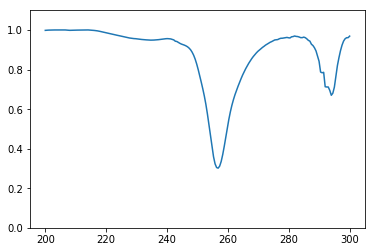

Test 2
True spectrum: 


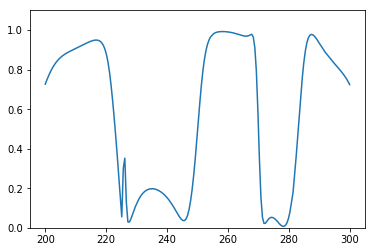

Predicted spectrum: 


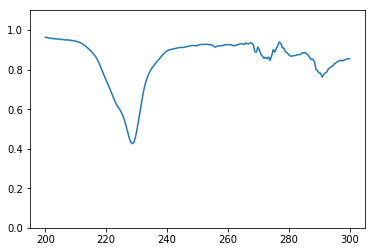

Test 3
True spectrum: 


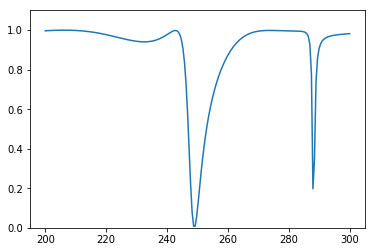

Predicted spectrum: 


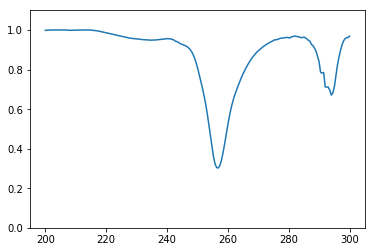

Test 4
True spectrum: 


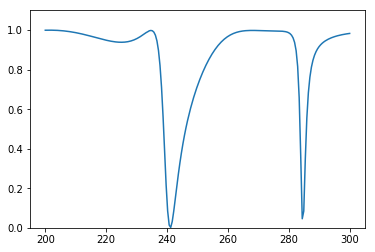

Predicted spectrum: 


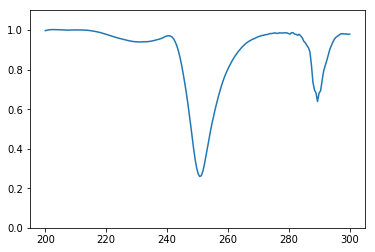

Test 5
True spectrum: 


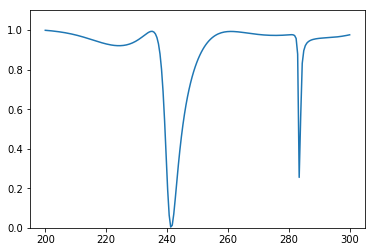

Predicted spectrum: 


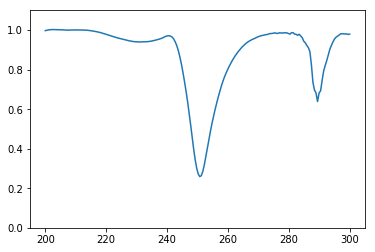

Test 6
True spectrum: 


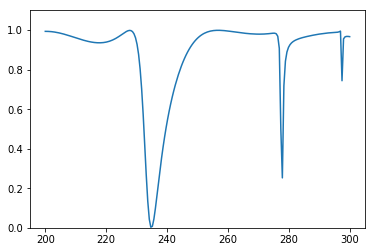

Predicted spectrum: 


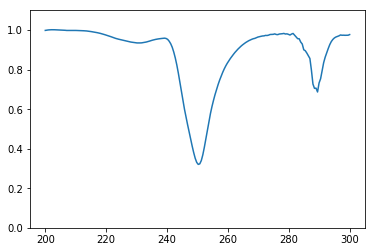

Test 7
True spectrum: 


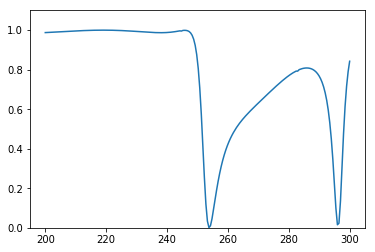

Predicted spectrum: 


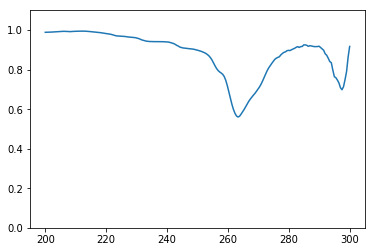

Test 8
True spectrum: 


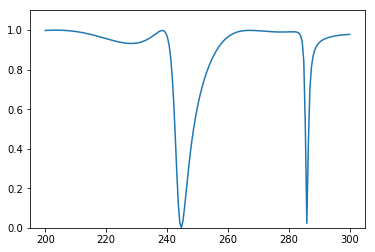

Predicted spectrum: 


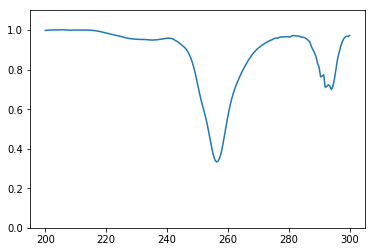

Test 9
True spectrum: 


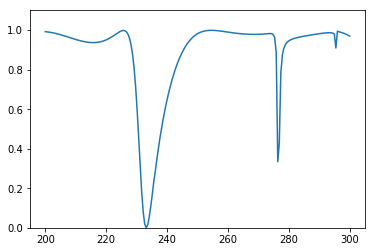

Predicted spectrum: 


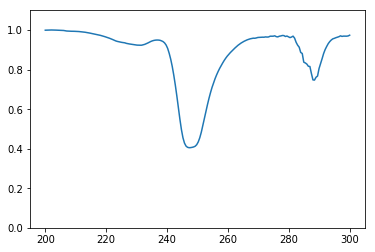

Test 10
True spectrum: 


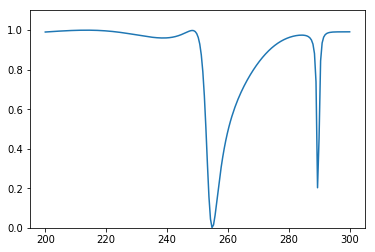

Predicted spectrum: 


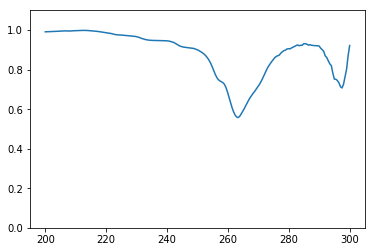

Test 11
True spectrum: 


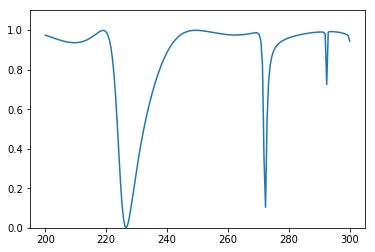

Predicted spectrum: 


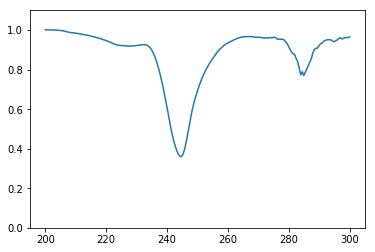

Test 12
True spectrum: 


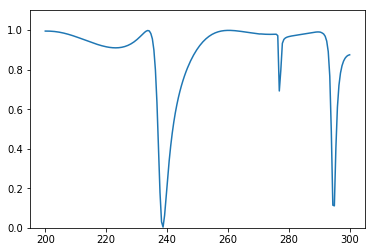

Predicted spectrum: 


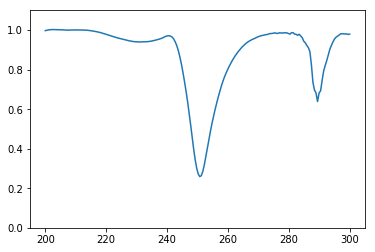

Test 13
True spectrum: 


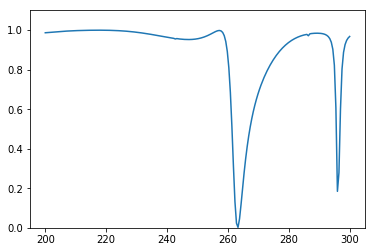

Predicted spectrum: 


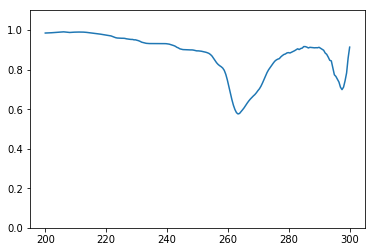

Test 14
True spectrum: 


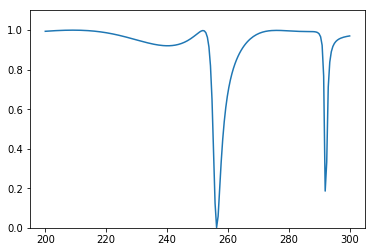

Predicted spectrum: 


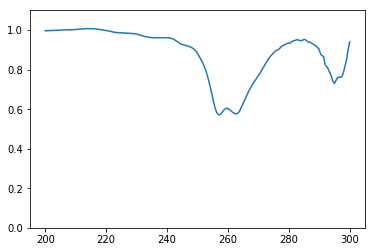

Test 15
True spectrum: 


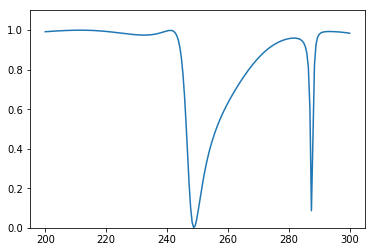

Predicted spectrum: 


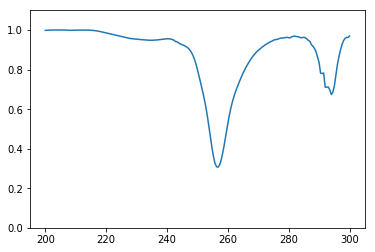

Test 16
True spectrum: 


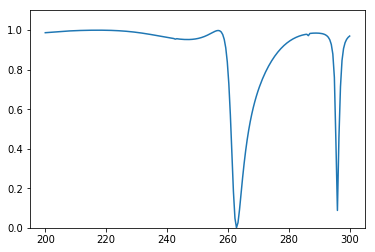

Predicted spectrum: 


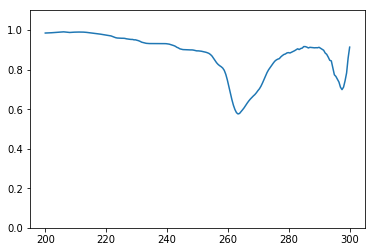

Test 17
True spectrum: 


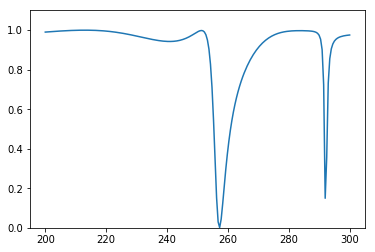

Predicted spectrum: 


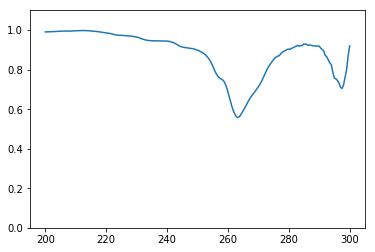

Test 18
True spectrum: 


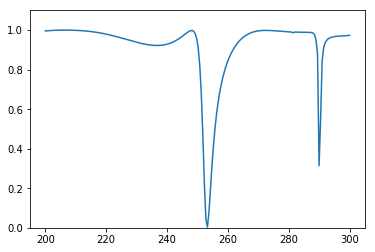

Predicted spectrum: 


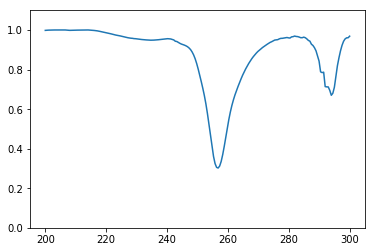

Test 19
True spectrum: 


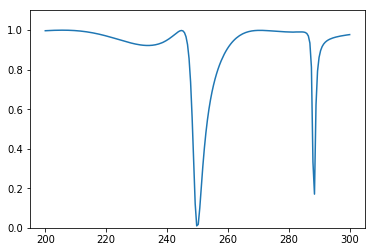

Predicted spectrum: 


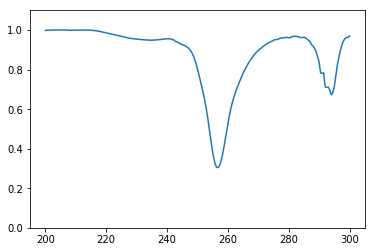

Test 20
True spectrum: 


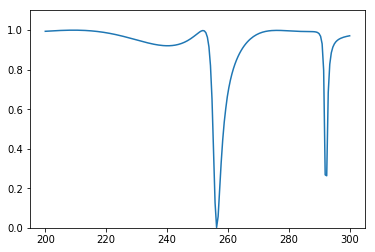

Predicted spectrum: 


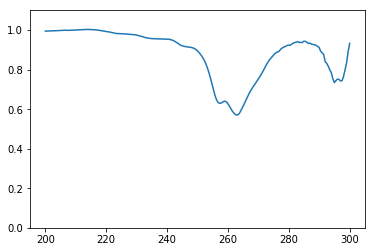

Test 21
True spectrum: 


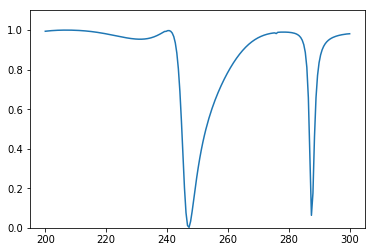

Predicted spectrum: 


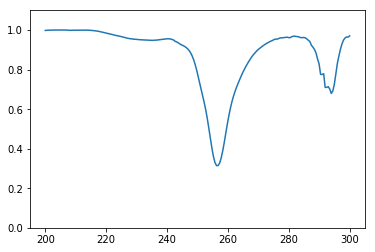

Test 22
True spectrum: 


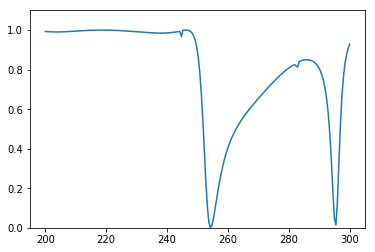

Predicted spectrum: 


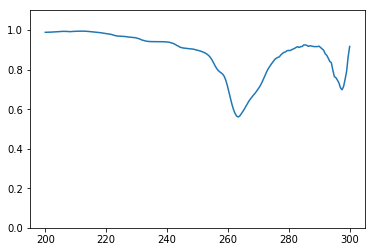

Test 23
True spectrum: 


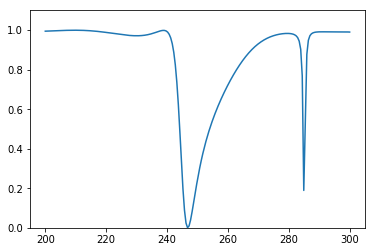

Predicted spectrum: 


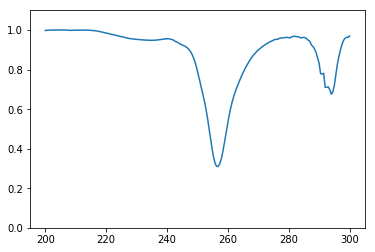

Test 24
True spectrum: 


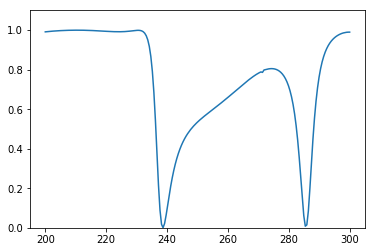

Predicted spectrum: 


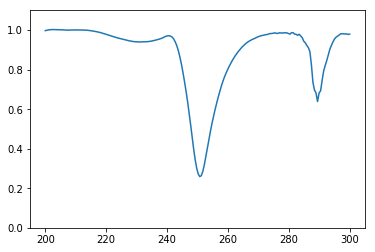

Test 25
True spectrum: 


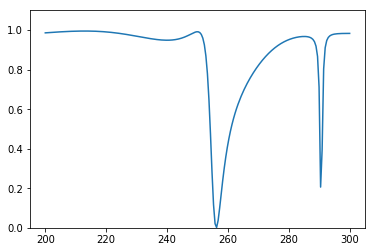

Predicted spectrum: 


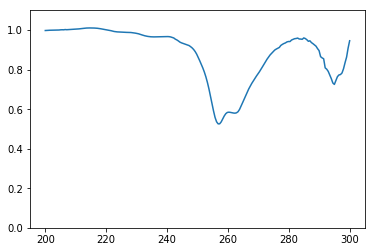

Test 26
True spectrum: 


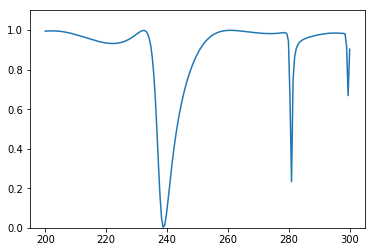

Predicted spectrum: 


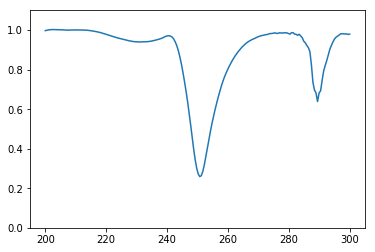

Test 27
True spectrum: 


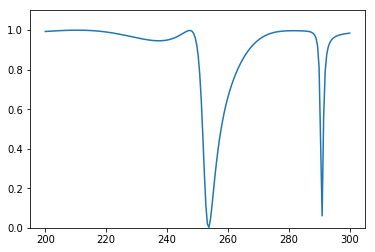

Predicted spectrum: 


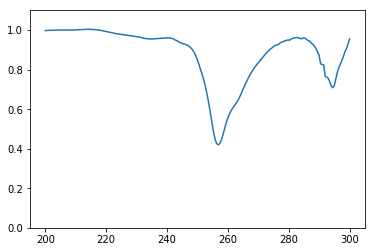

Test 28
True spectrum: 


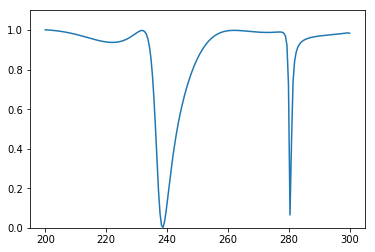

Predicted spectrum: 


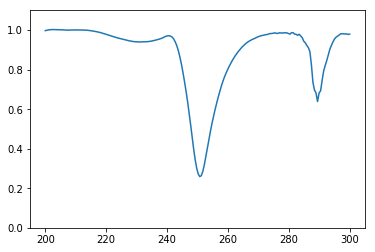

Test 29
True spectrum: 


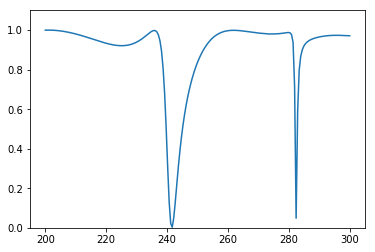

Predicted spectrum: 


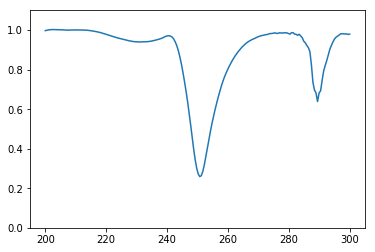

Test 30
True spectrum: 


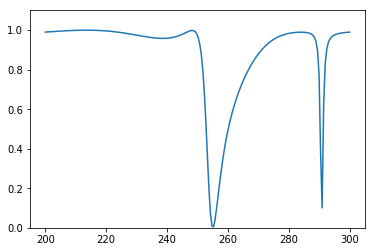

Predicted spectrum: 


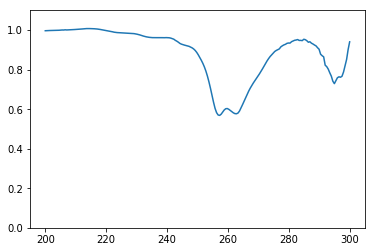

Test 31
True spectrum: 


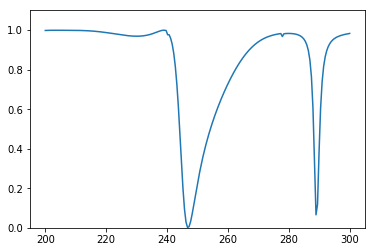

Predicted spectrum: 


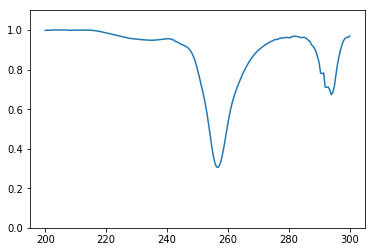

Test 32
True spectrum: 


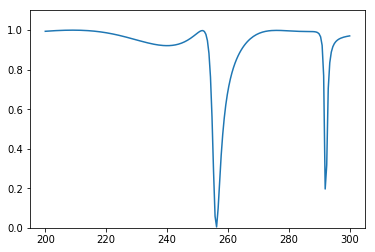

Predicted spectrum: 


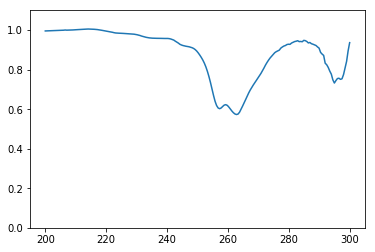

Test 33
True spectrum: 


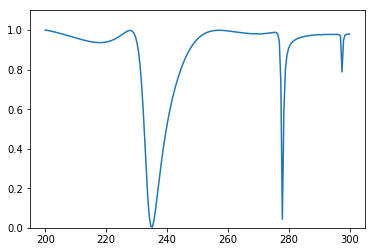

Predicted spectrum: 


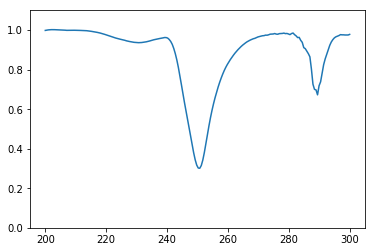

Test 34
True spectrum: 


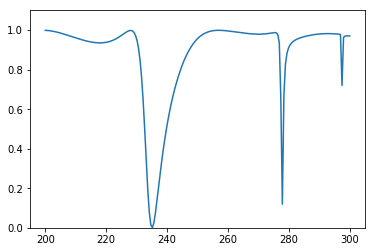

Predicted spectrum: 


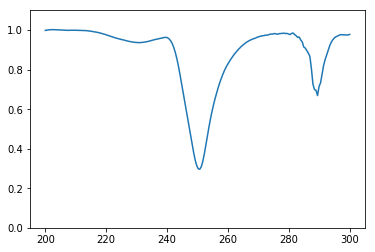

Test 35
True spectrum: 


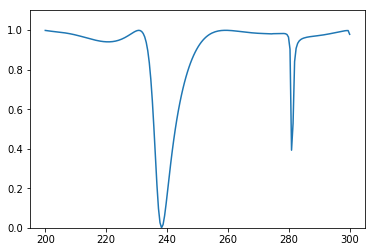

Predicted spectrum: 


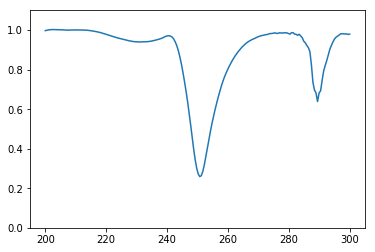

Test 36
True spectrum: 


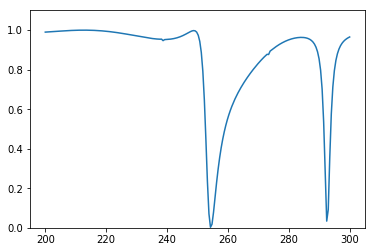

Predicted spectrum: 


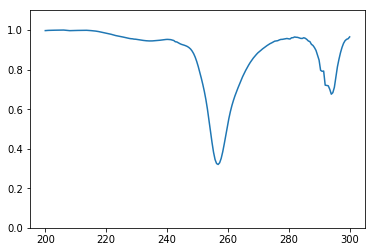

Test 37
True spectrum: 


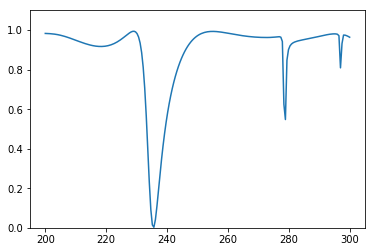

Predicted spectrum: 


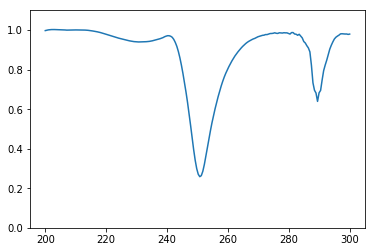

Test 38
True spectrum: 


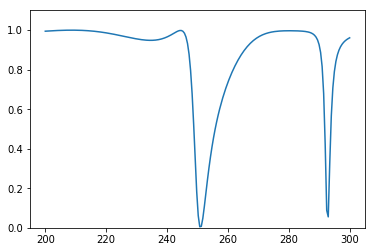

Predicted spectrum: 


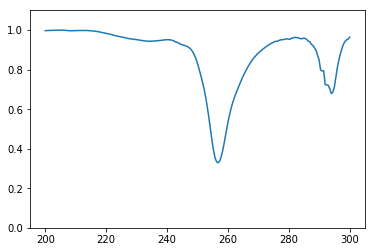

Test 39
True spectrum: 


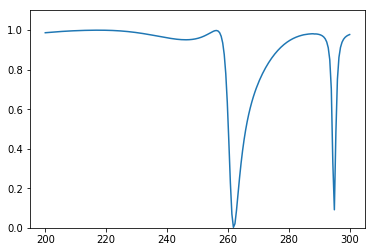

Predicted spectrum: 


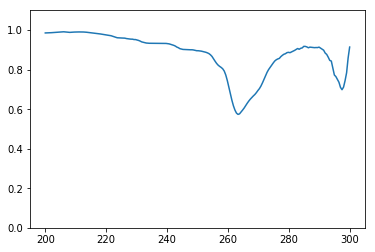

Test 40
True spectrum: 


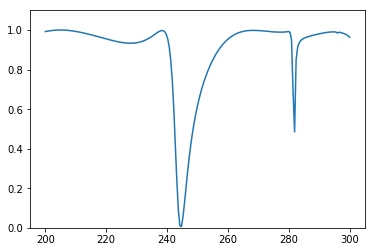

Predicted spectrum: 


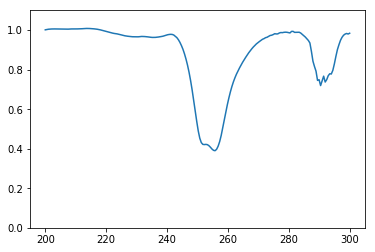

Test 41
True spectrum: 


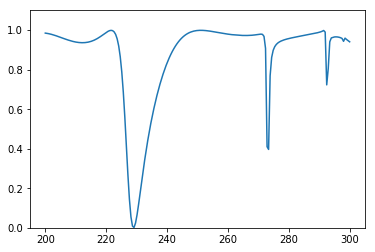

Predicted spectrum: 


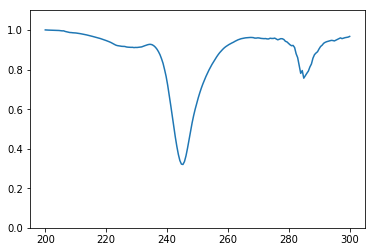

Test 42
True spectrum: 


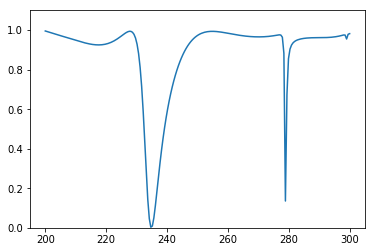

Predicted spectrum: 


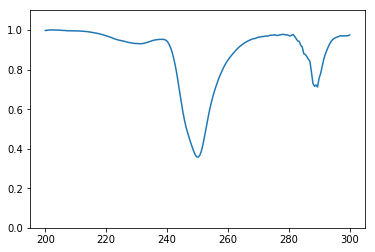

Test 43
True spectrum: 


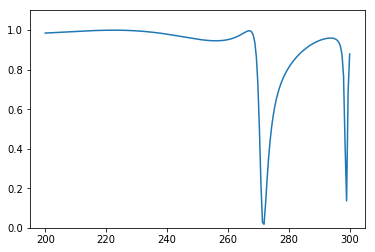

Predicted spectrum: 


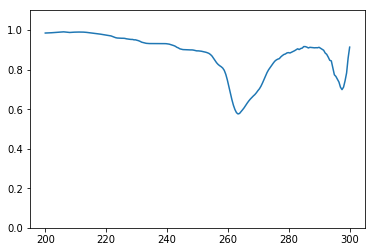

Test 44
True spectrum: 


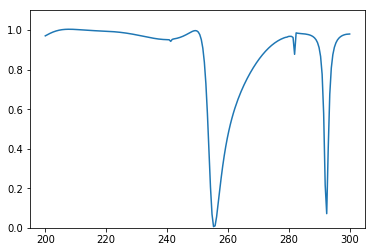

Predicted spectrum: 


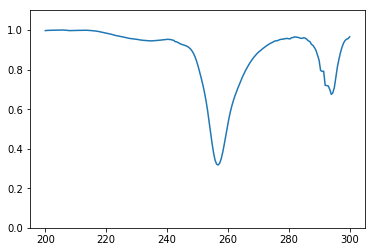

Test 45
True spectrum: 


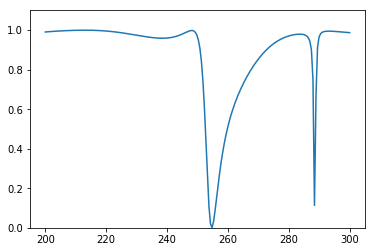

Predicted spectrum: 


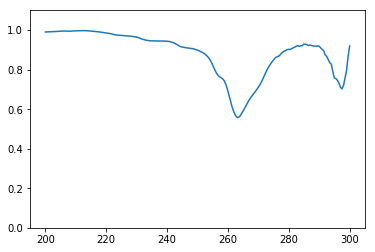

Test 46
True spectrum: 


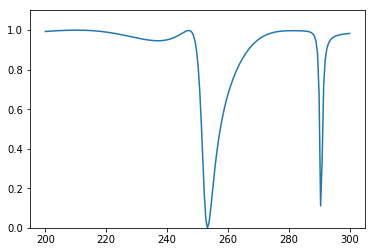

Predicted spectrum: 


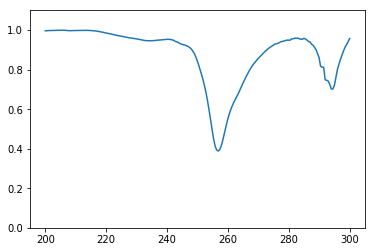

Test 47
True spectrum: 


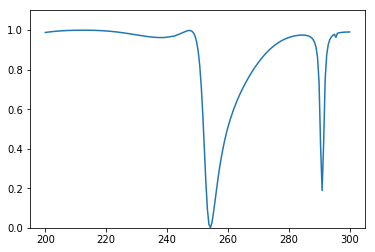

Predicted spectrum: 


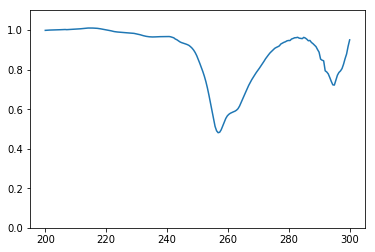

Test 48
True spectrum: 


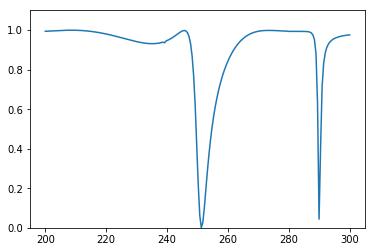

Predicted spectrum: 


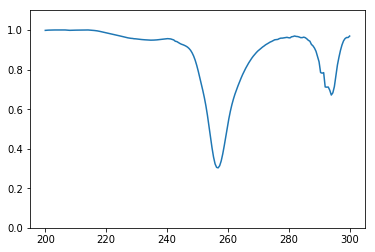

Test 49
True spectrum: 


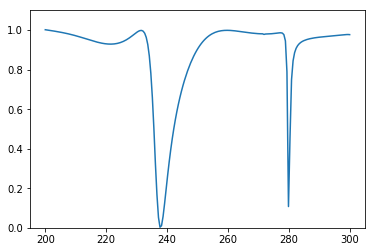

Predicted spectrum: 


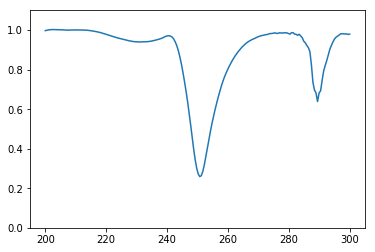

Test 50
True spectrum: 


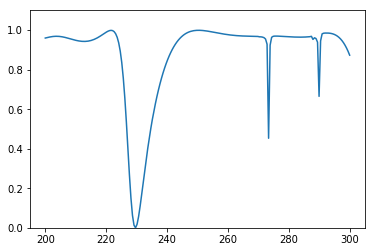

Predicted spectrum: 


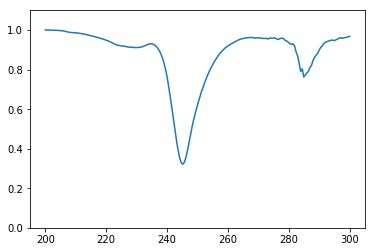

Test 51
True spectrum: 


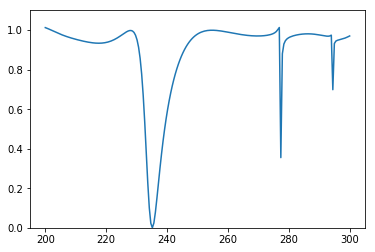

Predicted spectrum: 


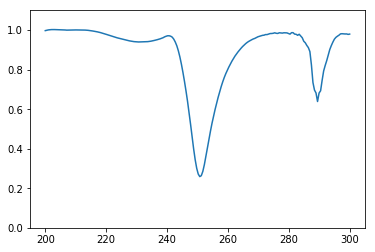

Test 52
True spectrum: 


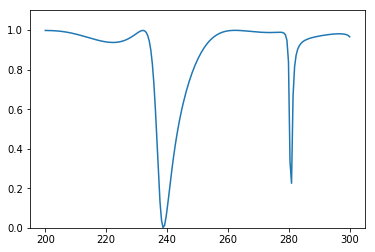

Predicted spectrum: 


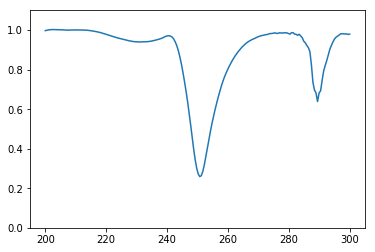

Test 53
True spectrum: 


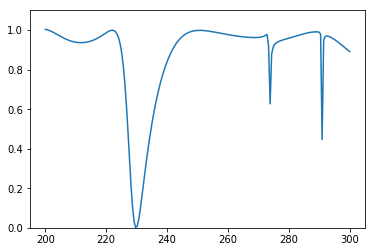

Predicted spectrum: 


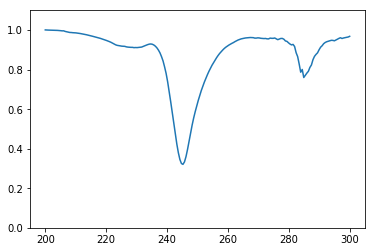

Test 54
True spectrum: 


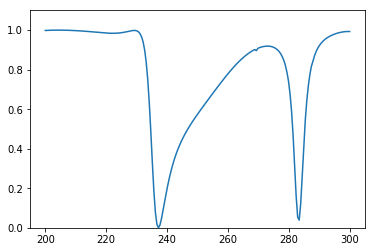

Predicted spectrum: 


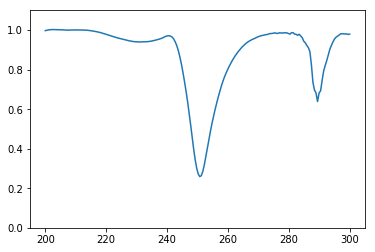

Test 55
True spectrum: 


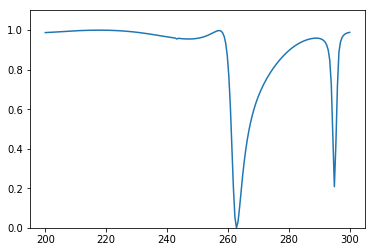

Predicted spectrum: 


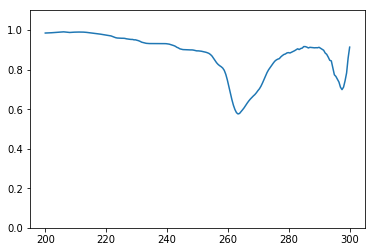

Test 56
True spectrum: 


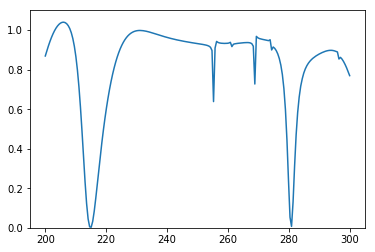

Predicted spectrum: 


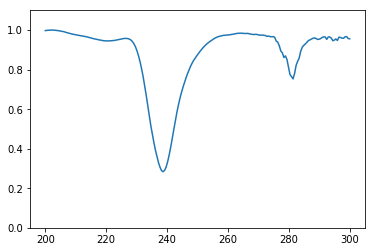

Test 57
True spectrum: 


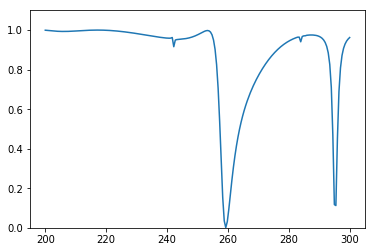

Predicted spectrum: 


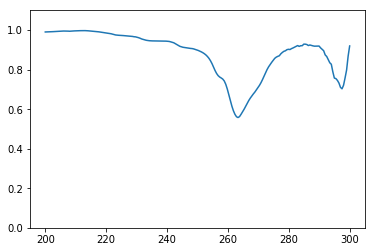

Test 58
True spectrum: 


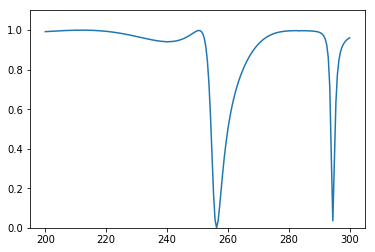

Predicted spectrum: 


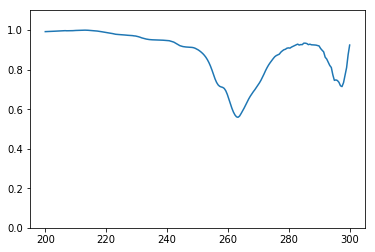

Test 59
True spectrum: 


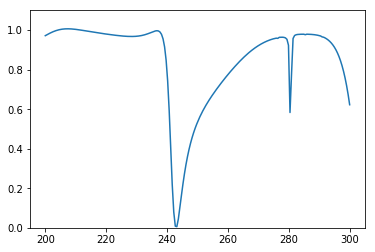

Predicted spectrum: 


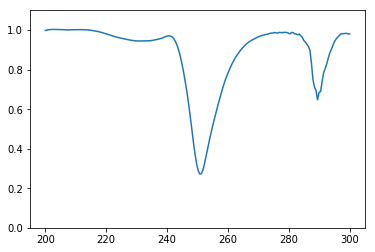

Test 60
True spectrum: 


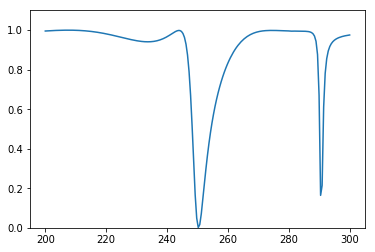

Predicted spectrum: 


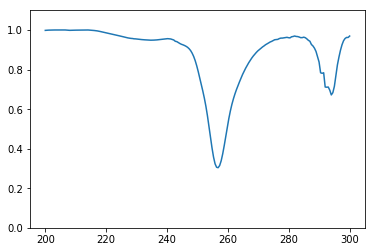

Test 61
True spectrum: 


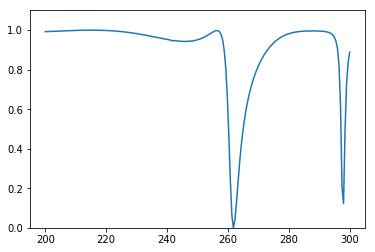

Predicted spectrum: 


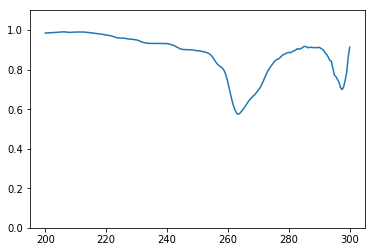

Test 62
True spectrum: 


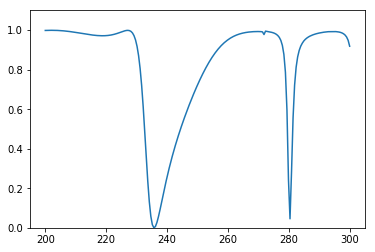

Predicted spectrum: 


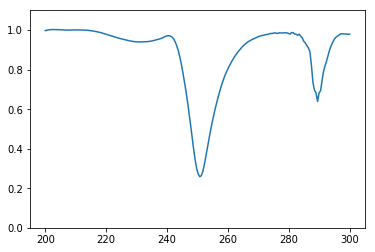

Test 63
True spectrum: 


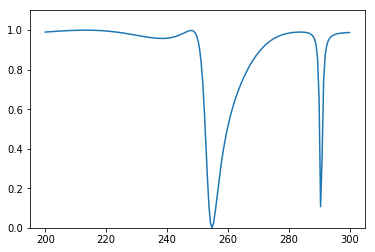

Predicted spectrum: 


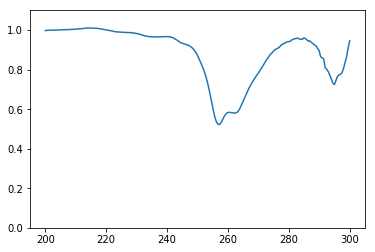

Test 64
True spectrum: 


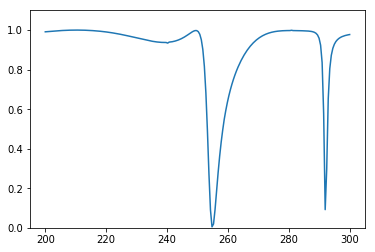

Predicted spectrum: 


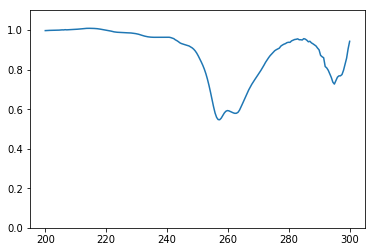

Test 65
True spectrum: 


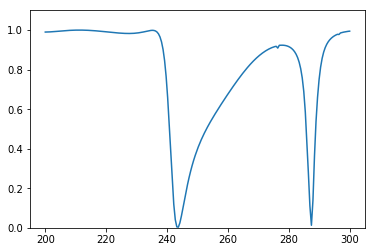

Predicted spectrum: 


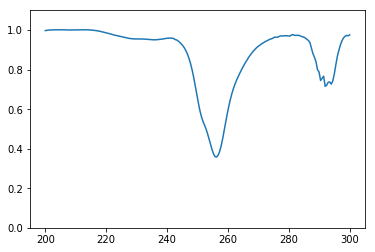

Test 66
True spectrum: 


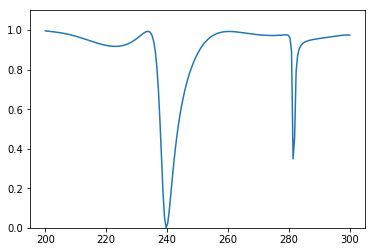

Predicted spectrum: 


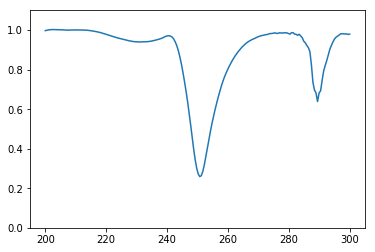

Test 67
True spectrum: 


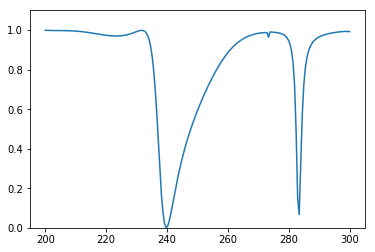

Predicted spectrum: 


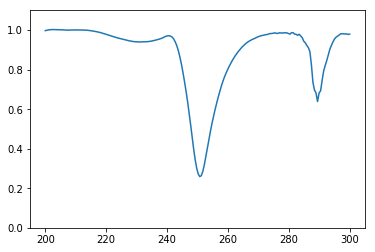

Test 68
True spectrum: 


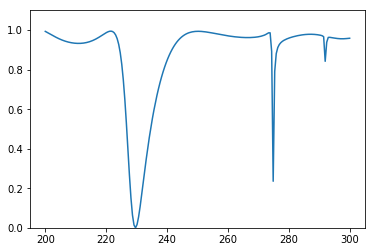

Predicted spectrum: 


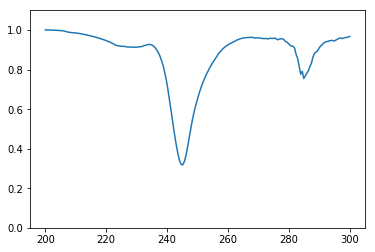

Test 69
True spectrum: 


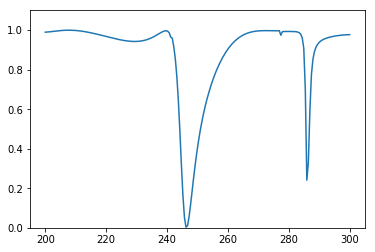

Predicted spectrum: 


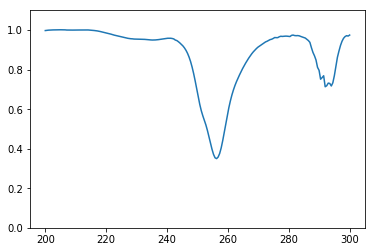

Test 70
True spectrum: 


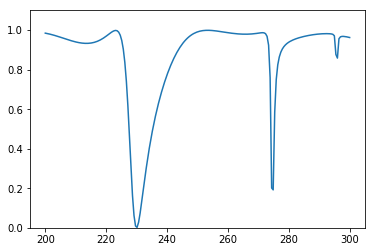

Predicted spectrum: 


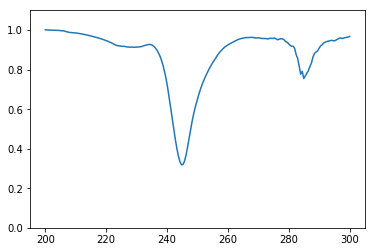

Test 71
True spectrum: 


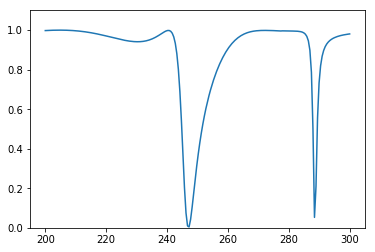

Predicted spectrum: 


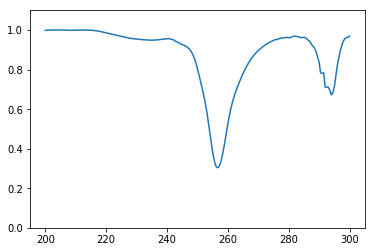

Test 72
True spectrum: 


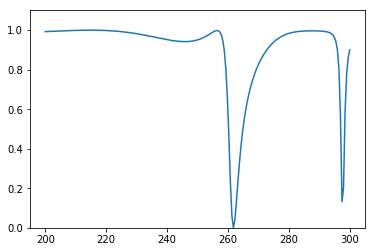

Predicted spectrum: 


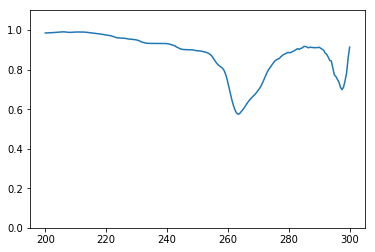

Test 73
True spectrum: 


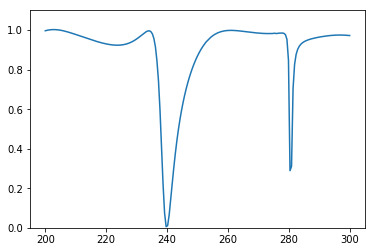

Predicted spectrum: 


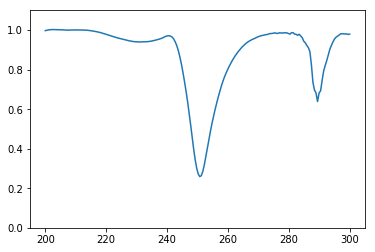

Test 74
True spectrum: 


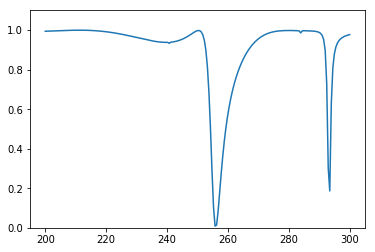

Predicted spectrum: 


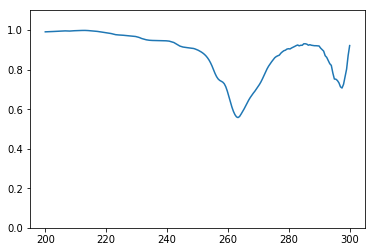

Test 75
True spectrum: 


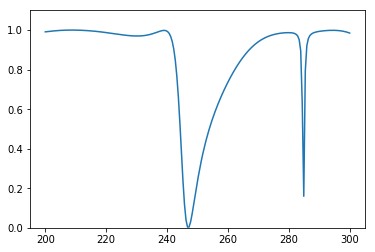

Predicted spectrum: 


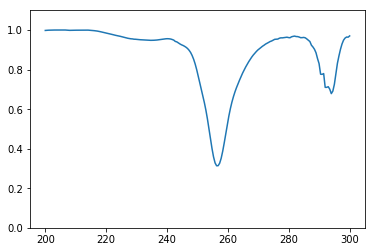

Test 76
True spectrum: 


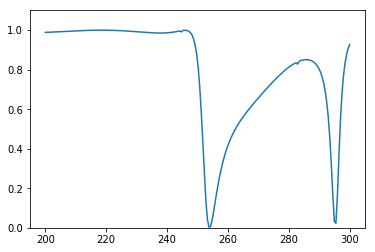

Predicted spectrum: 


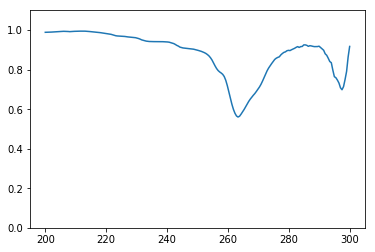

Test 77
True spectrum: 


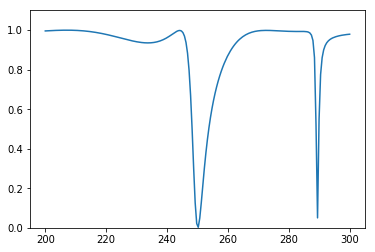

Predicted spectrum: 


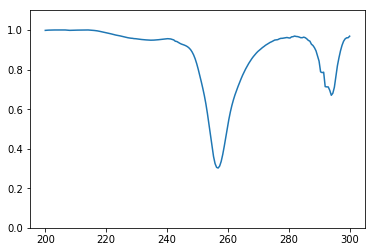

Test 78
True spectrum: 


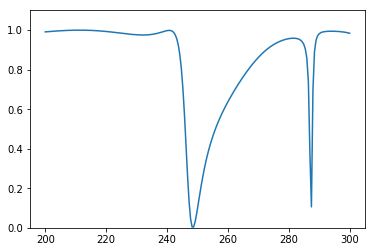

Predicted spectrum: 


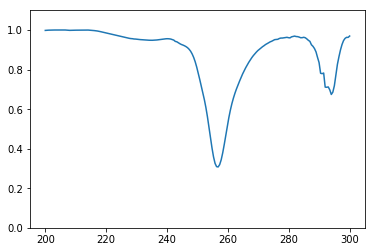

Test 79
True spectrum: 


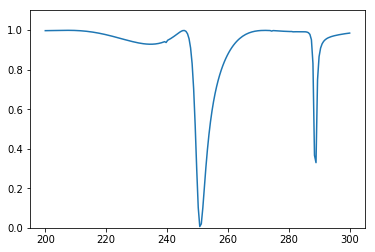

Predicted spectrum: 


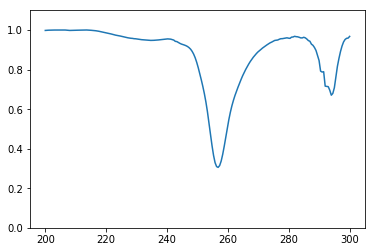

Test 80
True spectrum: 


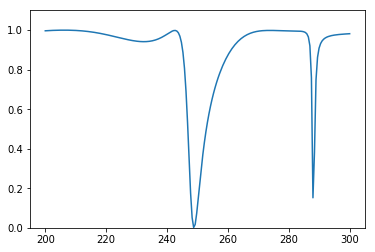

Predicted spectrum: 


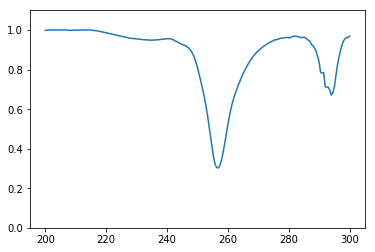

Test 81
True spectrum: 


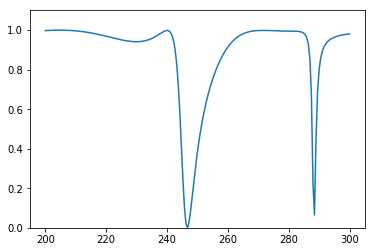

Predicted spectrum: 


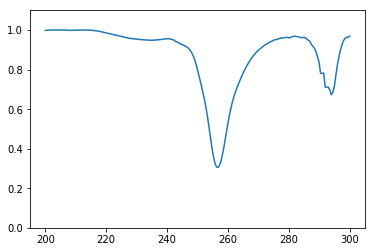

Test 82
True spectrum: 


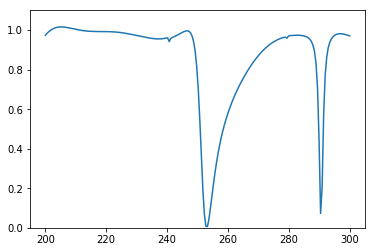

Predicted spectrum: 


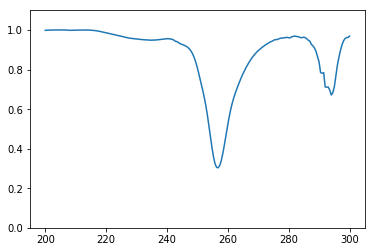

Test 83
True spectrum: 


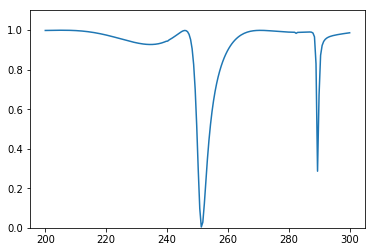

Predicted spectrum: 


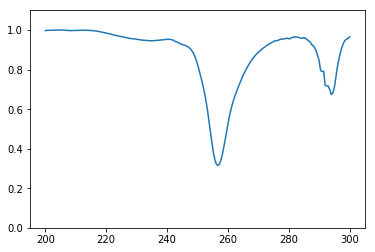

Test 84
True spectrum: 


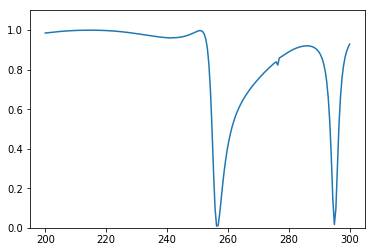

Predicted spectrum: 


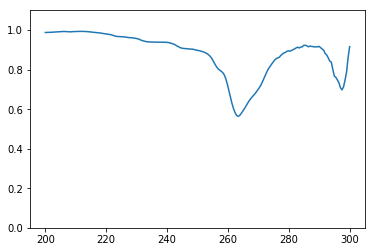

Test 85
True spectrum: 


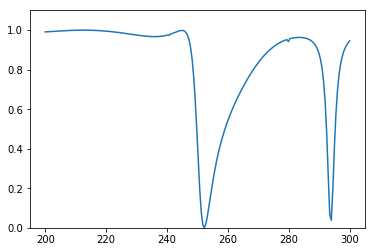

Predicted spectrum: 


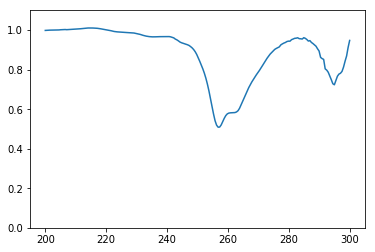

Test 86
True spectrum: 


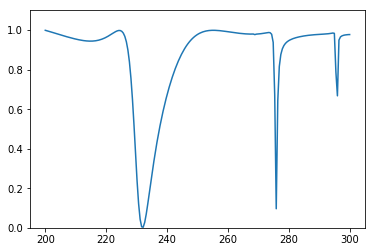

Predicted spectrum: 


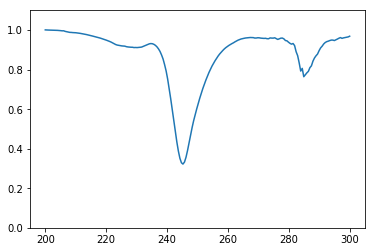

Test 87
True spectrum: 


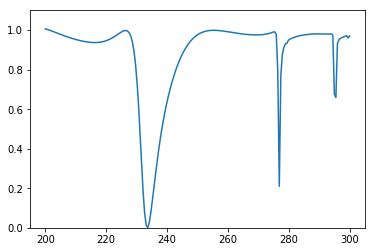

Predicted spectrum: 


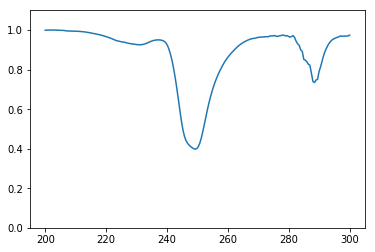

Test 88
True spectrum: 


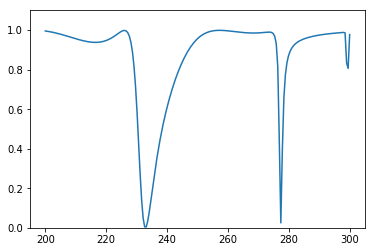

Predicted spectrum: 


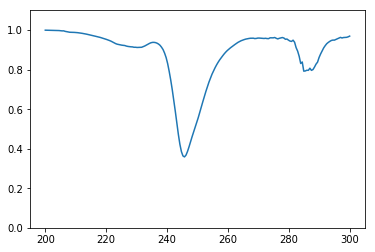

Test 89
True spectrum: 


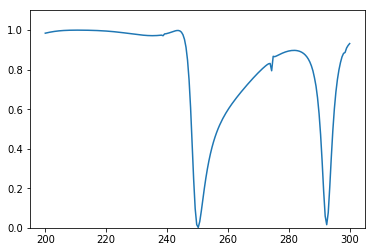

Predicted spectrum: 


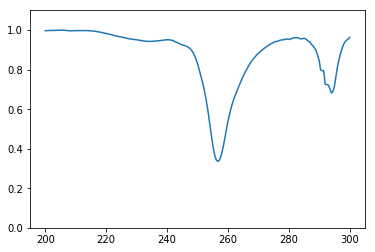

Test 90
True spectrum: 


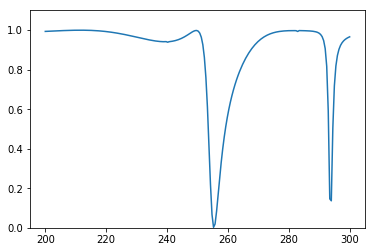

Predicted spectrum: 


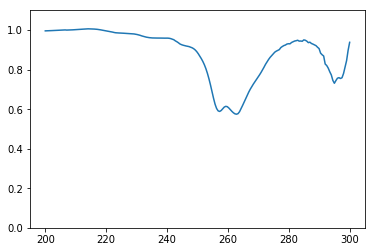

Test 91
True spectrum: 


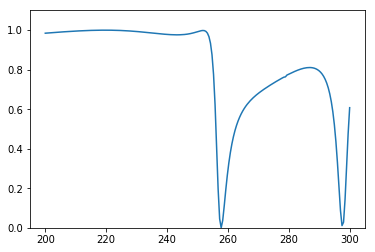

Predicted spectrum: 


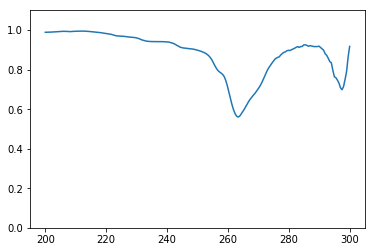

Test 92
True spectrum: 


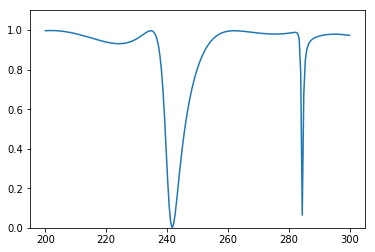

Predicted spectrum: 


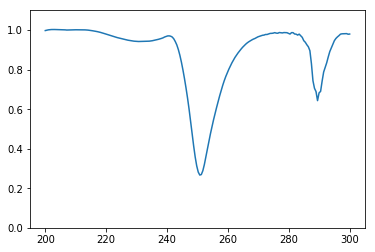

Test 93
True spectrum: 


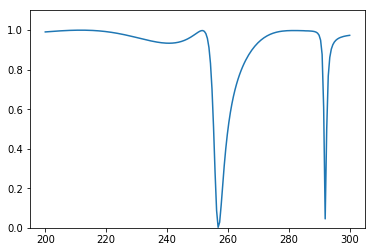

Predicted spectrum: 


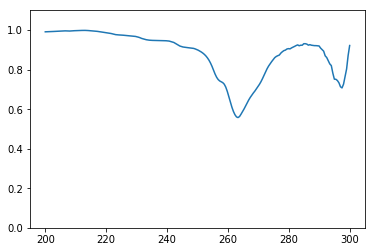

Test 94
True spectrum: 


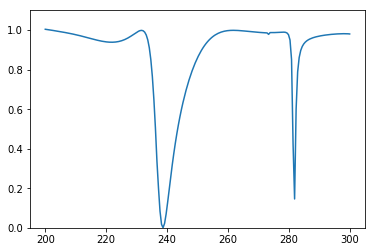

Predicted spectrum: 


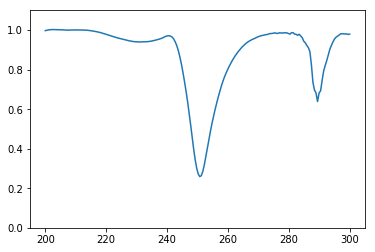

Test 95
True spectrum: 


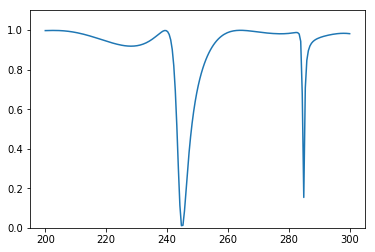

Predicted spectrum: 


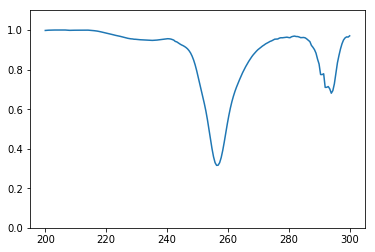

Test 96
True spectrum: 


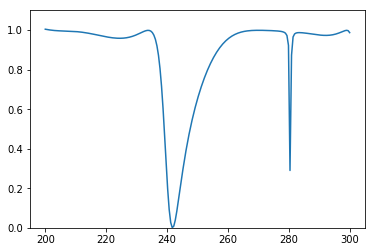

Predicted spectrum: 


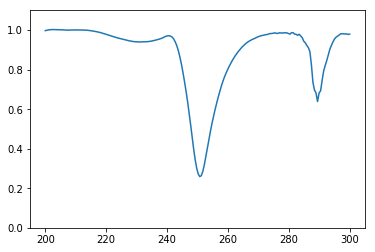

Test 97
True spectrum: 


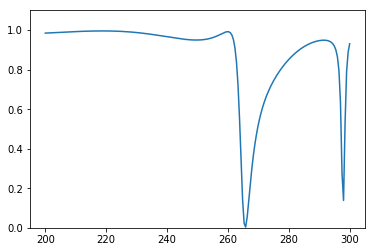

Predicted spectrum: 


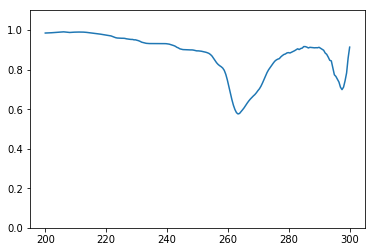

Test 98
True spectrum: 


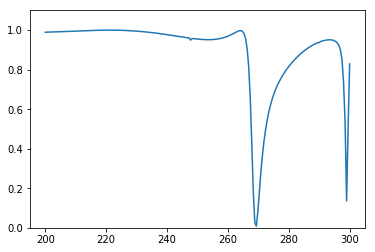

Predicted spectrum: 


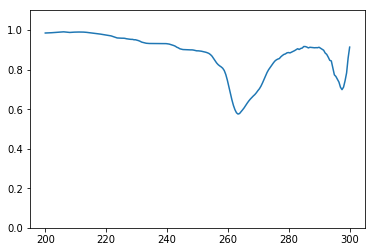

Test 99
True spectrum: 


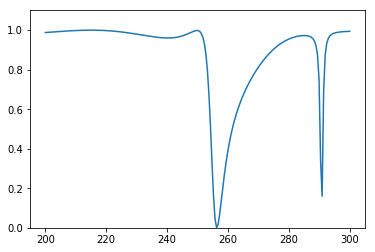

Predicted spectrum: 


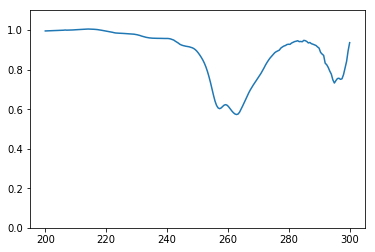

Test 100
True spectrum: 


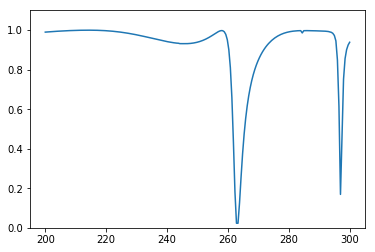

Predicted spectrum: 


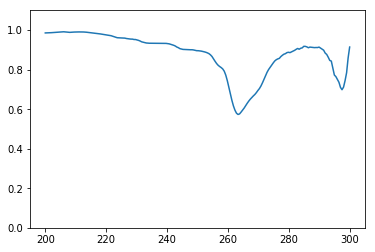

Test 101
True spectrum: 


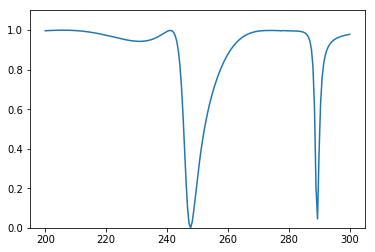

Predicted spectrum: 


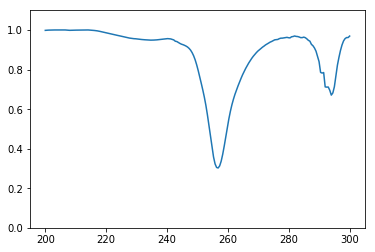

Test 102
True spectrum: 


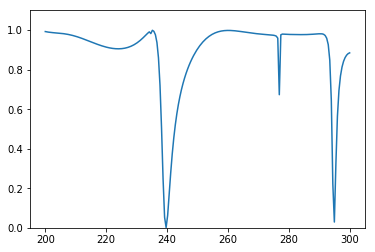

Predicted spectrum: 


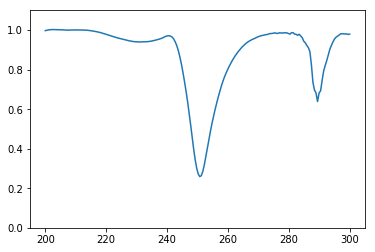

Test 103
True spectrum: 


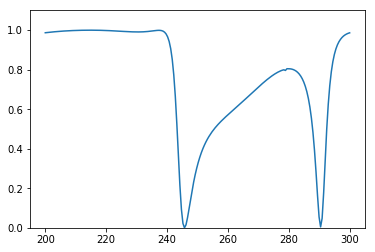

Predicted spectrum: 


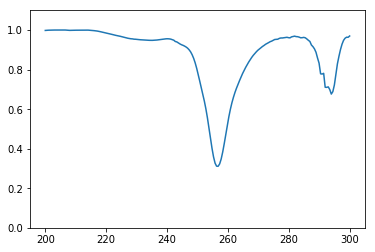

Test 104
True spectrum: 


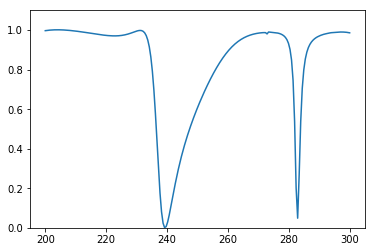

Predicted spectrum: 


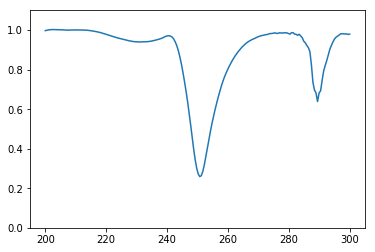

Test 105
True spectrum: 


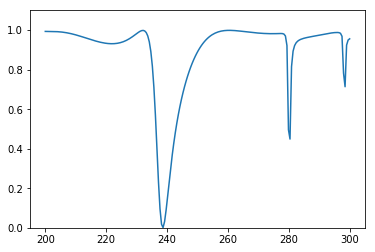

Predicted spectrum: 


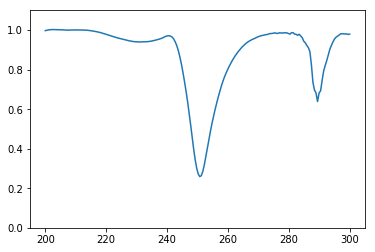

Test 106
True spectrum: 


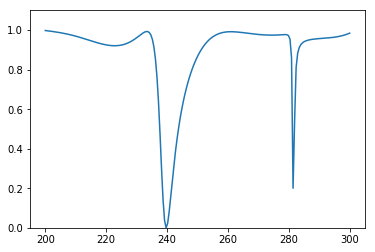

Predicted spectrum: 


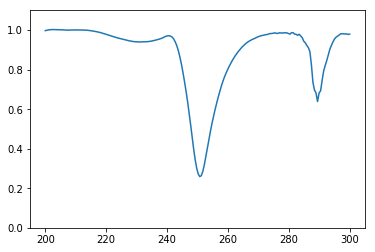

Test 107
True spectrum: 


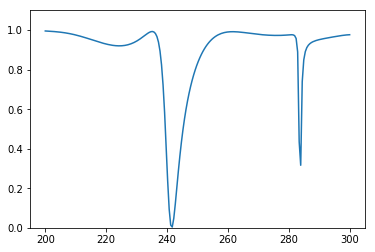

Predicted spectrum: 


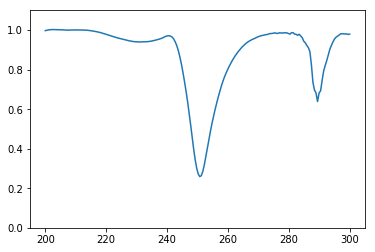

Test 108
True spectrum: 


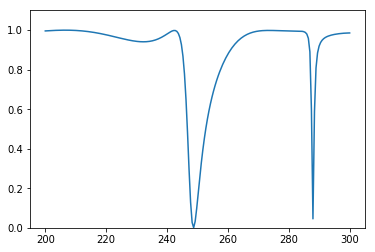

Predicted spectrum: 


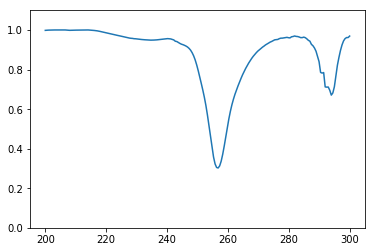

Test 109
True spectrum: 


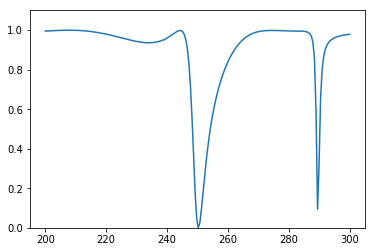

Predicted spectrum: 


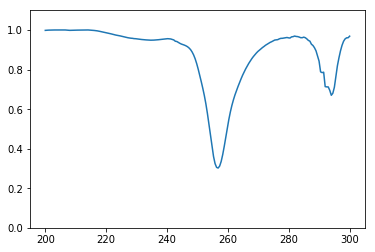

Test 110
True spectrum: 


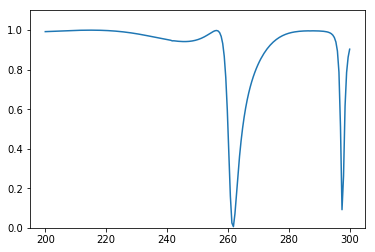

Predicted spectrum: 


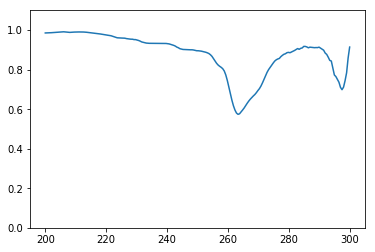

Test 111
True spectrum: 


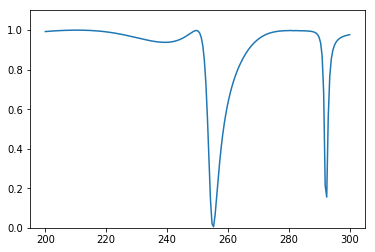

Predicted spectrum: 


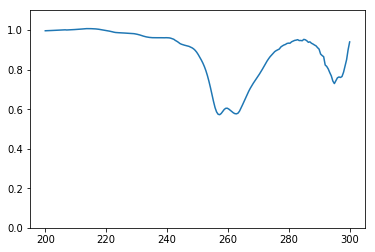

Test 112
True spectrum: 


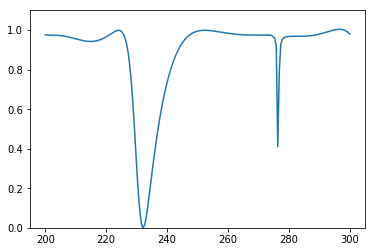

Predicted spectrum: 


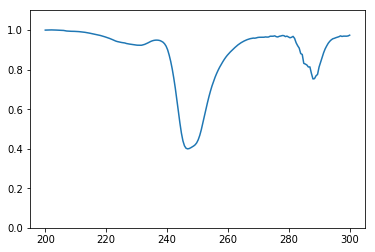

Test 113
True spectrum: 


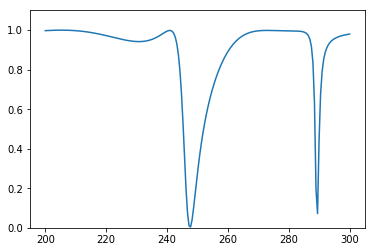

Predicted spectrum: 


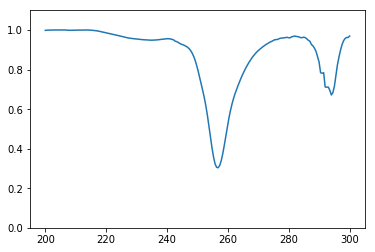

Test 114
True spectrum: 


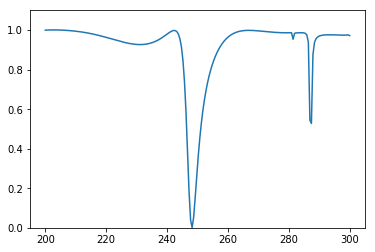

Predicted spectrum: 


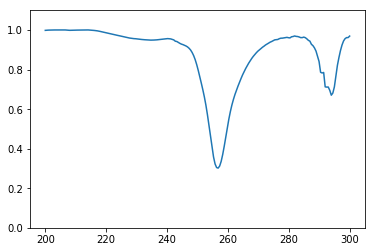

Test 115
True spectrum: 


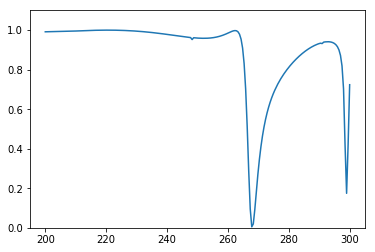

Predicted spectrum: 


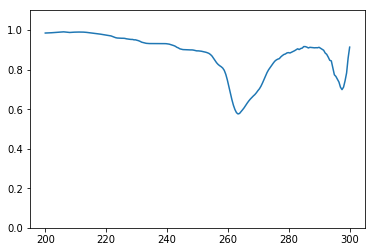

Test 116
True spectrum: 


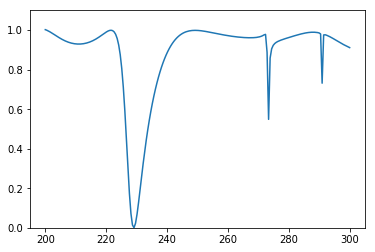

Predicted spectrum: 


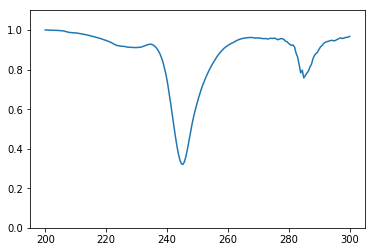

Test 117
True spectrum: 


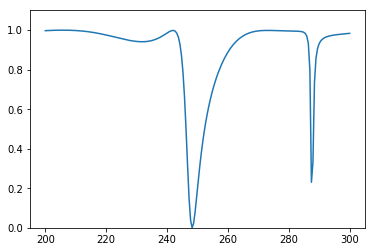

Predicted spectrum: 


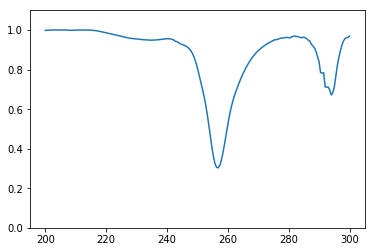

Test 118
True spectrum: 


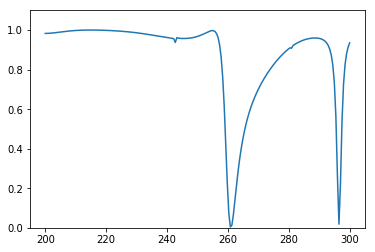

Predicted spectrum: 


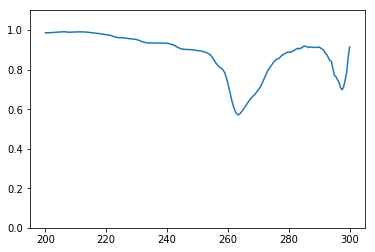

Test 119
True spectrum: 


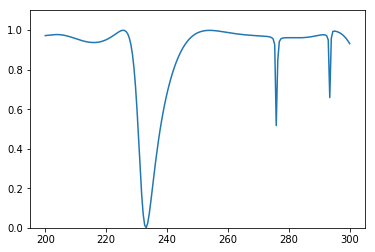

Predicted spectrum: 


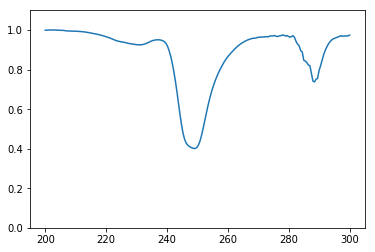

Test 120
True spectrum: 


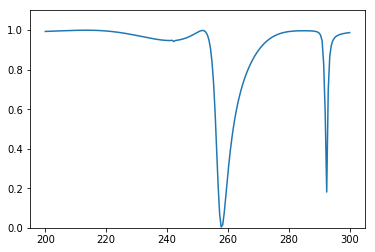

Predicted spectrum: 


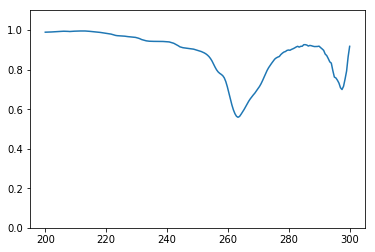

Test 121
True spectrum: 


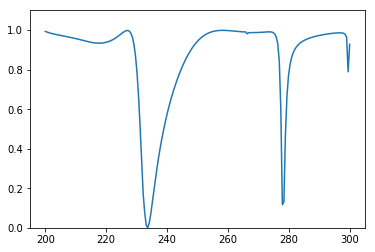

Predicted spectrum: 


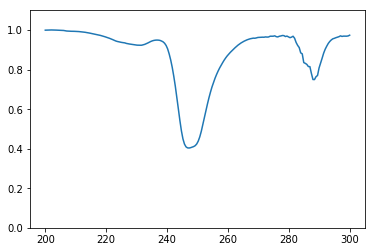

Test 122
True spectrum: 


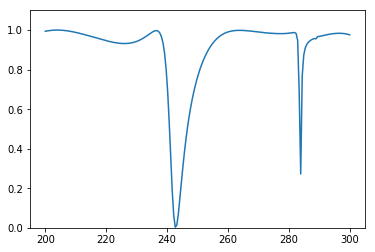

Predicted spectrum: 


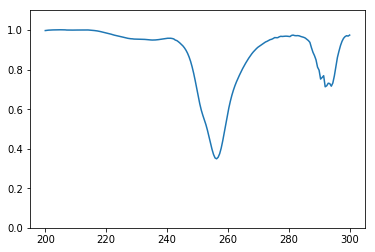

Test 123
True spectrum: 


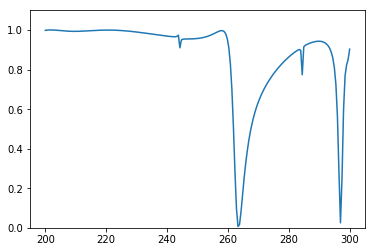

Predicted spectrum: 


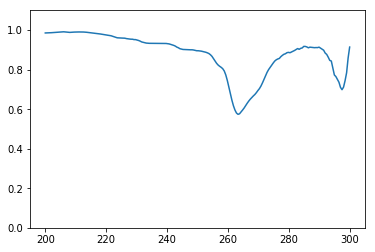

Test 124
True spectrum: 


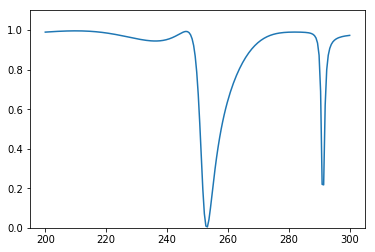

Predicted spectrum: 


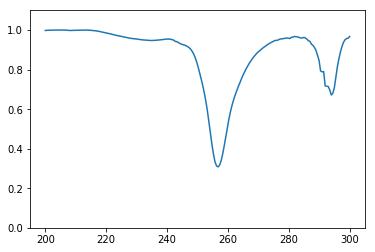

Test 125
True spectrum: 


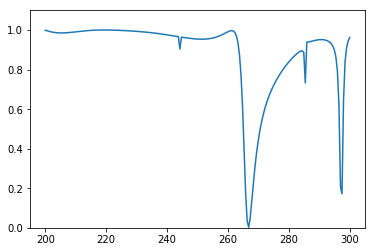

Predicted spectrum: 


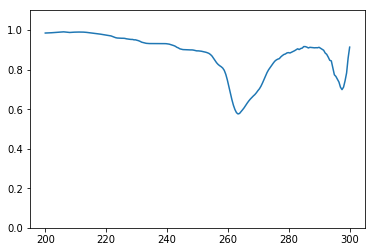

Test 126
True spectrum: 


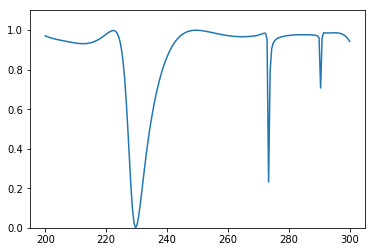

Predicted spectrum: 


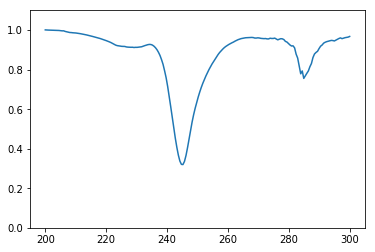

Test 127
True spectrum: 


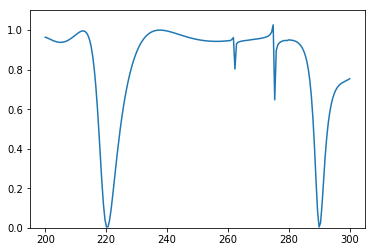

Predicted spectrum: 


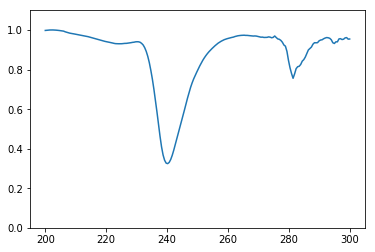

Test 128
True spectrum: 


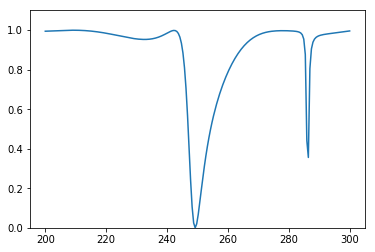

Predicted spectrum: 


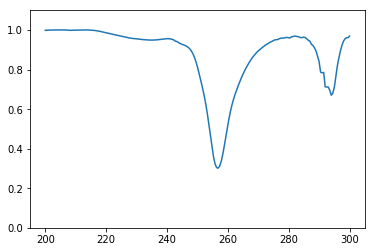

Test 129
True spectrum: 


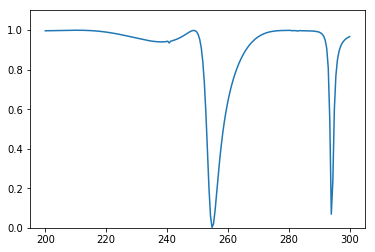

Predicted spectrum: 


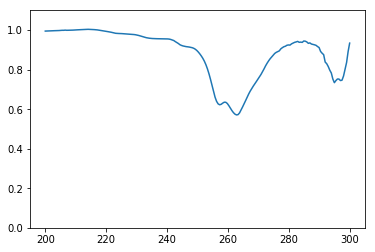

Test 130
True spectrum: 


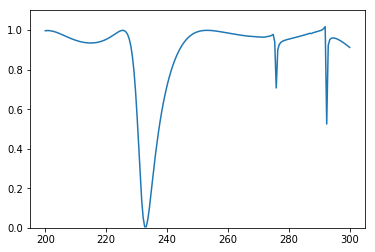

Predicted spectrum: 


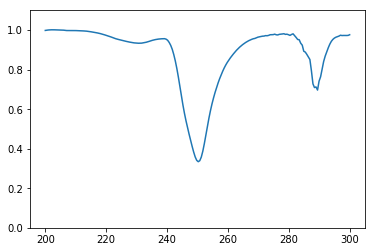

Test 131
True spectrum: 


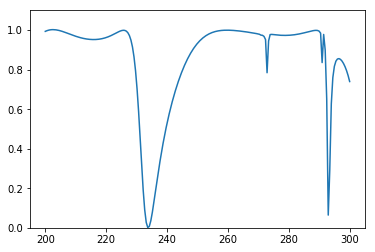

Predicted spectrum: 


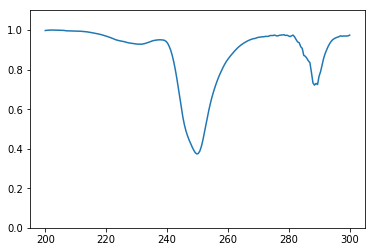

Test 132
True spectrum: 


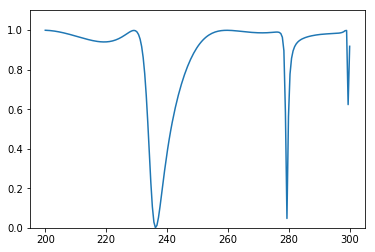

Predicted spectrum: 


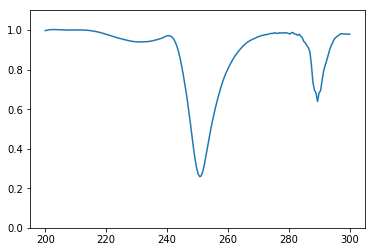

Test 133
True spectrum: 


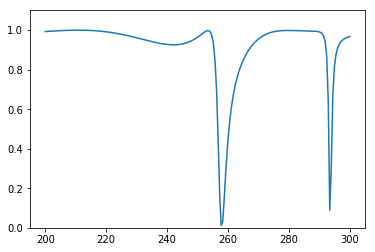

Predicted spectrum: 


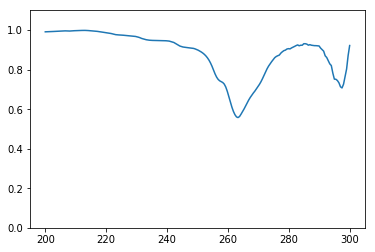

Test 134
True spectrum: 


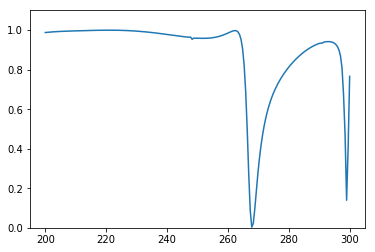

Predicted spectrum: 


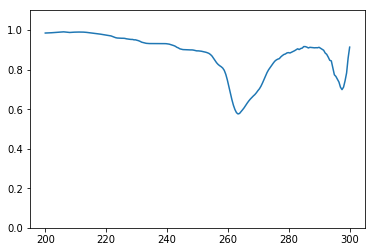

Test 135
True spectrum: 


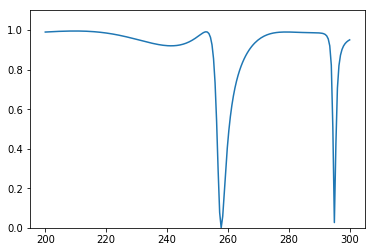

Predicted spectrum: 


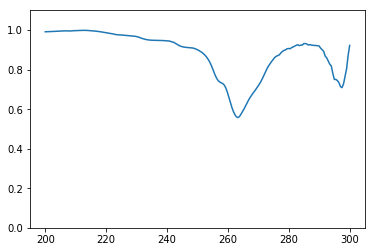

Test 136
True spectrum: 


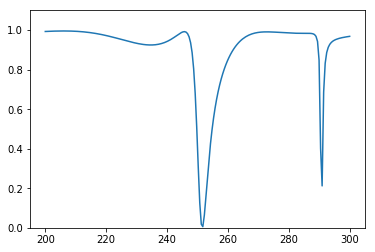

Predicted spectrum: 


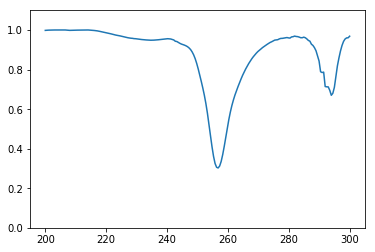

Test 137
True spectrum: 


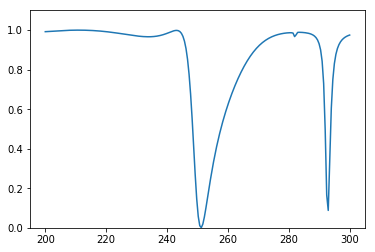

Predicted spectrum: 


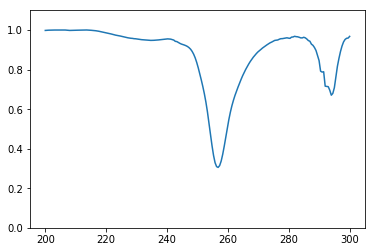

Test 138
True spectrum: 


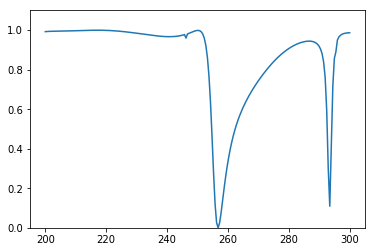

Predicted spectrum: 


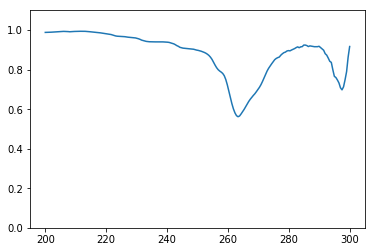

Test 139
True spectrum: 


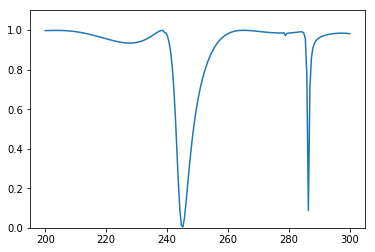

Predicted spectrum: 


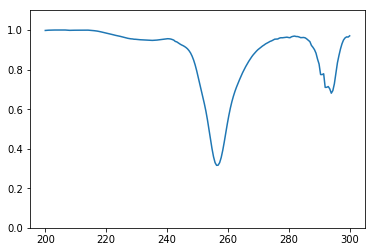

Test 140
True spectrum: 


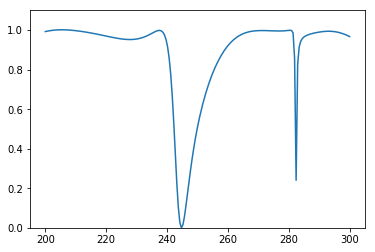

Predicted spectrum: 


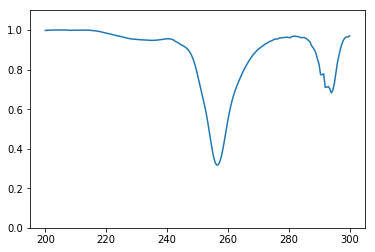

Test 141
True spectrum: 


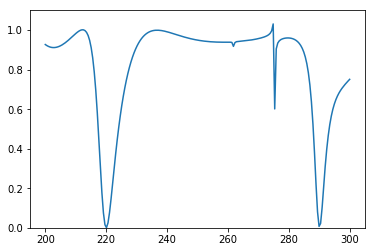

Predicted spectrum: 


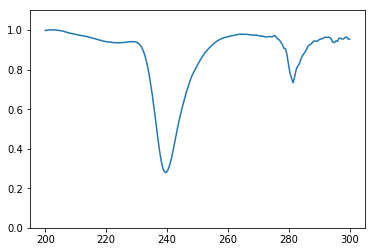

Test 142
True spectrum: 


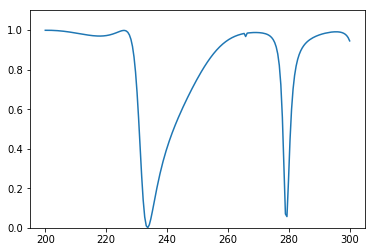

Predicted spectrum: 


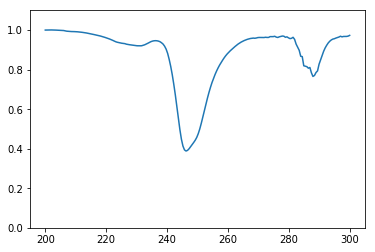

Test 143
True spectrum: 


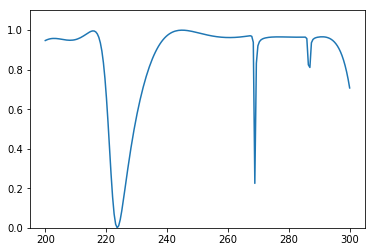

Predicted spectrum: 


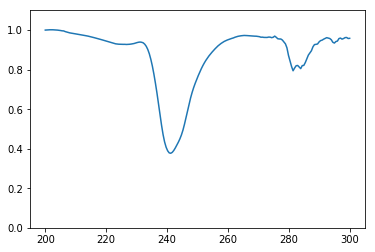

Test 144
True spectrum: 


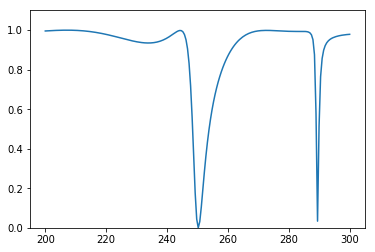

Predicted spectrum: 


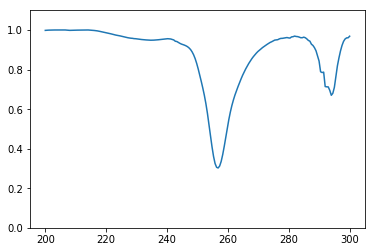

Test 145
True spectrum: 


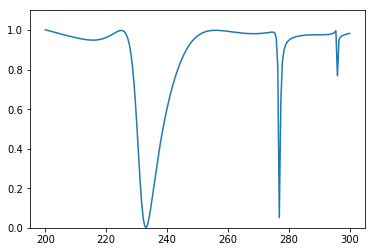

Predicted spectrum: 


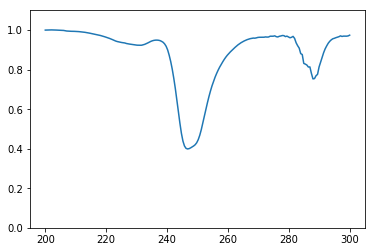

Test 146
True spectrum: 


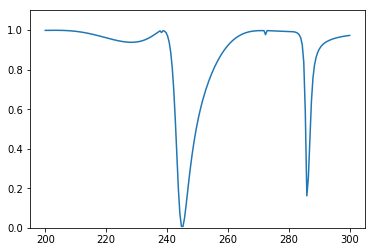

Predicted spectrum: 


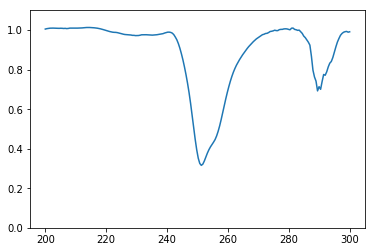

Test 147
True spectrum: 


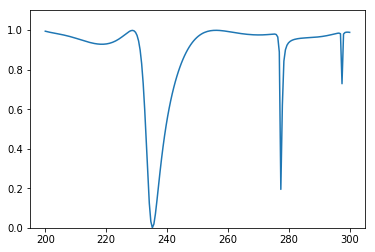

Predicted spectrum: 


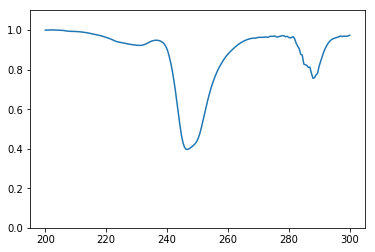

Test 148
True spectrum: 


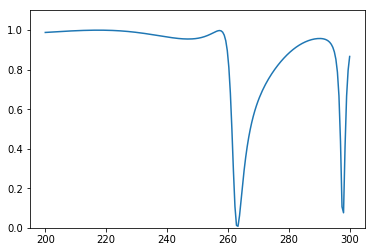

Predicted spectrum: 


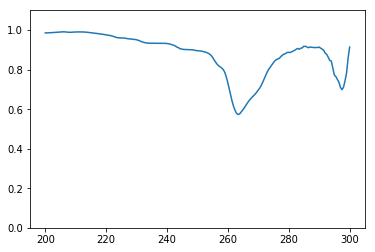

Test 149
True spectrum: 


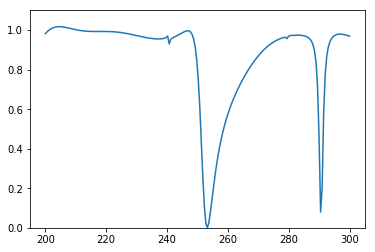

Predicted spectrum: 


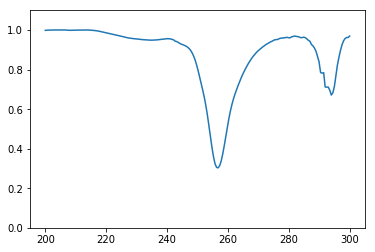

Test 150
True spectrum: 


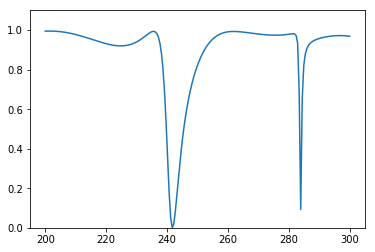

Predicted spectrum: 


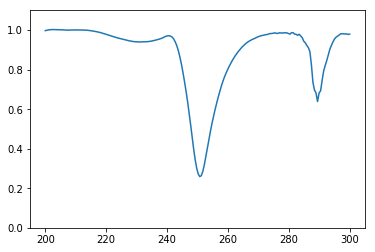

Test 151
True spectrum: 


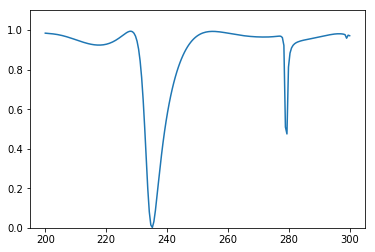

Predicted spectrum: 


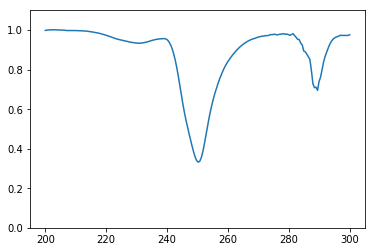

Test 152
True spectrum: 


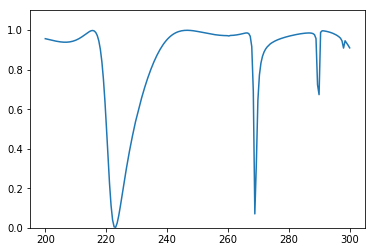

Predicted spectrum: 


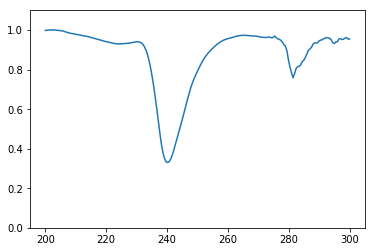

Test 153
True spectrum: 


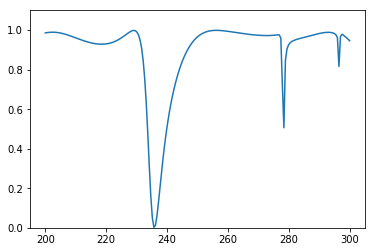

Predicted spectrum: 


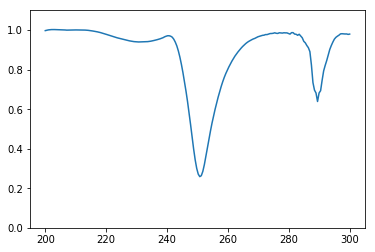

Test 154
True spectrum: 


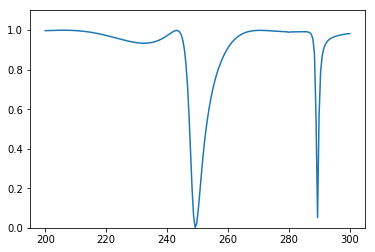

Predicted spectrum: 


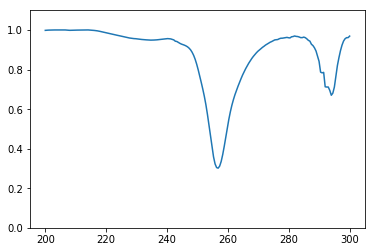

Test 155
True spectrum: 


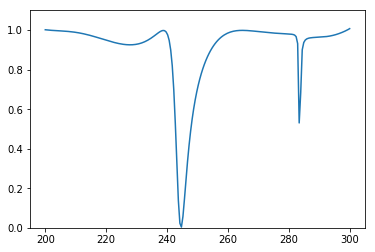

Predicted spectrum: 


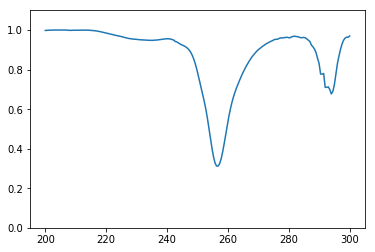

Test 156
True spectrum: 


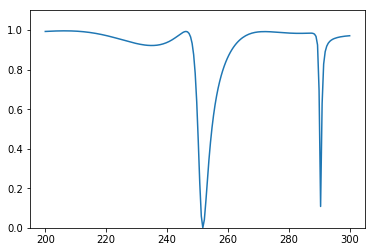

Predicted spectrum: 


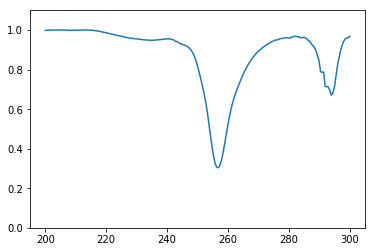

Test 157
True spectrum: 


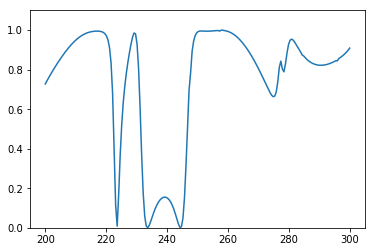

Predicted spectrum: 


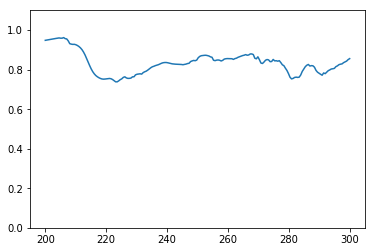

Test 158
True spectrum: 


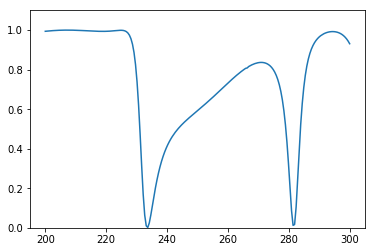

Predicted spectrum: 


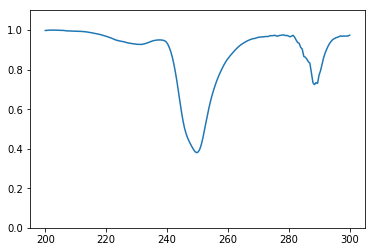

Test 159
True spectrum: 


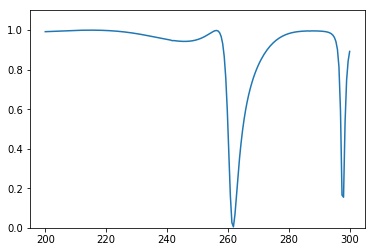

Predicted spectrum: 


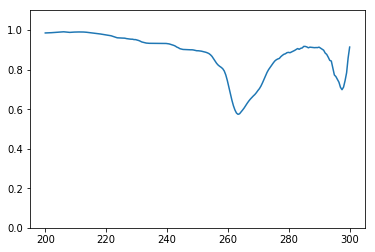

Test 160
True spectrum: 


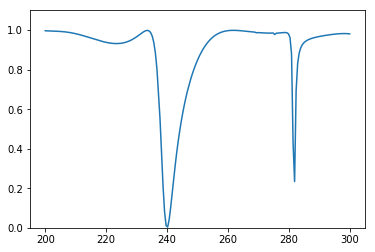

Predicted spectrum: 


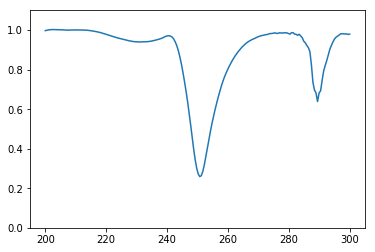

Test 161
True spectrum: 


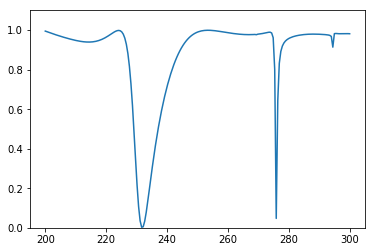

Predicted spectrum: 


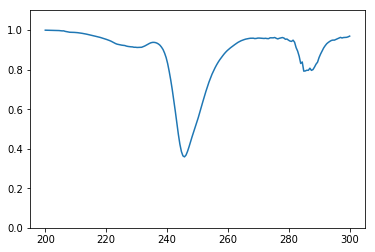

Test 162
True spectrum: 


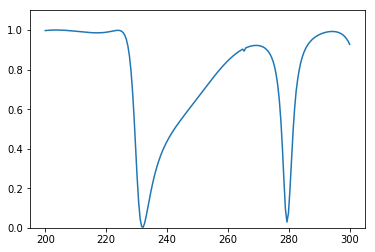

Predicted spectrum: 


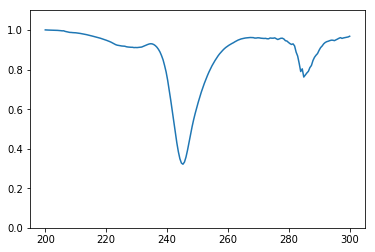

Test 163
True spectrum: 


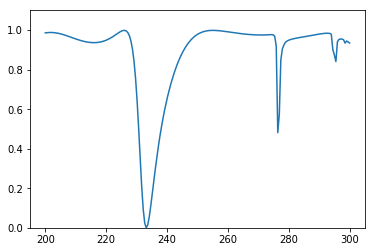

Predicted spectrum: 


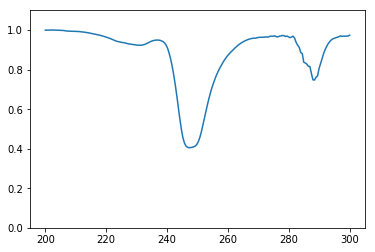

Test 164
True spectrum: 


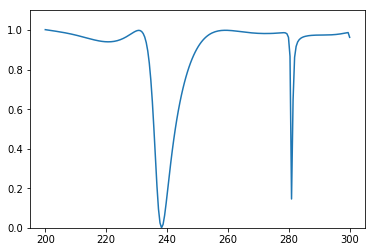

Predicted spectrum: 


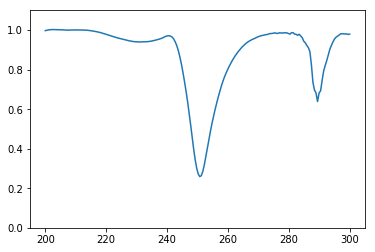

Test 165
True spectrum: 


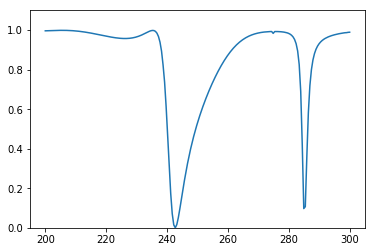

Predicted spectrum: 


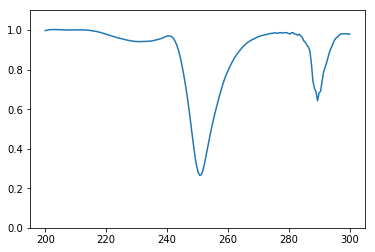

Test 166
True spectrum: 


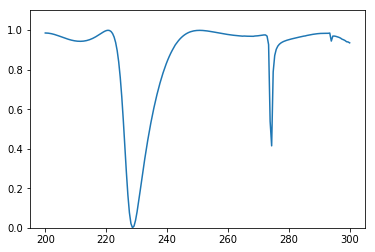

Predicted spectrum: 


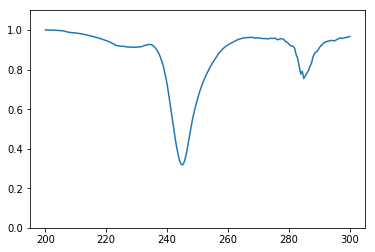

Test 167
True spectrum: 


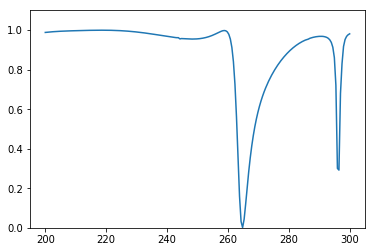

Predicted spectrum: 


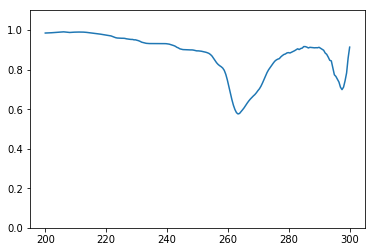

Test 168
True spectrum: 


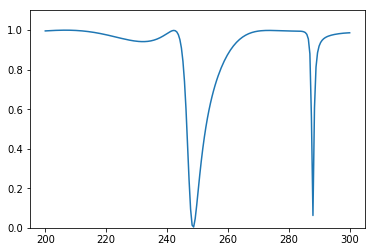

Predicted spectrum: 


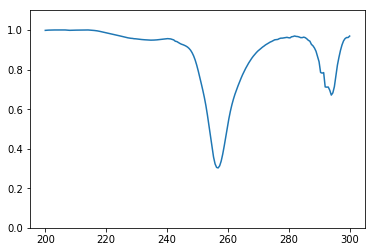

Test 169
True spectrum: 


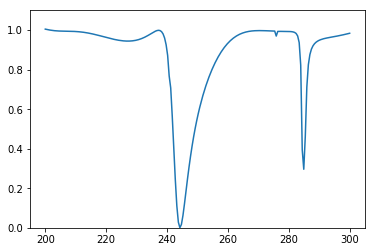

Predicted spectrum: 


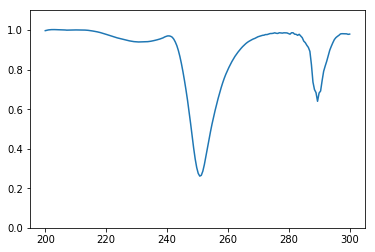

Test 170
True spectrum: 


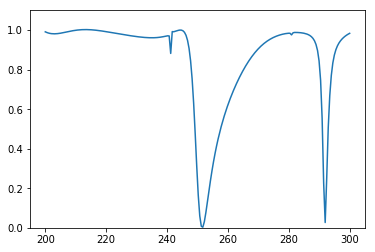

Predicted spectrum: 


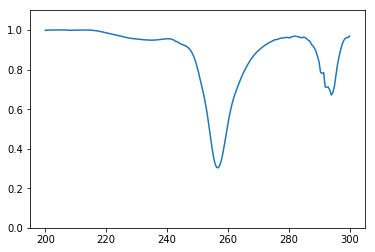

Test 171
True spectrum: 


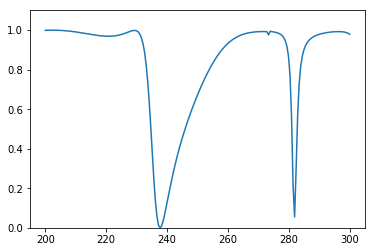

Predicted spectrum: 


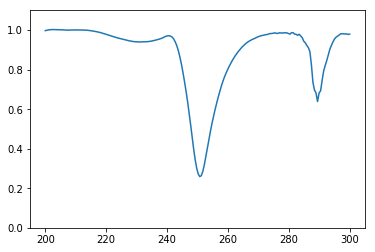

Test 172
True spectrum: 


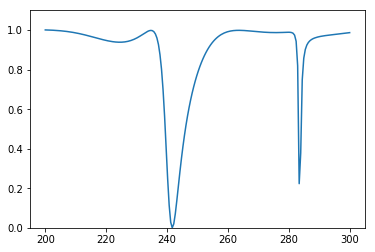

Predicted spectrum: 


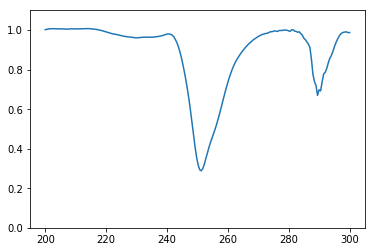

Test 173
True spectrum: 


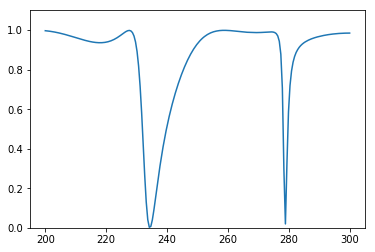

Predicted spectrum: 


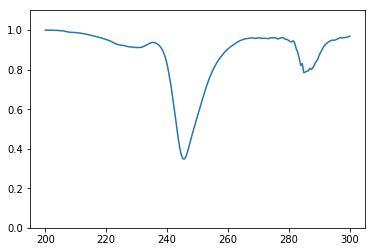

Test 174
True spectrum: 


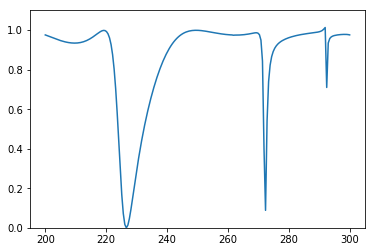

Predicted spectrum: 


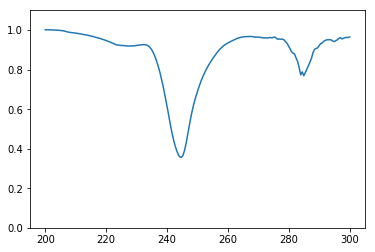

Test 175
True spectrum: 


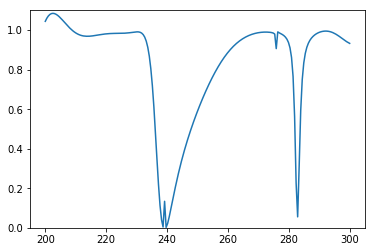

Predicted spectrum: 


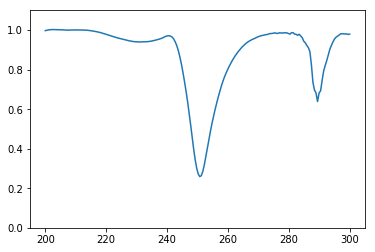

Test 176
True spectrum: 


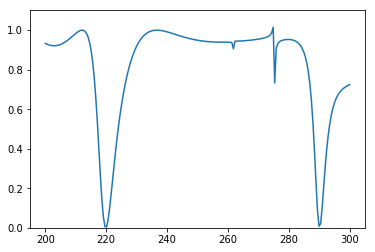

Predicted spectrum: 


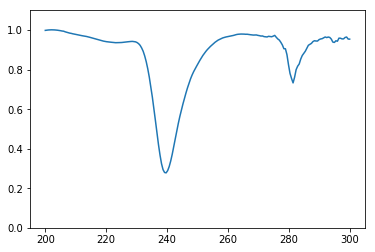

Test 177
True spectrum: 


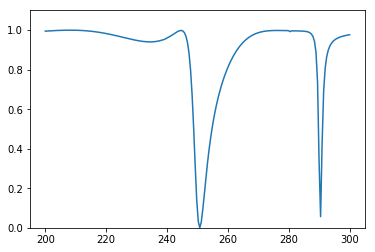

Predicted spectrum: 


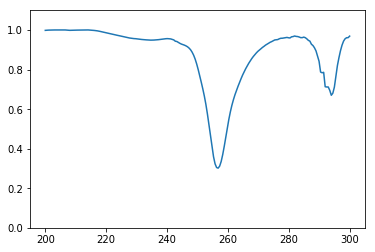

Test 178
True spectrum: 


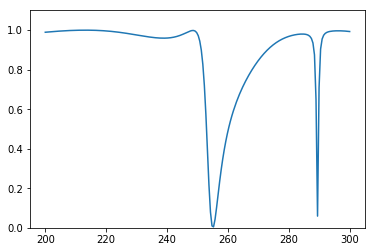

Predicted spectrum: 


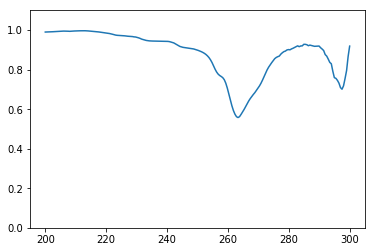

Test 179
True spectrum: 


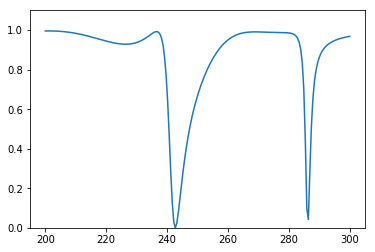

Predicted spectrum: 


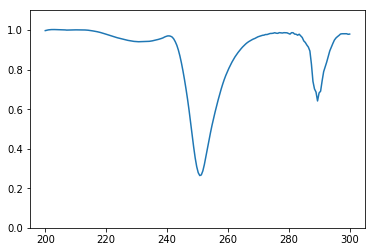

Test 180
True spectrum: 


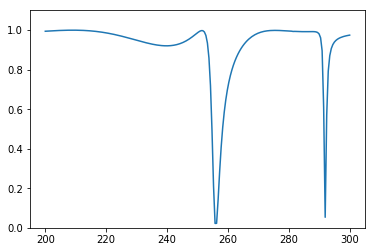

Predicted spectrum: 


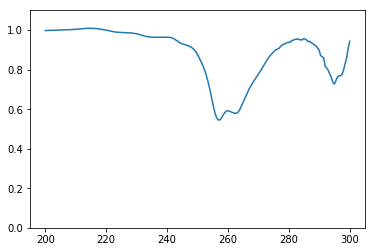

Test 181
True spectrum: 


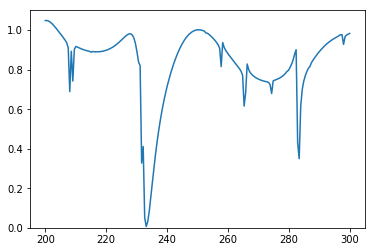

Predicted spectrum: 


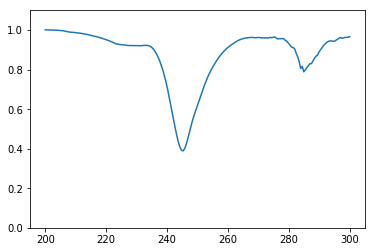

Test 182
True spectrum: 


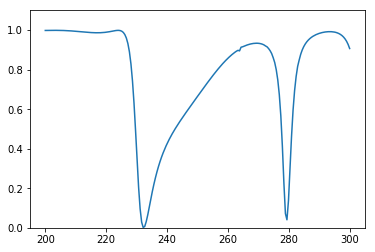

Predicted spectrum: 


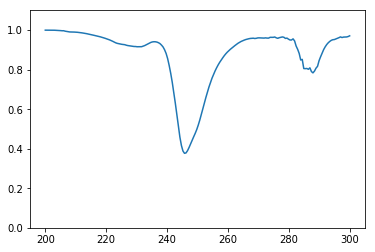

Test 183
True spectrum: 


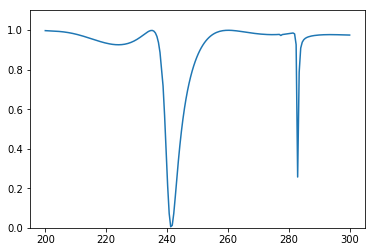

Predicted spectrum: 


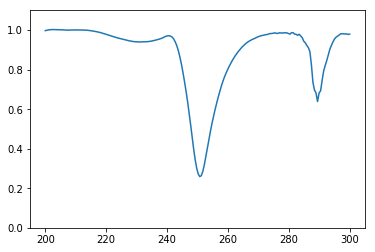

Test 184
True spectrum: 


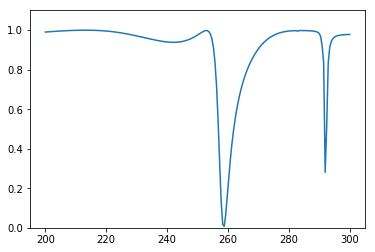

Predicted spectrum: 


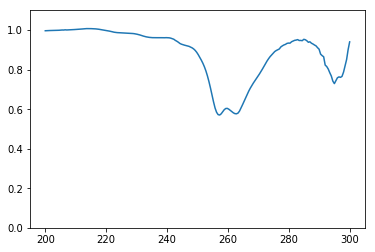

Test 185
True spectrum: 


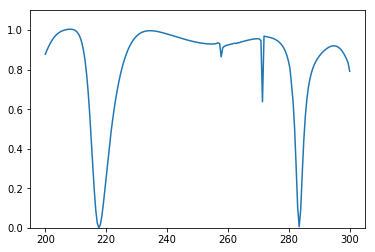

Predicted spectrum: 


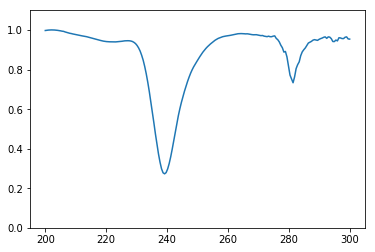

Test 186
True spectrum: 


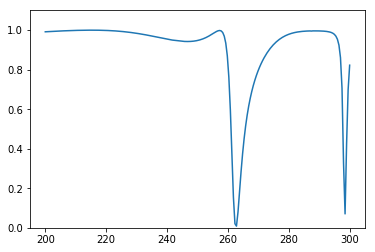

Predicted spectrum: 


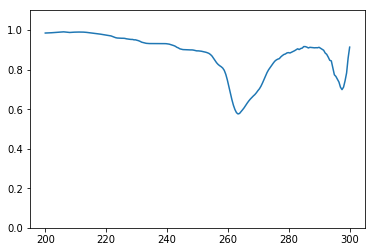

Test 187
True spectrum: 


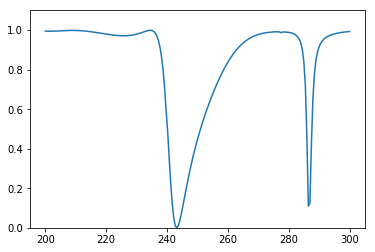

Predicted spectrum: 


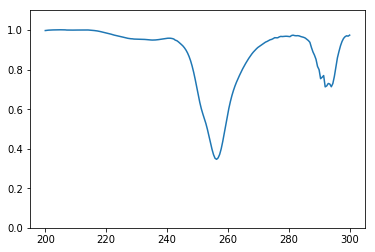

Test 188
True spectrum: 


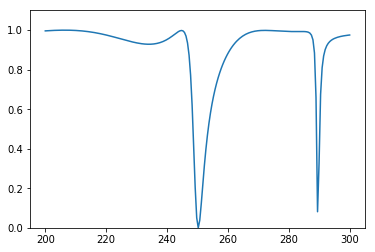

Predicted spectrum: 


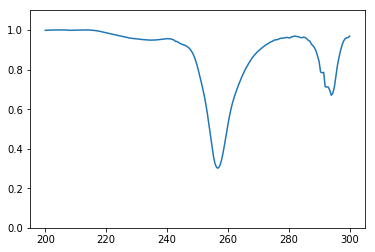

Test 189
True spectrum: 


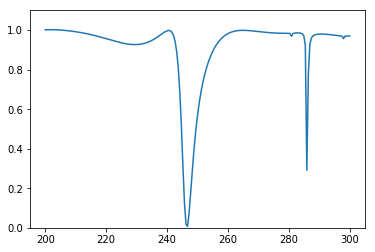

Predicted spectrum: 


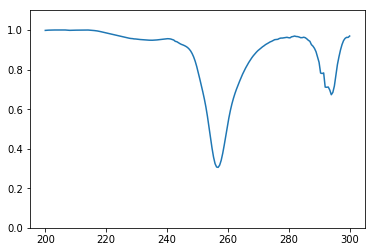

Test 190
True spectrum: 


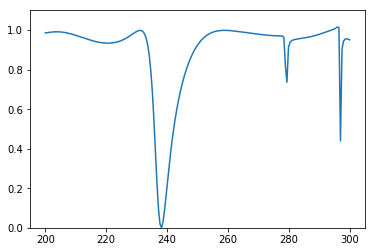

Predicted spectrum: 


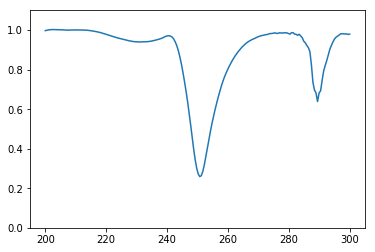

Test 191
True spectrum: 


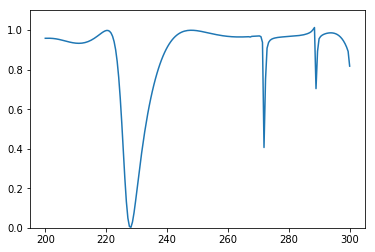

Predicted spectrum: 


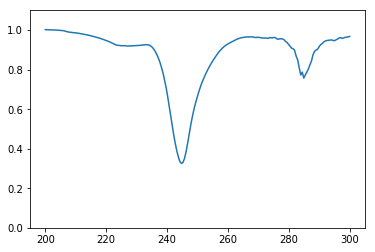

Test 192
True spectrum: 


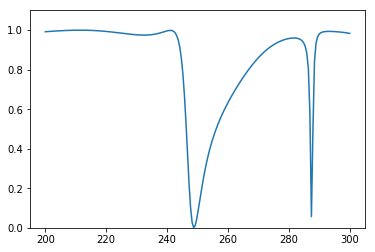

Predicted spectrum: 


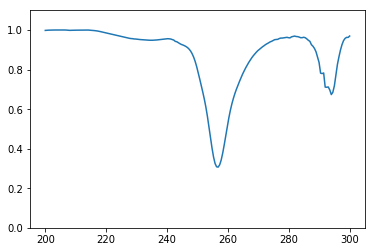

Test 193
True spectrum: 


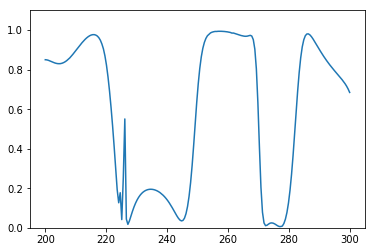

Predicted spectrum: 


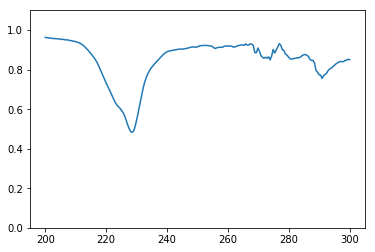

Test 194
True spectrum: 


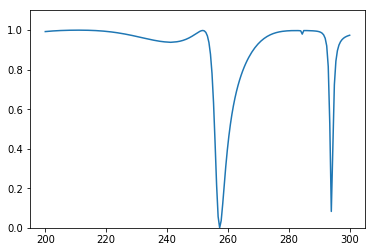

Predicted spectrum: 


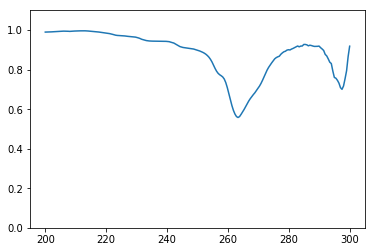

Test 195
True spectrum: 


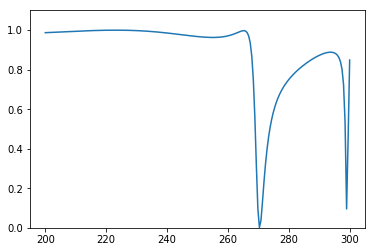

Predicted spectrum: 


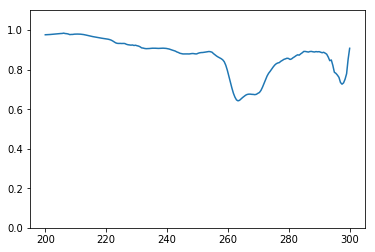

Test 196
True spectrum: 


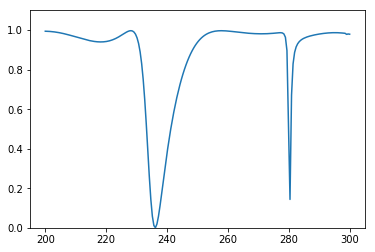

Predicted spectrum: 


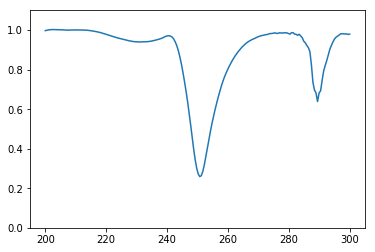

Test 197
True spectrum: 


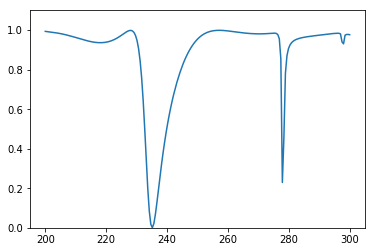

Predicted spectrum: 


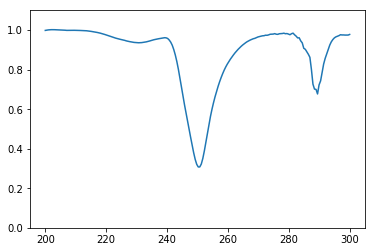

Test 198
True spectrum: 


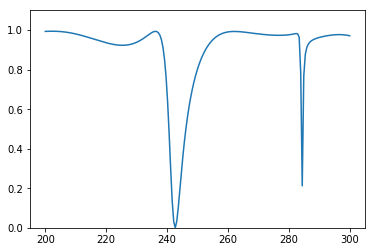

Predicted spectrum: 


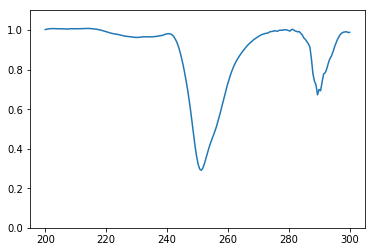

Test 199
True spectrum: 


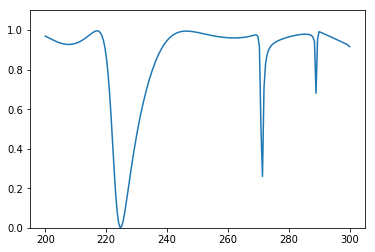

Predicted spectrum: 


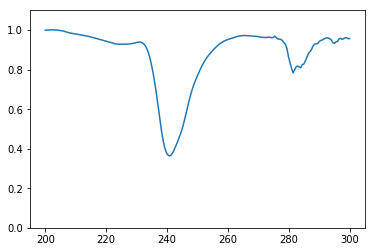

Test 200
True spectrum: 


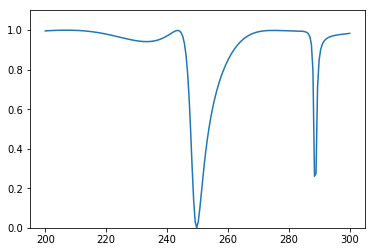

Predicted spectrum: 


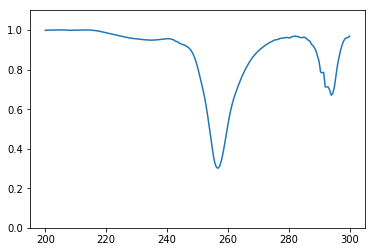

Test 201
True spectrum: 


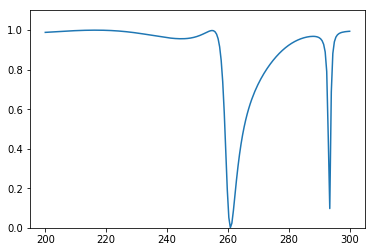

Predicted spectrum: 


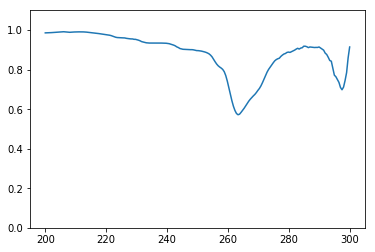

Test 202
True spectrum: 


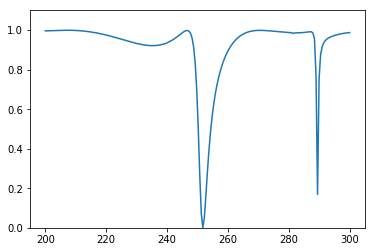

Predicted spectrum: 


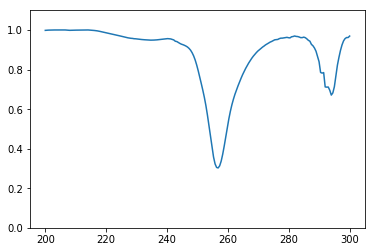

Test 203
True spectrum: 


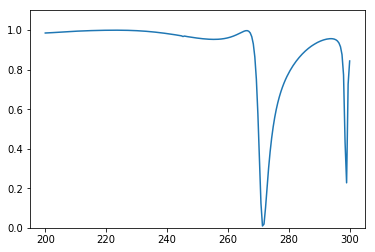

Predicted spectrum: 


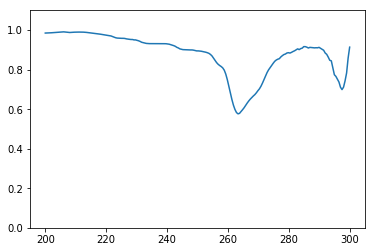

Test 204
True spectrum: 


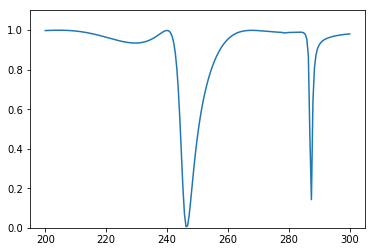

Predicted spectrum: 


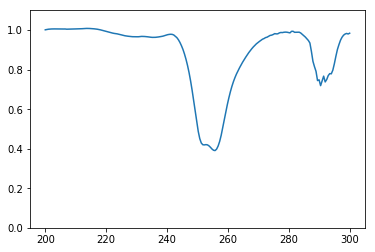

Test 205
True spectrum: 


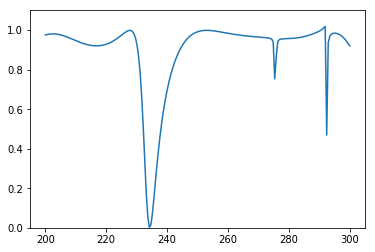

Predicted spectrum: 


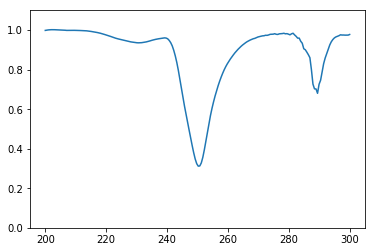

Test 206
True spectrum: 


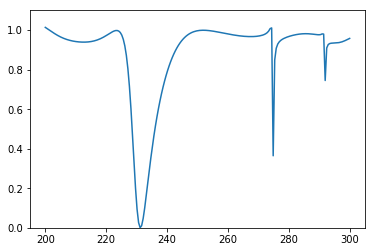

Predicted spectrum: 


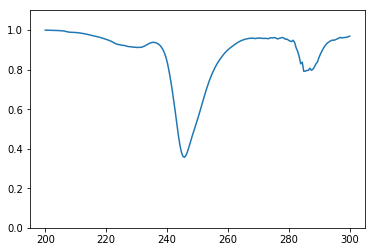

Test 207
True spectrum: 


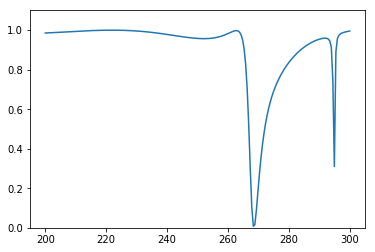

Predicted spectrum: 


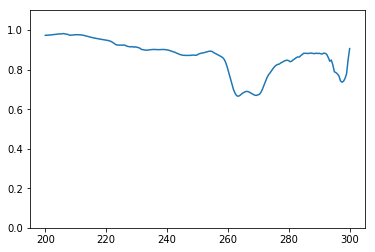

Test 208
True spectrum: 


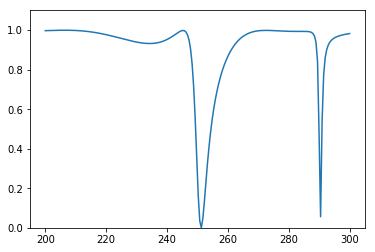

Predicted spectrum: 


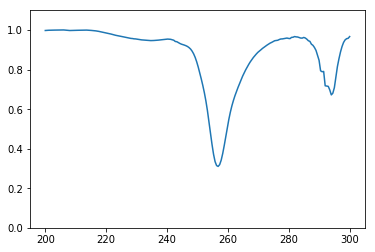

Test 209
True spectrum: 


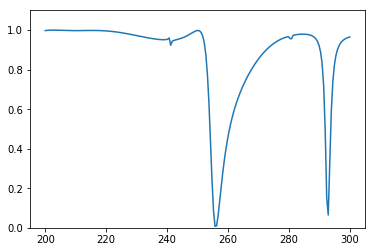

Predicted spectrum: 


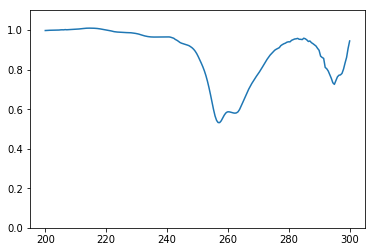

Test 210
True spectrum: 


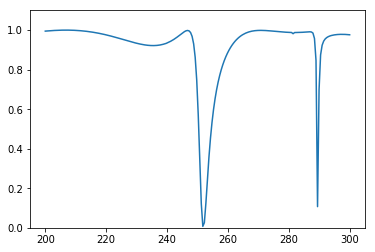

Predicted spectrum: 


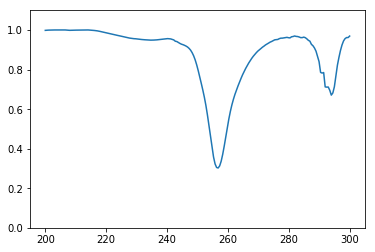

Test 211
True spectrum: 


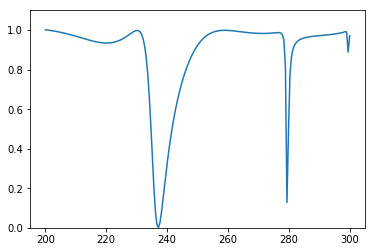

Predicted spectrum: 


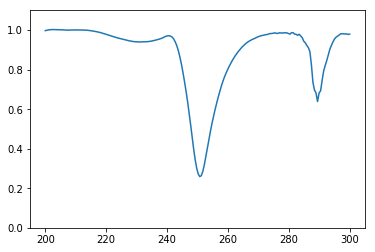

Test 212
True spectrum: 


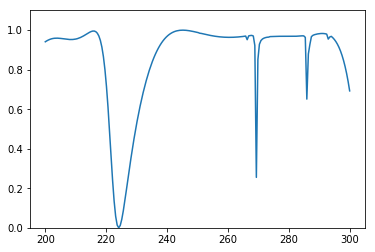

Predicted spectrum: 


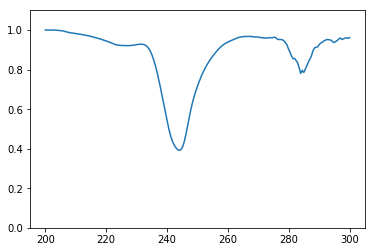

Test 213
True spectrum: 


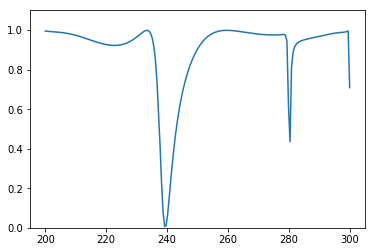

Predicted spectrum: 


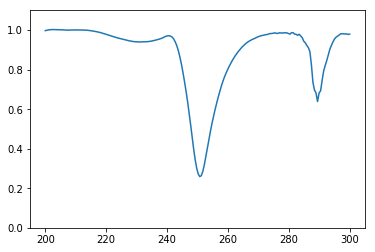

Test 214
True spectrum: 


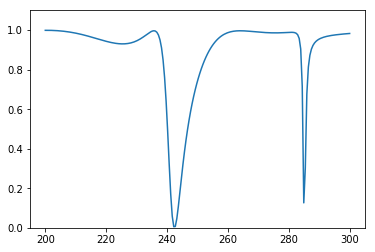

Predicted spectrum: 


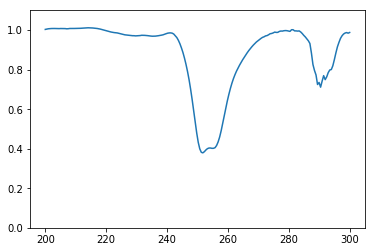

Test 215
True spectrum: 


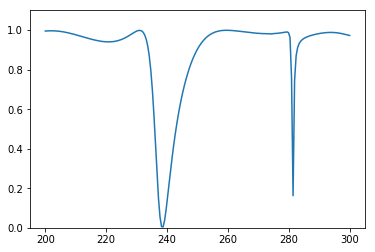

Predicted spectrum: 


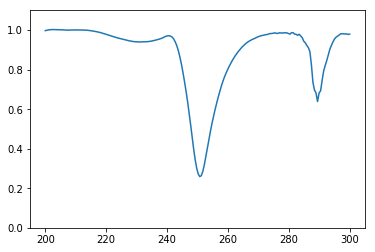

Test 216
True spectrum: 


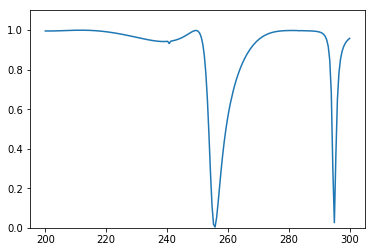

Predicted spectrum: 


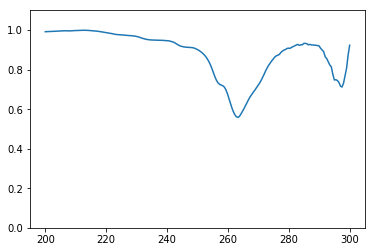

Test 217
True spectrum: 


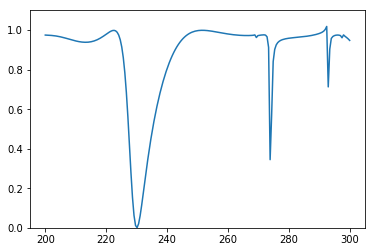

Predicted spectrum: 


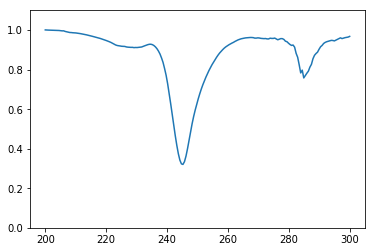

Test 218
True spectrum: 


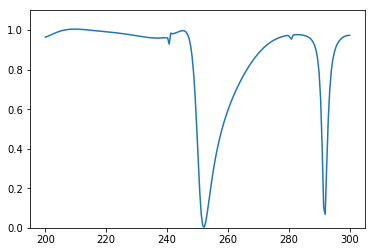

Predicted spectrum: 


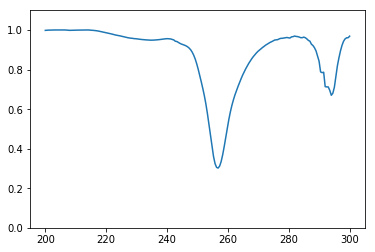

Test 219
True spectrum: 


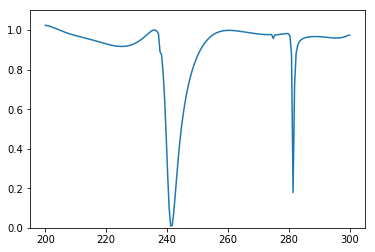

Predicted spectrum: 


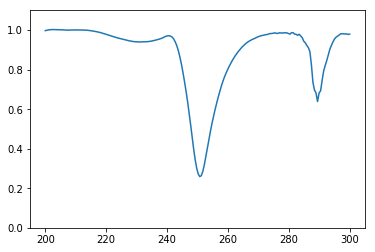

Test 220
True spectrum: 


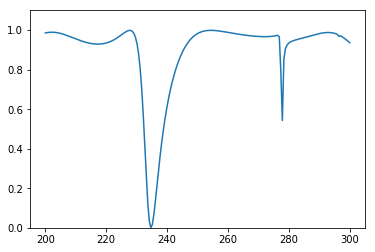

Predicted spectrum: 


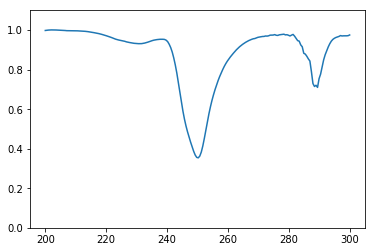

Test 221
True spectrum: 


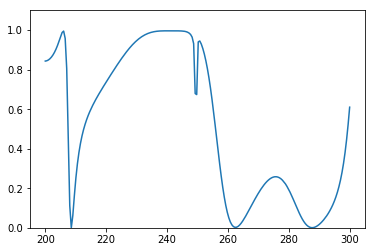

Predicted spectrum: 


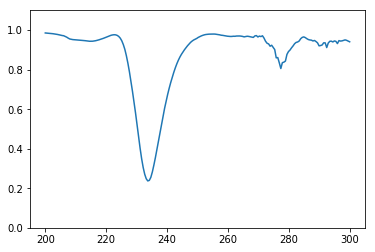

Test 222
True spectrum: 


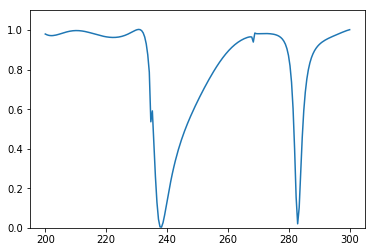

Predicted spectrum: 


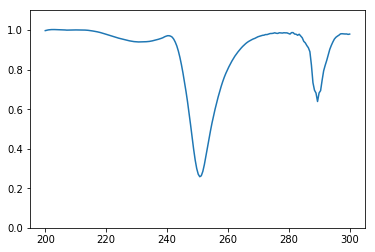

Test 223
True spectrum: 


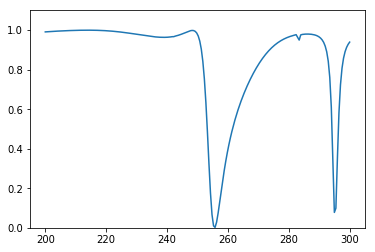

Predicted spectrum: 


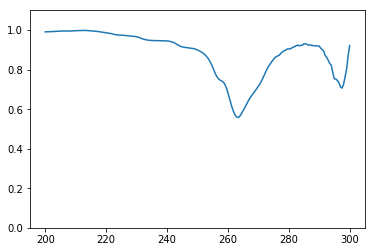

Test 224
True spectrum: 


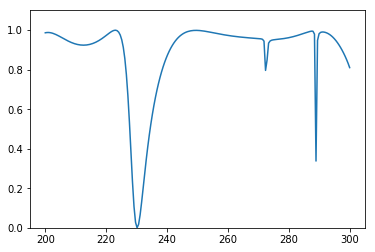

Predicted spectrum: 


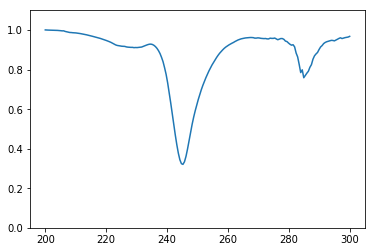

Test 225
True spectrum: 


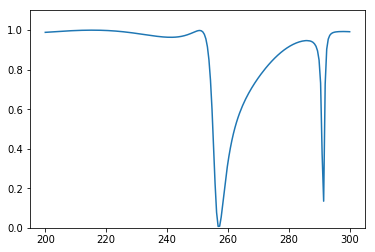

Predicted spectrum: 


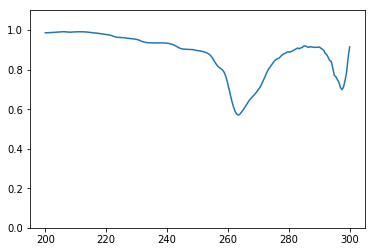

Test 226
True spectrum: 


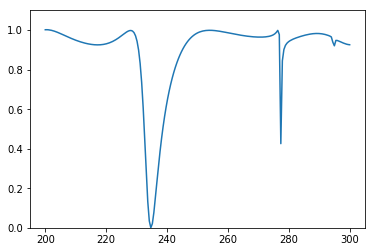

Predicted spectrum: 


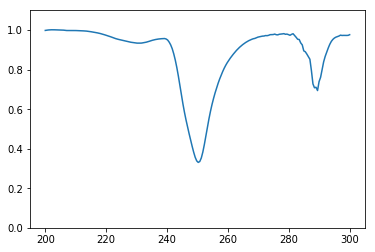

Test 227
True spectrum: 


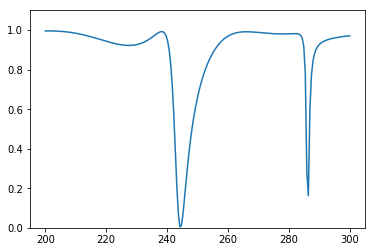

Predicted spectrum: 


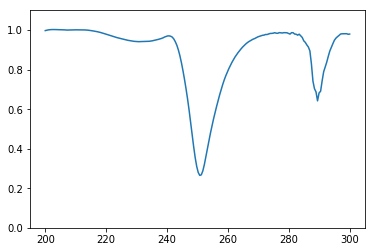

Test 228
True spectrum: 


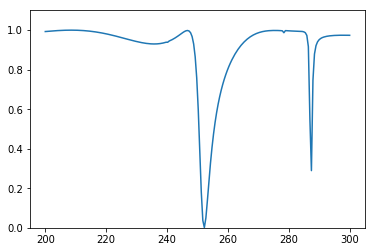

Predicted spectrum: 


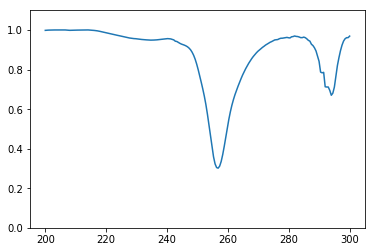

Test 229
True spectrum: 


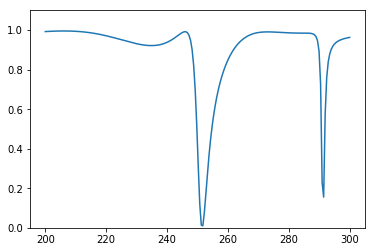

Predicted spectrum: 


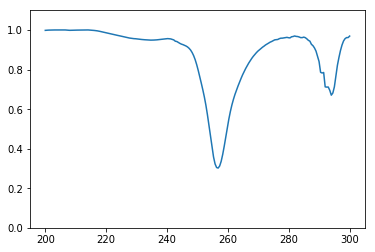

Test 230
True spectrum: 


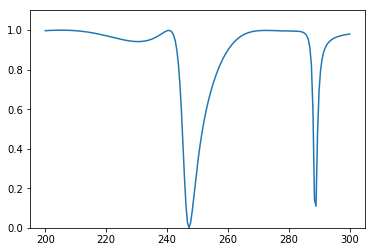

Predicted spectrum: 


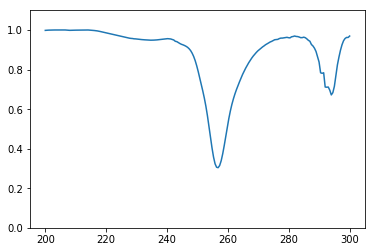

Test 231
True spectrum: 


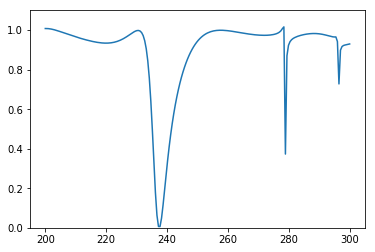

Predicted spectrum: 


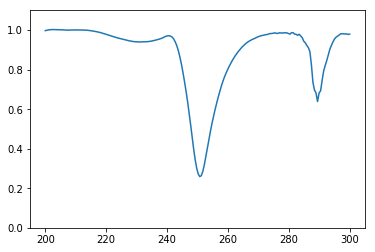

Test 232
True spectrum: 


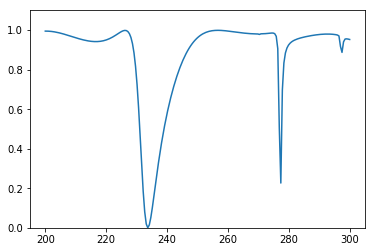

Predicted spectrum: 


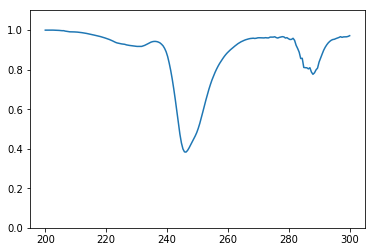

Test 233
True spectrum: 


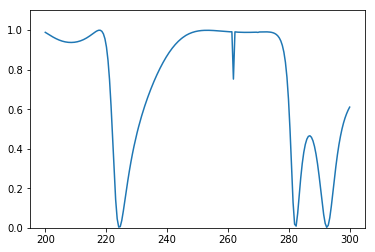

Predicted spectrum: 


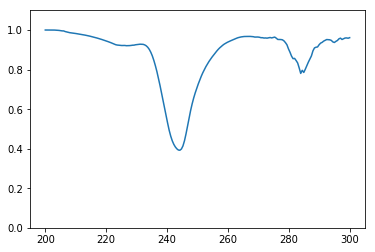

Test 234
True spectrum: 


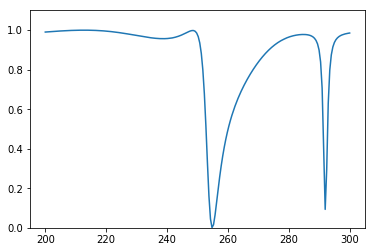

Predicted spectrum: 


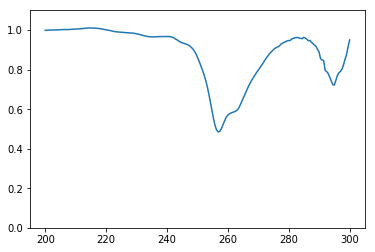

Test 235
True spectrum: 


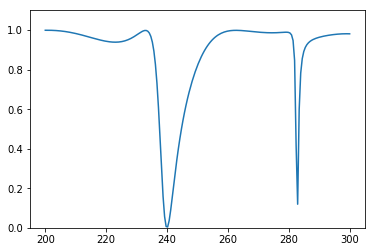

Predicted spectrum: 


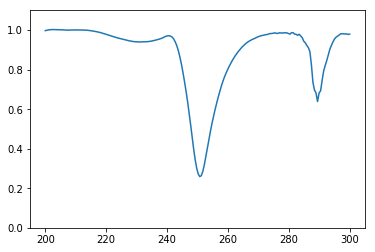

Test 236
True spectrum: 


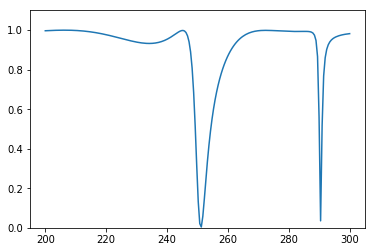

Predicted spectrum: 


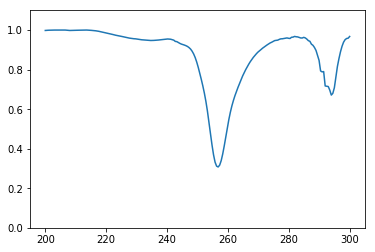

Test 237
True spectrum: 


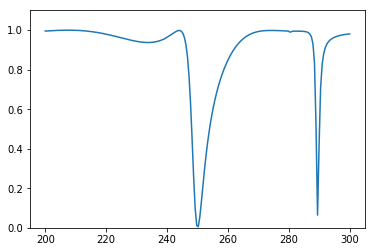

Predicted spectrum: 


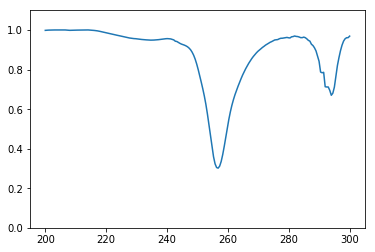

Test 238
True spectrum: 


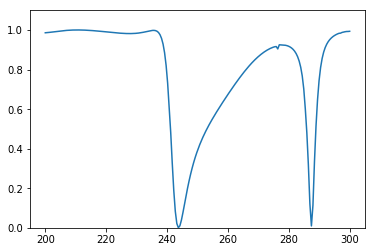

Predicted spectrum: 


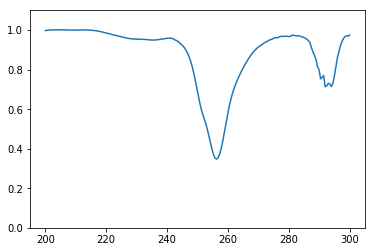

Test 239
True spectrum: 


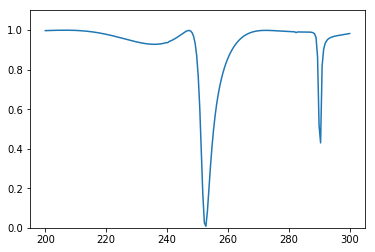

Predicted spectrum: 


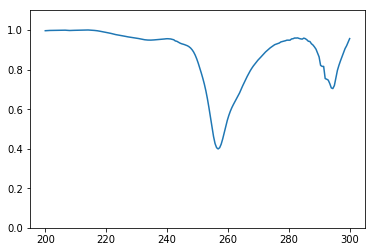

Test 240
True spectrum: 


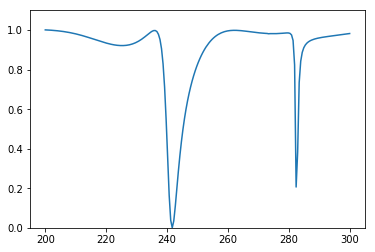

Predicted spectrum: 


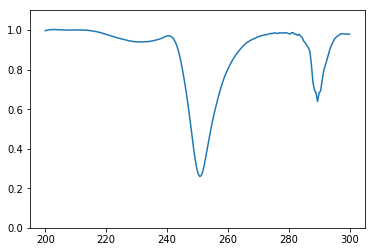

Test 241
True spectrum: 


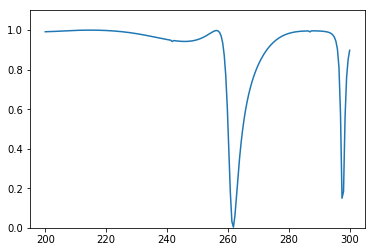

Predicted spectrum: 


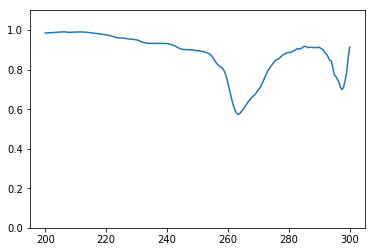

Test 242
True spectrum: 


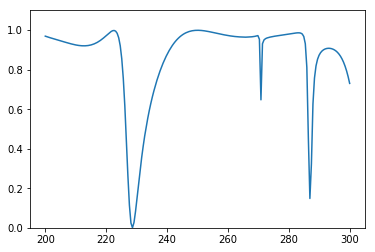

Predicted spectrum: 


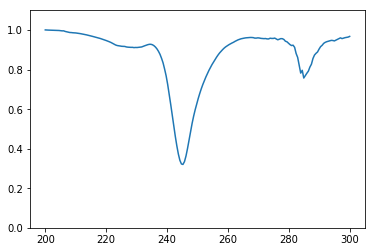

Test 243
True spectrum: 


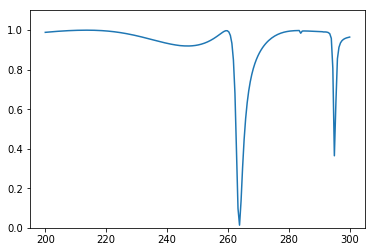

Predicted spectrum: 


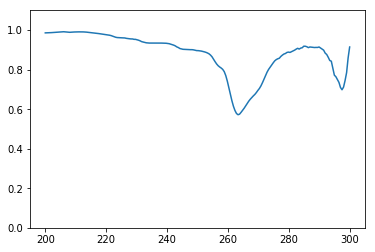

Test 244
True spectrum: 


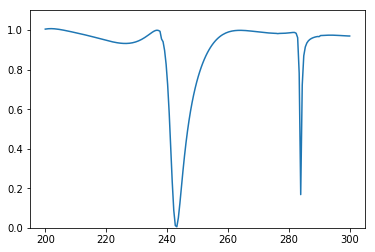

Predicted spectrum: 


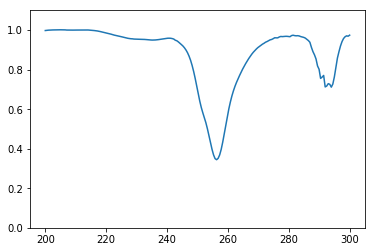

Test 245
True spectrum: 


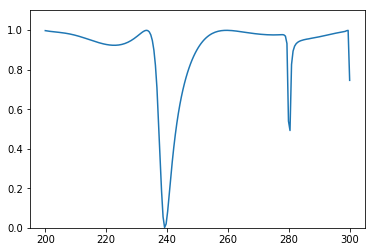

Predicted spectrum: 


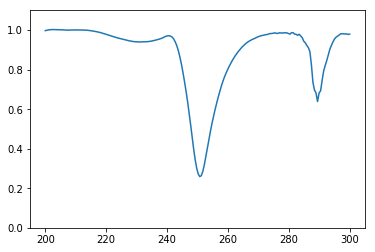

Test 246
True spectrum: 


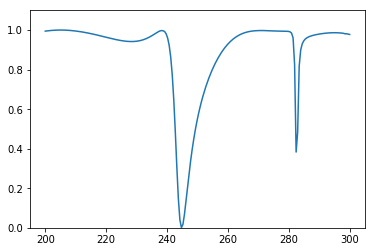

Predicted spectrum: 


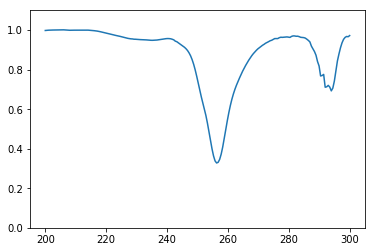

Test 247
True spectrum: 


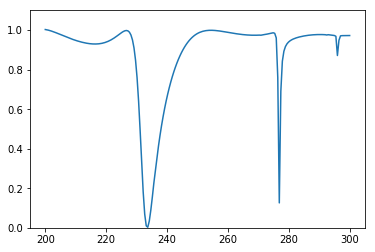

Predicted spectrum: 


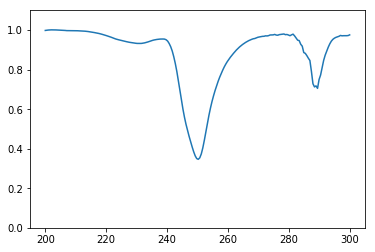

Test 248
True spectrum: 


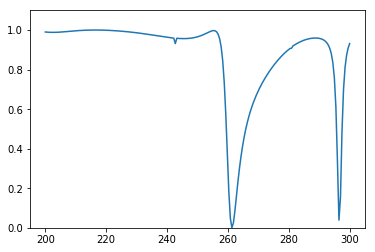

Predicted spectrum: 


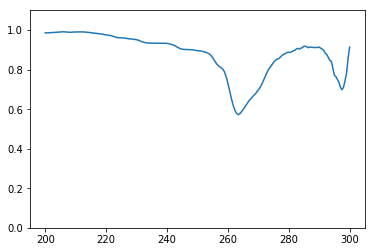

Test 249
True spectrum: 


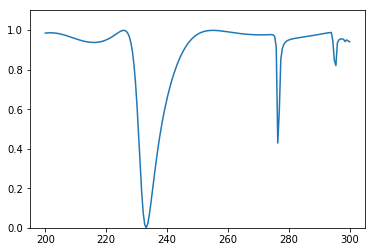

Predicted spectrum: 


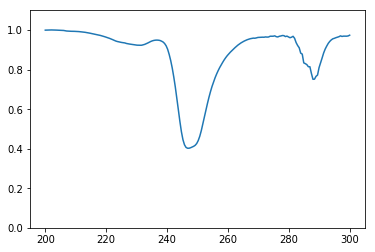

Test 250
True spectrum: 


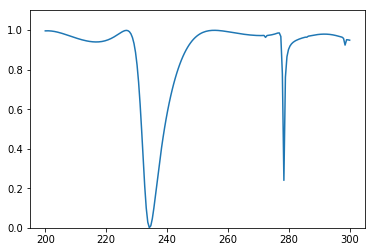

Predicted spectrum: 


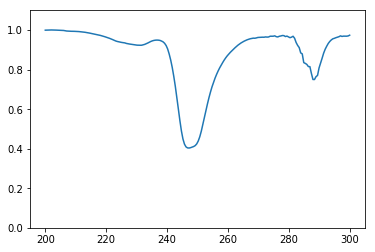

Test 251
True spectrum: 


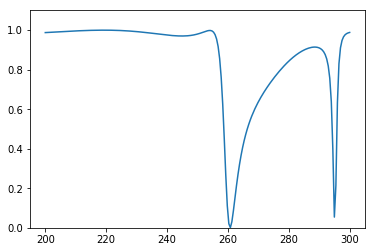

Predicted spectrum: 


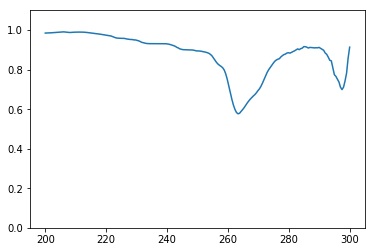

Test 252
True spectrum: 


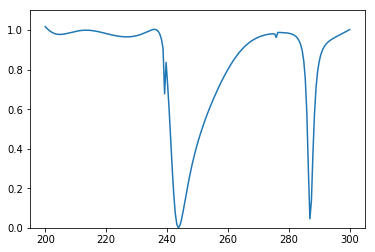

Predicted spectrum: 


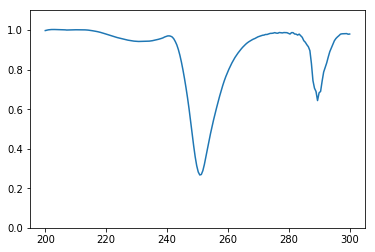

Test 253
True spectrum: 


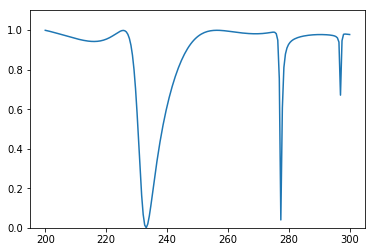

Predicted spectrum: 


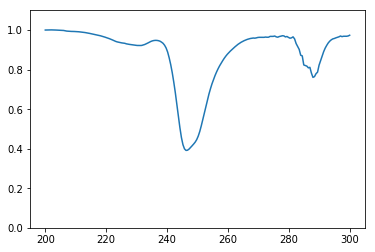

Test 254
True spectrum: 


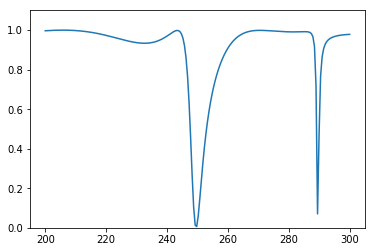

Predicted spectrum: 


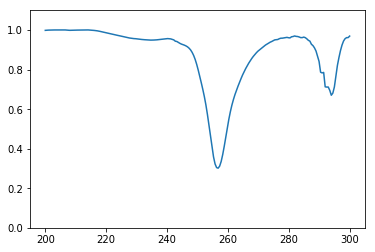

Test 255
True spectrum: 


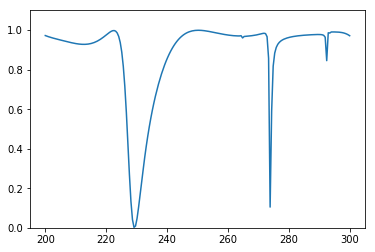

Predicted spectrum: 


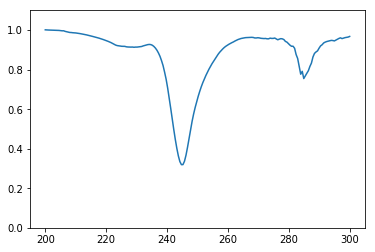

Test 256
True spectrum: 


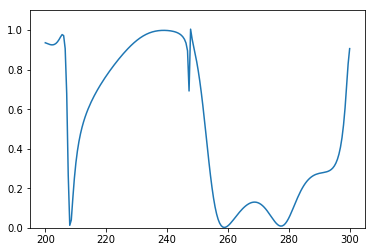

Predicted spectrum: 


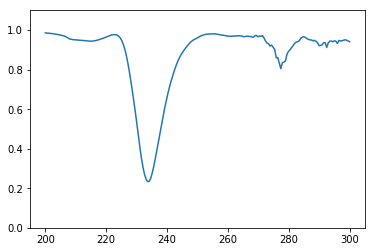

Test 257
True spectrum: 


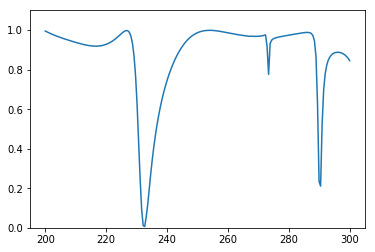

Predicted spectrum: 


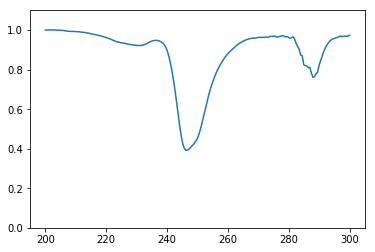

Test 258
True spectrum: 


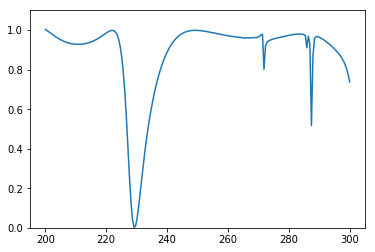

Predicted spectrum: 


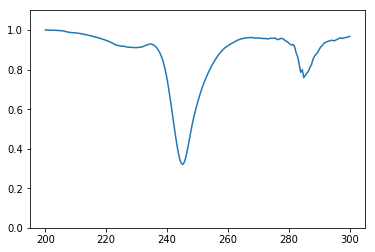

Test 259
True spectrum: 


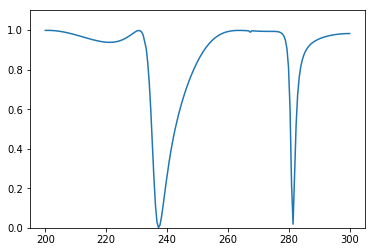

Predicted spectrum: 


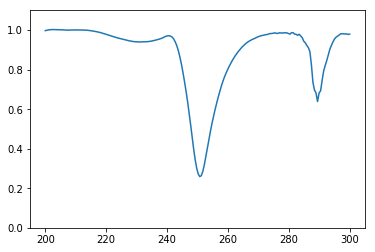

Test 260
True spectrum: 


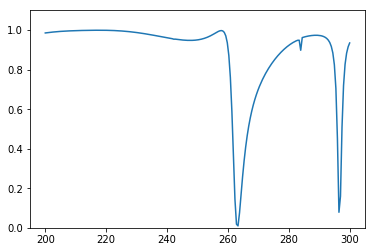

Predicted spectrum: 


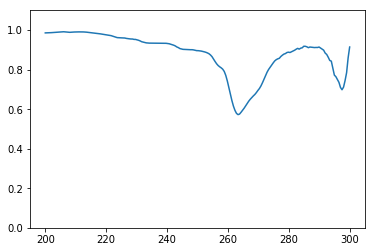

Test 261
True spectrum: 


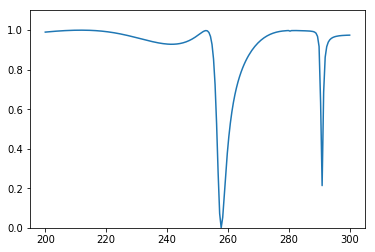

Predicted spectrum: 


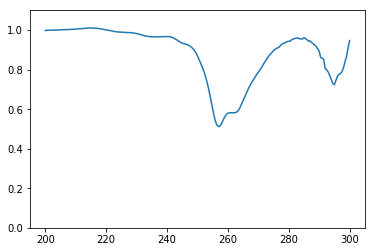

Test 262
True spectrum: 


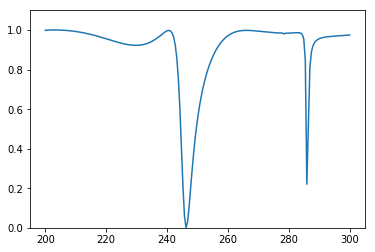

Predicted spectrum: 


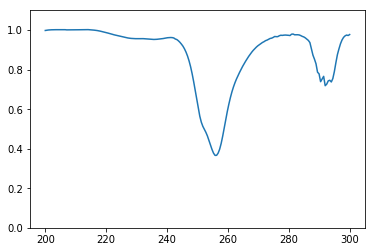

Test 263
True spectrum: 


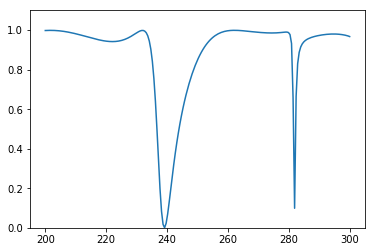

Predicted spectrum: 


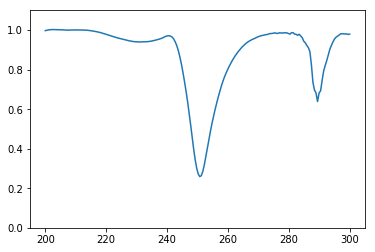

Test 264
True spectrum: 


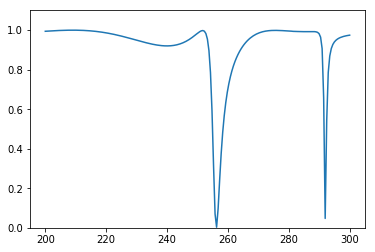

Predicted spectrum: 


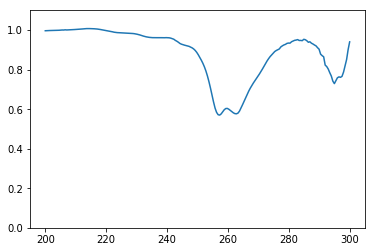

Test 265
True spectrum: 


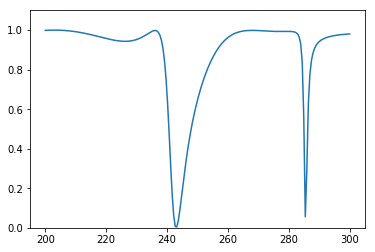

Predicted spectrum: 


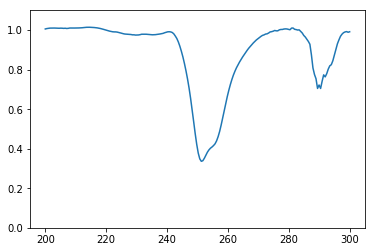

Test 266
True spectrum: 


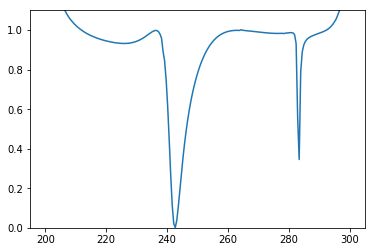

Predicted spectrum: 


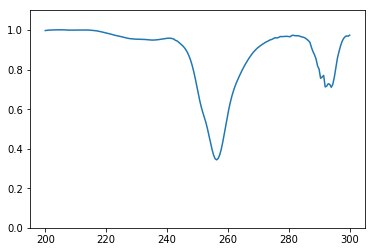

Test 267
True spectrum: 


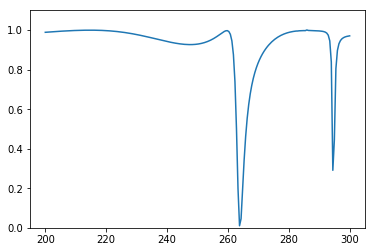

Predicted spectrum: 


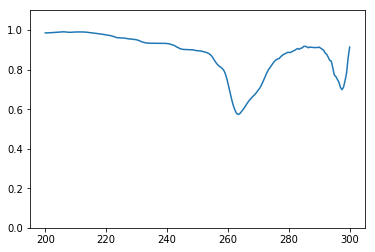

Test 268
True spectrum: 


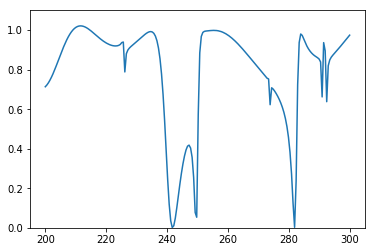

Predicted spectrum: 


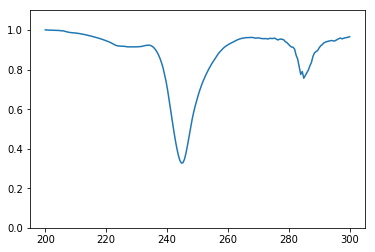

Test 269
True spectrum: 


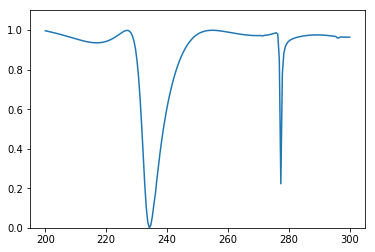

Predicted spectrum: 


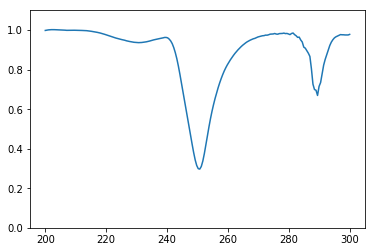

Test 270
True spectrum: 


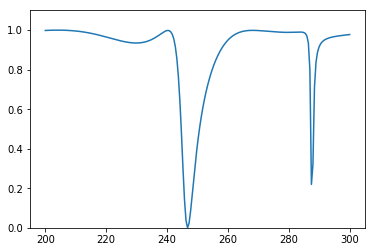

Predicted spectrum: 


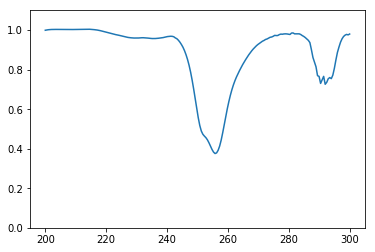

Test 271
True spectrum: 


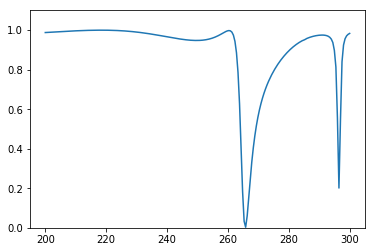

Predicted spectrum: 


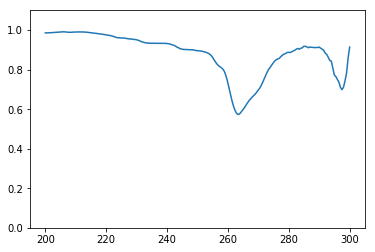

Test 272
True spectrum: 


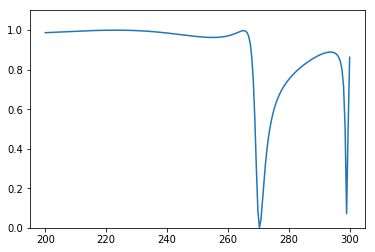

Predicted spectrum: 


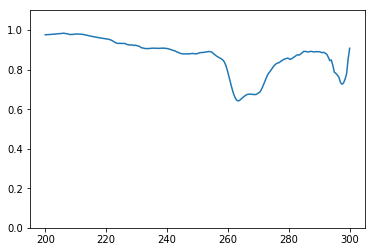

Test 273
True spectrum: 


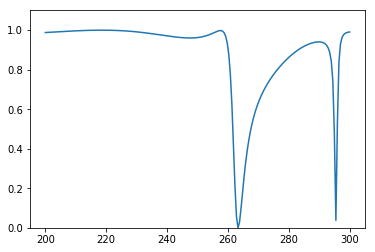

Predicted spectrum: 


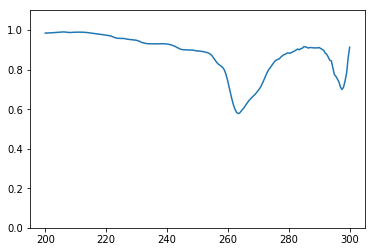

Test 274
True spectrum: 


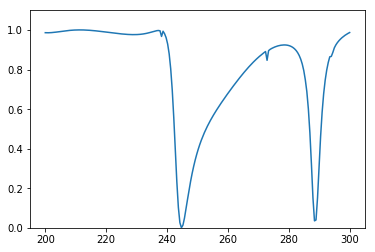

Predicted spectrum: 


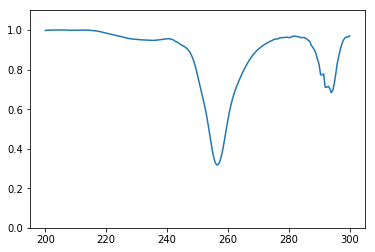

Test 275
True spectrum: 


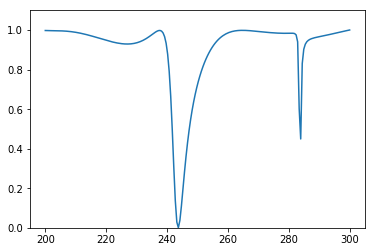

Predicted spectrum: 


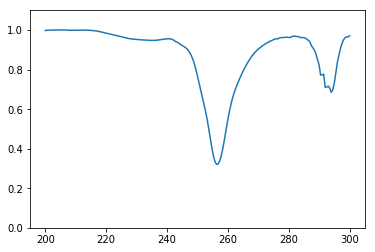

Test 276
True spectrum: 


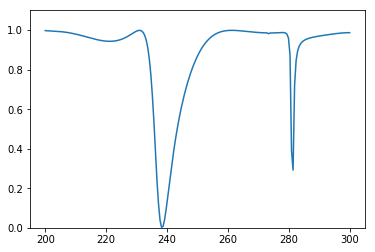

Predicted spectrum: 


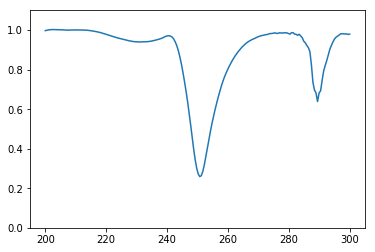

Test 277
True spectrum: 


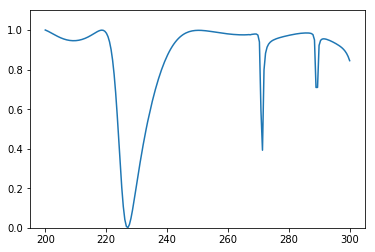

Predicted spectrum: 


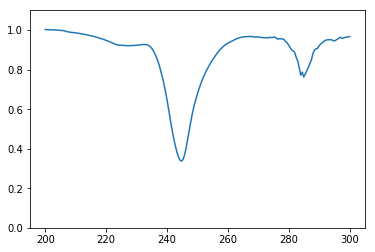

Test 278
True spectrum: 


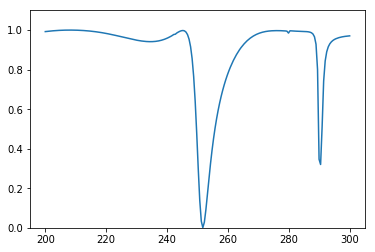

Predicted spectrum: 


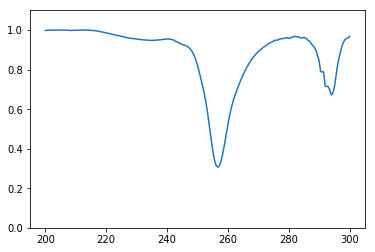

Test 279
True spectrum: 


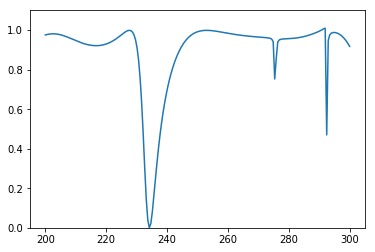

Predicted spectrum: 


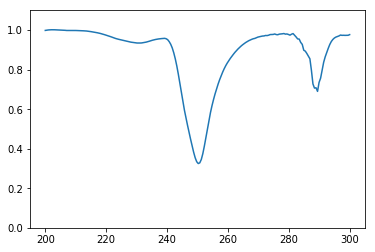

Test 280
True spectrum: 


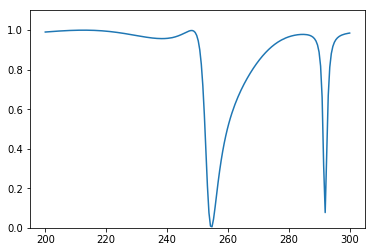

Predicted spectrum: 


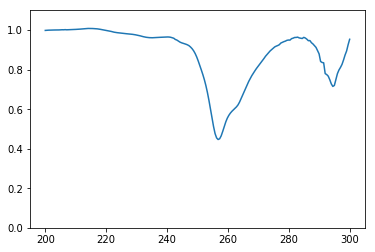

Test 281
True spectrum: 


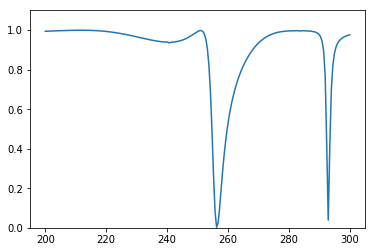

Predicted spectrum: 


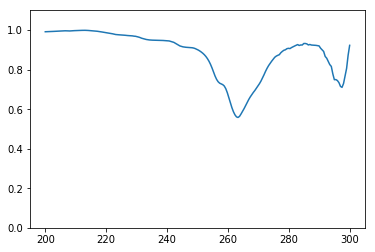

Test 282
True spectrum: 


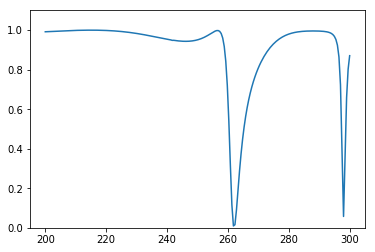

Predicted spectrum: 


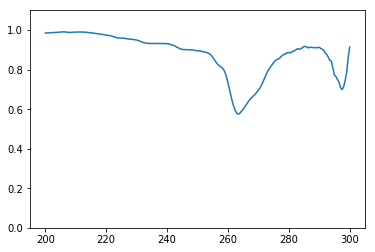

Test 283
True spectrum: 


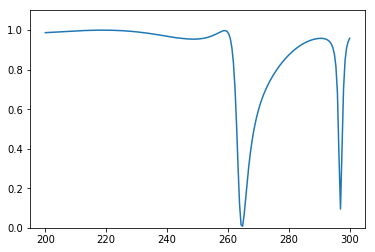

Predicted spectrum: 


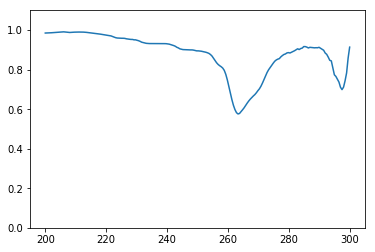

Test 284
True spectrum: 


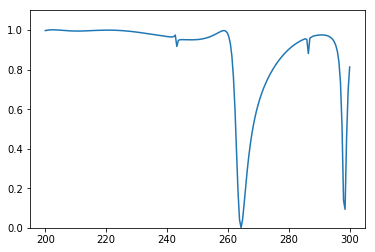

Predicted spectrum: 


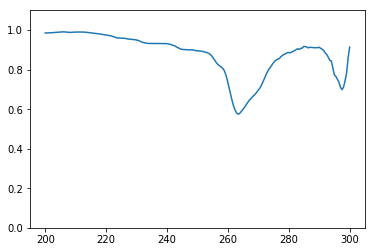

Test 285
True spectrum: 


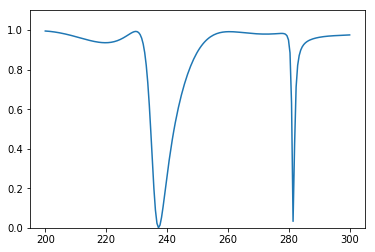

Predicted spectrum: 


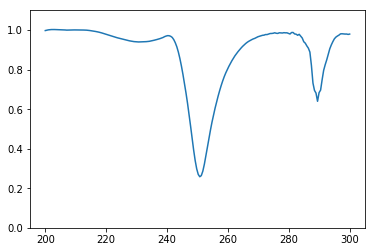

Test 286
True spectrum: 


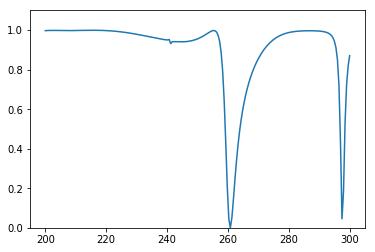

Predicted spectrum: 


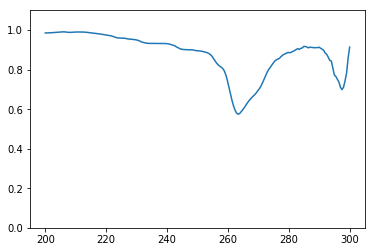

Test 287
True spectrum: 


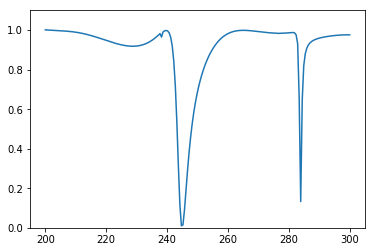

Predicted spectrum: 


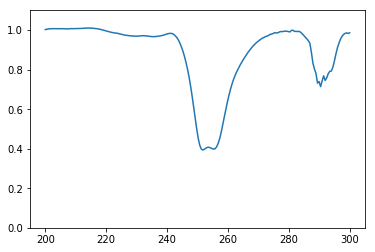

Test 288
True spectrum: 


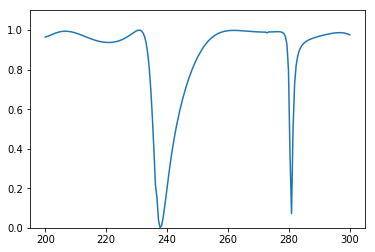

Predicted spectrum: 


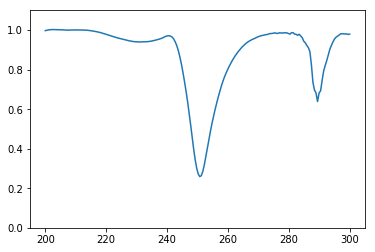

Test 289
True spectrum: 


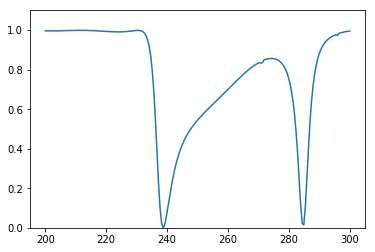

Predicted spectrum: 


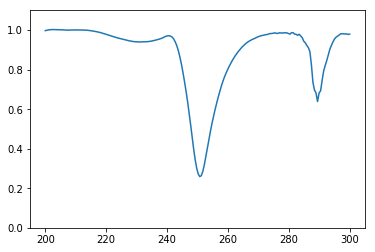

Test 290
True spectrum: 


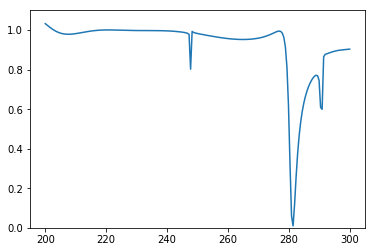

Predicted spectrum: 


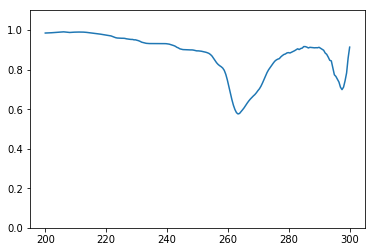

Test 291
True spectrum: 


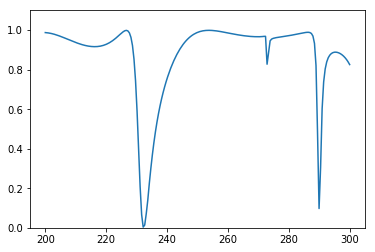

Predicted spectrum: 


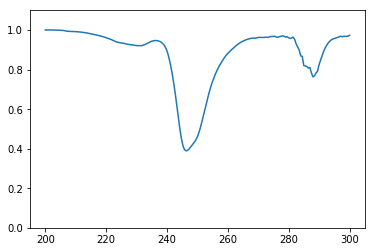

Test 292
True spectrum: 


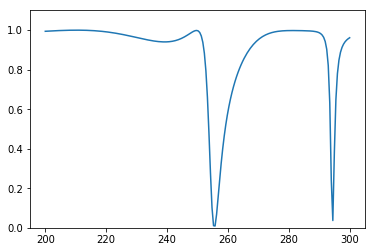

Predicted spectrum: 


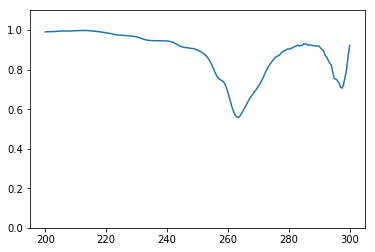

Test 293
True spectrum: 


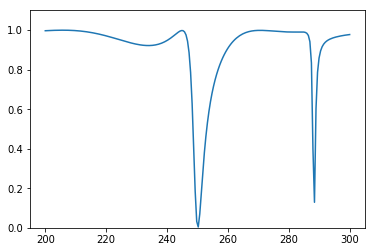

Predicted spectrum: 


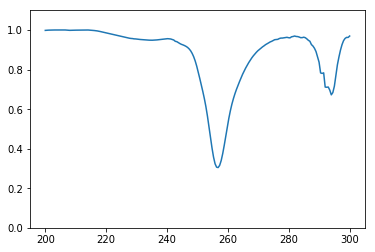

Test 294
True spectrum: 


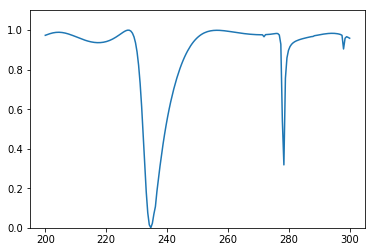

Predicted spectrum: 


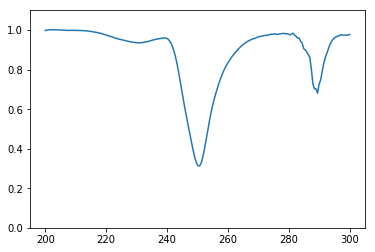

Test 295
True spectrum: 


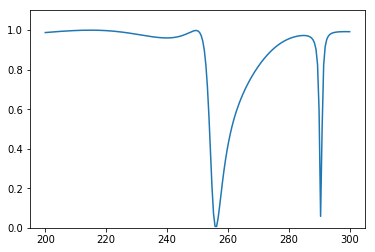

Predicted spectrum: 


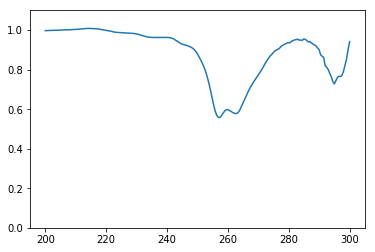

Test 296
True spectrum: 


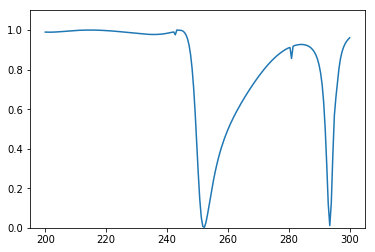

Predicted spectrum: 


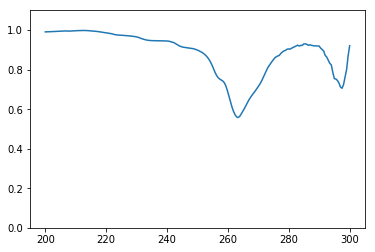

Test 297
True spectrum: 


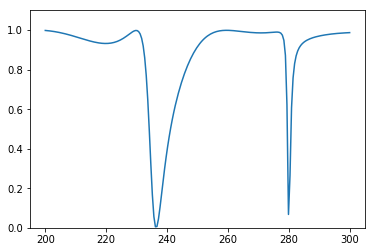

Predicted spectrum: 


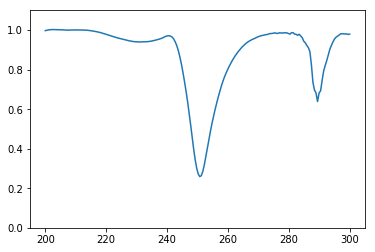

Test 298
True spectrum: 


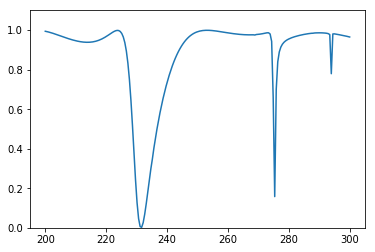

Predicted spectrum: 


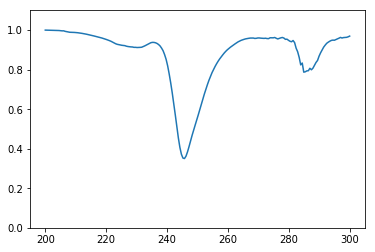

Test 299
True spectrum: 


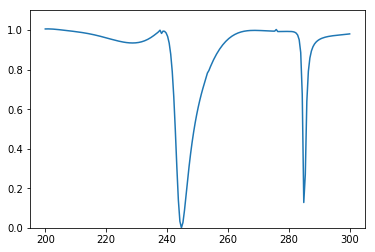

Predicted spectrum: 


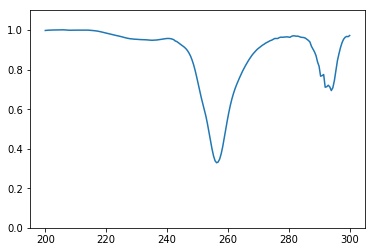

Test 300
True spectrum: 


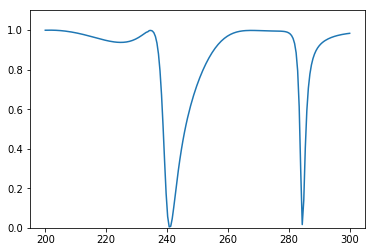

Predicted spectrum: 


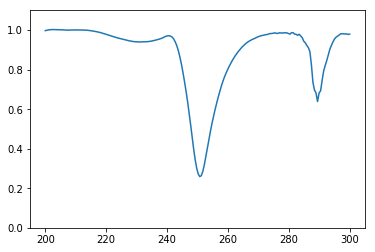

Test 301
True spectrum: 


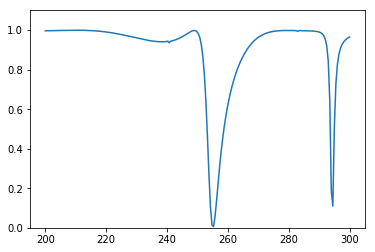

Predicted spectrum: 


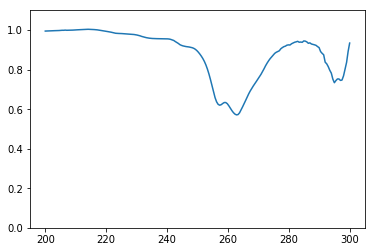

Test 302
True spectrum: 


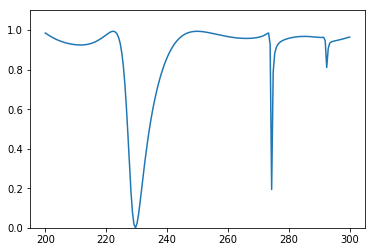

Predicted spectrum: 


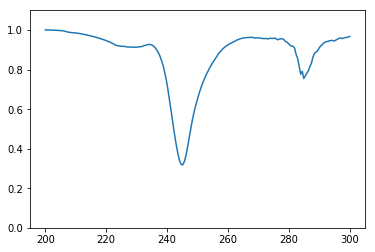

Test 303
True spectrum: 


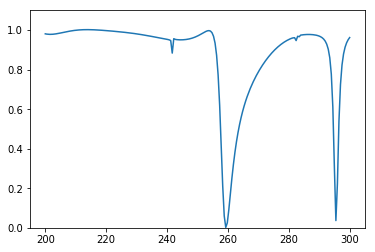

Predicted spectrum: 


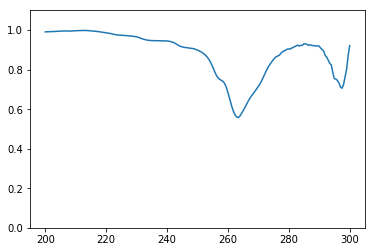

Test 304
True spectrum: 


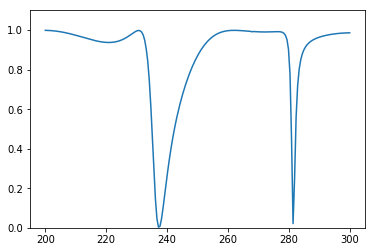

Predicted spectrum: 


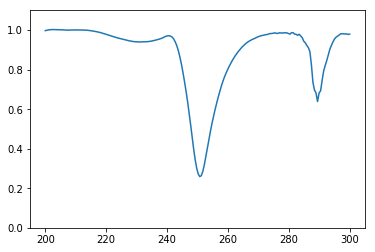

Test 305
True spectrum: 


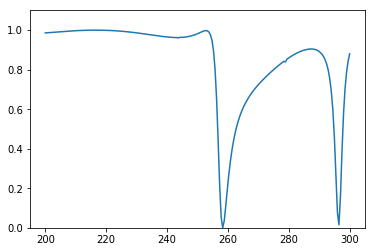

Predicted spectrum: 


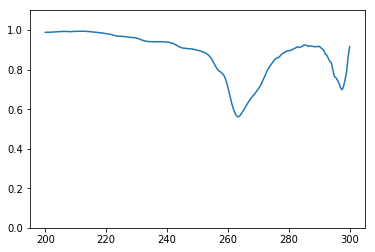

Test 306
True spectrum: 


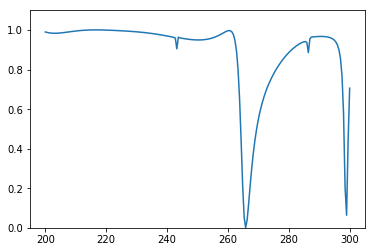

Predicted spectrum: 


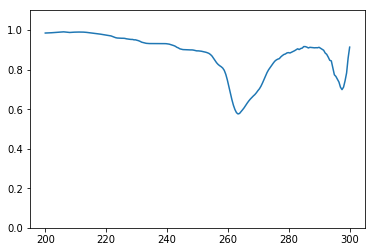

Test 307
True spectrum: 


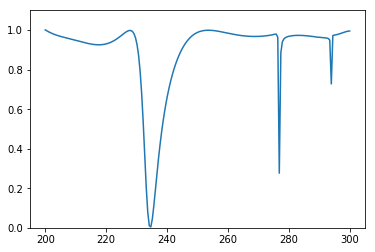

Predicted spectrum: 


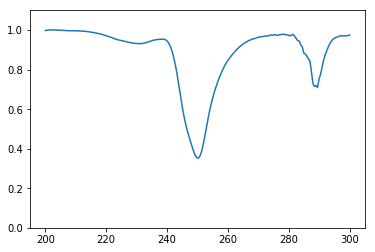

Test 308
True spectrum: 


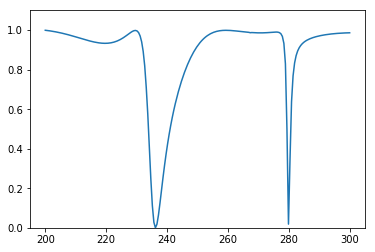

Predicted spectrum: 


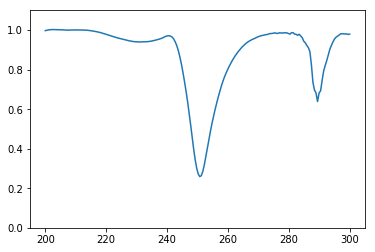

Test 309
True spectrum: 


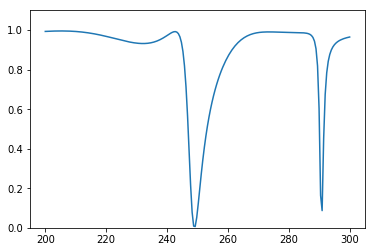

Predicted spectrum: 


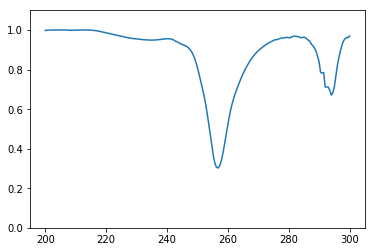

Test 310
True spectrum: 


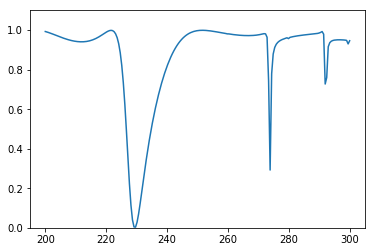

Predicted spectrum: 


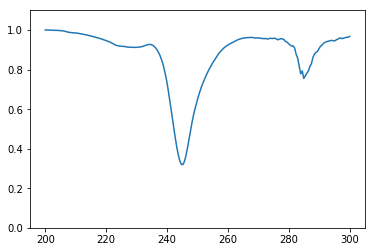

Test 311
True spectrum: 


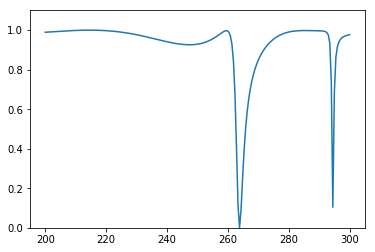

Predicted spectrum: 


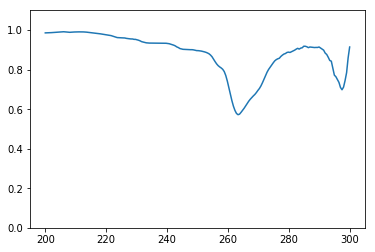

Test 312
True spectrum: 


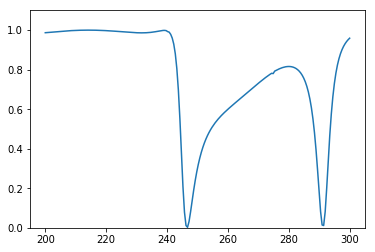

Predicted spectrum: 


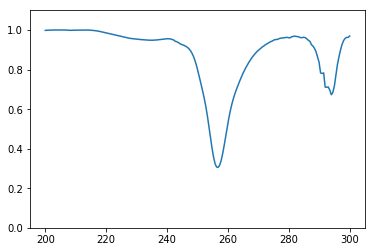

Test 313
True spectrum: 


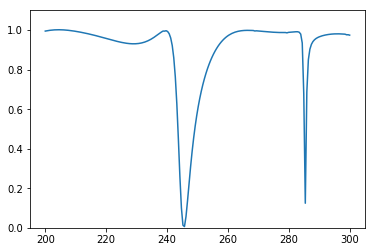

Predicted spectrum: 


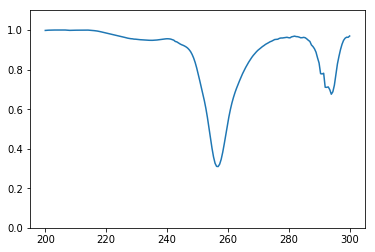

Test 314
True spectrum: 


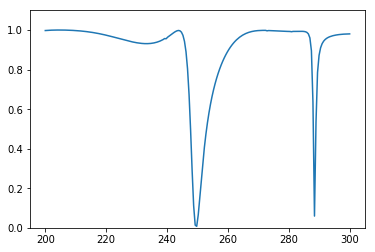

Predicted spectrum: 


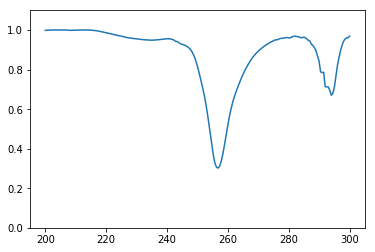

Test 315
True spectrum: 


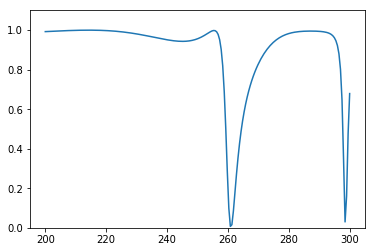

Predicted spectrum: 


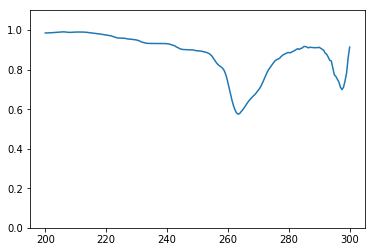

Test 316
True spectrum: 


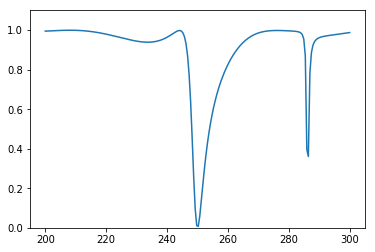

Predicted spectrum: 


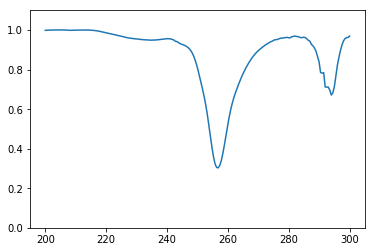

Test 317
True spectrum: 


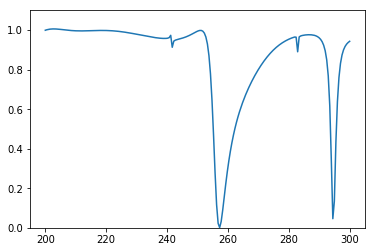

Predicted spectrum: 


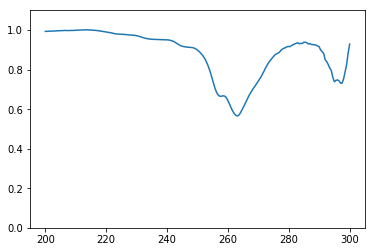

Test 318
True spectrum: 


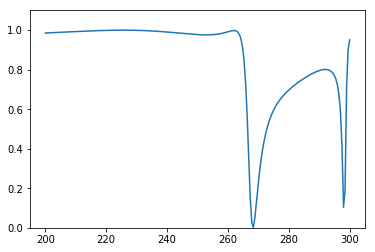

Predicted spectrum: 


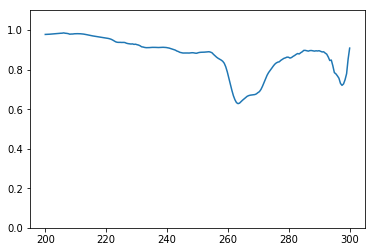

Test 319
True spectrum: 


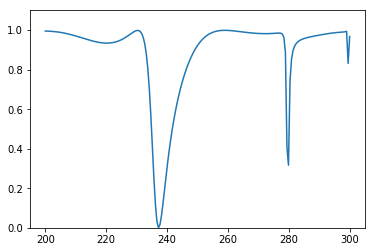

Predicted spectrum: 


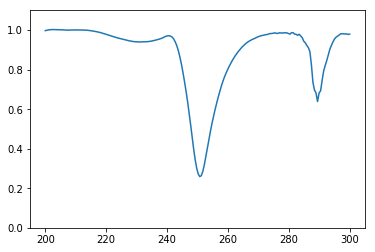

Test 320
True spectrum: 


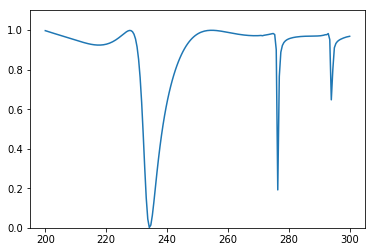

Predicted spectrum: 


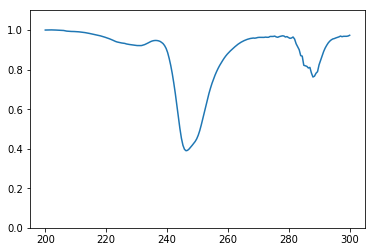

Test 321
True spectrum: 


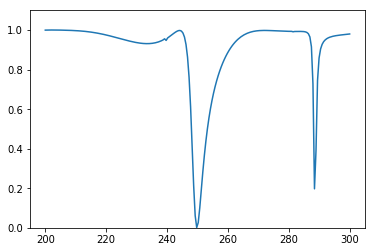

Predicted spectrum: 


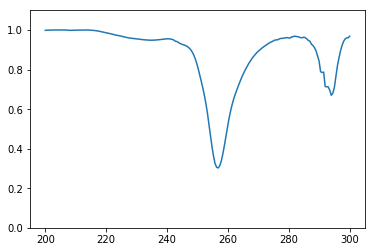

Test 322
True spectrum: 


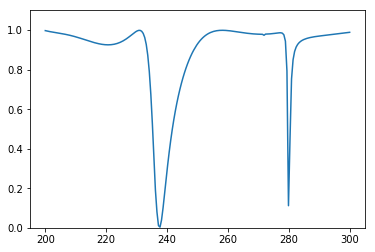

Predicted spectrum: 


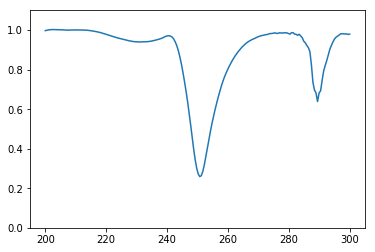

Test 323
True spectrum: 


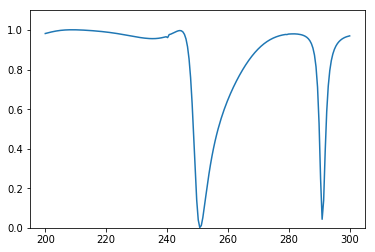

Predicted spectrum: 


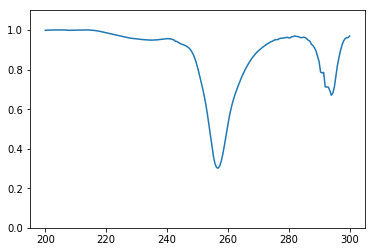

Test 324
True spectrum: 


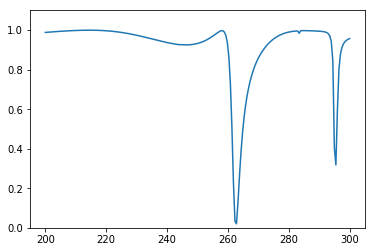

Predicted spectrum: 


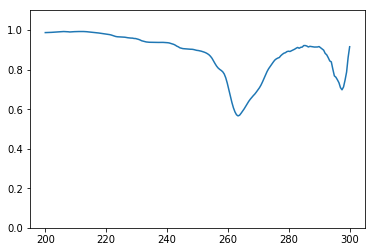

Test 325
True spectrum: 


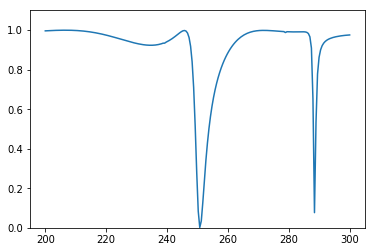

Predicted spectrum: 


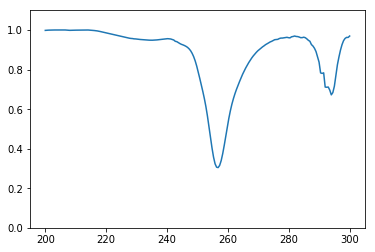

Test 326
True spectrum: 


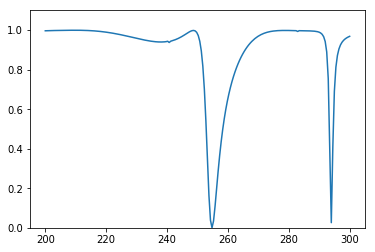

Predicted spectrum: 


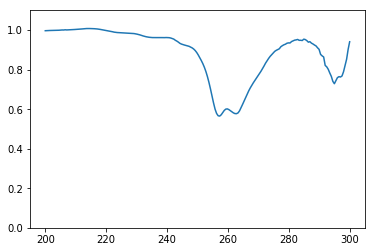

Test 327
True spectrum: 


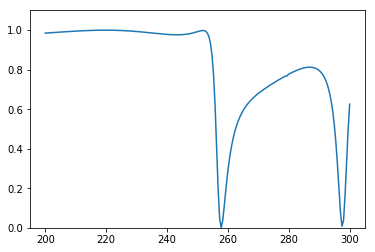

Predicted spectrum: 


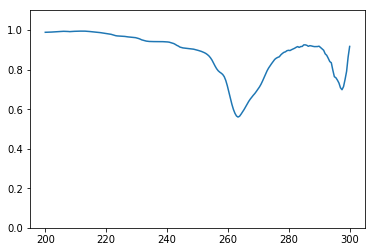

Test 328
True spectrum: 


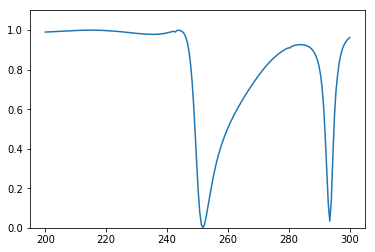

Predicted spectrum: 


KeyboardInterrupt: 

In [21]:
x = np.genfromtxt('meep_code/data/SP_xaxis.txt')
for i in range(len(train_X)):
    print('Test '+str(i))
    print('True spectrum: ')
    plt.ylim(0, 1.1)
    plt.plot(x, np.add(train_Y[i], 0.5))
    plt.show()
    print('Predicted spectrum: ')
    plt.ylim(0, 1.1)
    plt.plot(x, np.reshape(np.add(simulator.predict(np.reshape(train_X[i], (1, 6))), 0.5), (200,)))
    plt.show()

In [33]:
for i,layer in enumerate(simulator.layers):
    print(i,layer.name)

0 dense_24
1 dropout_20
2 dense_25
3 dropout_21
4 dense_26
5 dropout_22
6 dense_27
7 dropout_23
8 dense_28
9 dropout_24
10 dense_29
11 dropout_25
12 dense_30


In [16]:
for i,layer in enumerate(simulator.layers):
    print(i,layer.name,layer.trainable)

0 dense_10 True
1 dropout_9 True
2 dense_11 True
3 dropout_10 True
4 dense_12 True
5 dropout_11 True
6 dense_13 True
7 dropout_12 True
8 dense_14 True
9 dropout_13 True
10 dense_15 True
11 dropout_14 True
12 dense_16 True
13 dropout_15 True
14 dense_17 True
15 dropout_16 True
16 dense_18 True


In [35]:
for layer in simulator.layers:
    layer.trainable=False

In [41]:
s = load_model('T_S')
for i,layer in enumerate(s.layers):
    print(i,layer.name,layer.trainable)

0 dense_19 False
1 dropout_16 False
2 dense_20 False
3 dropout_17 False
4 dense_21 False
5 dropout_18 False
6 dense_22 False
7 dropout_19 False
8 dense_23 False
9 dropout_20 False
10 dense_24 False


In [60]:
tandem = Sequential()
tandem.add(Dense(200, activation='relu', input_dim=out_dim))
tandem.add(Dropout(0.5))
tandem.add(Dense(512, activation='relu'))
tandem.add(Dropout(0.5))
tandem.add(Dense(256, activation='relu'))
tandem.add(Dropout(0.5))
tandem.add(Dense(256, activation='relu'))
tandem.add(Dropout(0.5))
tandem.add(Dense(100, activation='relu'))
tandem.add(Dropout(0.5))
tandem.add(Dense(50, activation='relu'))
tandem.add(Dropout(0.5))
tandem.add(Dense(50, activation='relu'))
tandem.add(Dropout(0.5))
tandem.add(Dense(10, activation='relu'))
tandem.add(Dropout(0.5))
# tandem.add(Dense(200, activation='relu', input_dim=out_dim))
# tandem.add(Dropout(0.5))
# tandem.add(Dense(200, activation='relu'))
# tandem.add(Dropout(0.5))
# tandem.add(Dense(100, activation='relu'))
# tandem.add(Dropout(0.5))
# tandem.add(Dense(40, activation='relu'))
# tandem.add(Dropout(0.2))
tandem.add(Dense(6, activation='sigmoid'))
for layer in simulator.layers:
    tandem.add(layer)
tandem.compile(loss=keras.losses.mean_squared_error,
                  optimizer=keras.optimizers.Adam(lr = 0.001))

In [61]:
for i,layer in enumerate(tandem.layers):
    print(i,layer.name,layer.trainable)

0 dense_50 True
1 dropout_41 True
2 dense_51 True
3 dropout_42 True
4 dense_52 True
5 dropout_43 True
6 dense_53 True
7 dropout_44 True
8 dense_54 True
9 dropout_45 True
10 dense_55 True
11 dropout_46 True
12 dense_56 True
13 dropout_47 True
14 dense_57 True
15 dropout_48 True
16 dense_58 True
17 dense_24 False
18 dropout_20 False
19 dense_25 False
20 dropout_21 False
21 dense_26 False
22 dropout_22 False
23 dense_27 False
24 dropout_23 False
25 dense_28 False
26 dropout_24 False
27 dense_29 False
28 dropout_25 False
29 dense_30 False


In [62]:
tandem.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_50 (Dense)             (None, 200)               40200     
_________________________________________________________________
dropout_41 (Dropout)         (None, 200)               0         
_________________________________________________________________
dense_51 (Dense)             (None, 512)               102912    
_________________________________________________________________
dropout_42 (Dropout)         (None, 512)               0         
_________________________________________________________________
dense_52 (Dense)             (None, 256)               131328    
_________________________________________________________________
dropout_43 (Dropout)         (None, 256)               0         
_________________________________________________________________
dense_53 (Dense)             (None, 256)               65792     
__________

In [63]:
DATA = np.append(SP_F, SH_F, axis = 1)
np.random.shuffle(DATA)

Y = DATA[:, :200]
X = DATA[:,200:]

train_size = int(len(DATA) * 0.8)

train_X = X[0:train_size, :]
train_Y = Y[0:train_size, :]
test_X = X[train_size:, :]
test_Y = Y[train_size:, :]

Train on 780 samples, validate on 195 samples
Epoch 1/1000
 - 3s - loss: 0.1578 - val_loss: 0.0659
Epoch 2/1000
 - 0s - loss: 0.1168 - val_loss: 0.0636
Epoch 3/1000
 - 0s - loss: 0.0979 - val_loss: 0.0610
Epoch 4/1000
 - 0s - loss: 0.0921 - val_loss: 0.0611
Epoch 5/1000
 - 0s - loss: 0.0935 - val_loss: 0.0616
Epoch 6/1000
 - 0s - loss: 0.0857 - val_loss: 0.0616
Epoch 7/1000
 - 0s - loss: 0.0844 - val_loss: 0.0612
Epoch 8/1000
 - 0s - loss: 0.0828 - val_loss: 0.0611
Epoch 9/1000
 - 0s - loss: 0.0813 - val_loss: 0.0611
Epoch 10/1000
 - 0s - loss: 0.0793 - val_loss: 0.0612
Epoch 11/1000
 - 0s - loss: 0.0803 - val_loss: 0.0614
Epoch 12/1000
 - 0s - loss: 0.0784 - val_loss: 0.0610
Epoch 13/1000
 - 0s - loss: 0.0801 - val_loss: 0.0608
Epoch 14/1000
 - 0s - loss: 0.0770 - val_loss: 0.0606
Epoch 15/1000
 - 0s - loss: 0.0765 - val_loss: 0.0606
Epoch 16/1000
 - 0s - loss: 0.0766 - val_loss: 0.0607
Epoch 17/1000
 - 0s - loss: 0.0749 - val_loss: 0.0606
Epoch 18/1000
 - 0s - loss: 0.0752 - val_loss

 - 0s - loss: 0.0645 - val_loss: 0.0596
Epoch 152/1000
 - 0s - loss: 0.0642 - val_loss: 0.0595
Epoch 153/1000
 - 0s - loss: 0.0645 - val_loss: 0.0596
Epoch 154/1000
 - 0s - loss: 0.0649 - val_loss: 0.0592
Epoch 155/1000
 - 0s - loss: 0.0644 - val_loss: 0.0599
Epoch 156/1000
 - 0s - loss: 0.0642 - val_loss: 0.0597
Epoch 157/1000
 - 0s - loss: 0.0646 - val_loss: 0.0601
Epoch 158/1000
 - 0s - loss: 0.0647 - val_loss: 0.0608
Epoch 159/1000
 - 0s - loss: 0.0636 - val_loss: 0.0604
Epoch 160/1000
 - 0s - loss: 0.0637 - val_loss: 0.0590
Epoch 161/1000
 - 0s - loss: 0.0638 - val_loss: 0.0595
Epoch 162/1000
 - 0s - loss: 0.0645 - val_loss: 0.0591
Epoch 163/1000
 - 0s - loss: 0.0639 - val_loss: 0.0587
Epoch 164/1000
 - 0s - loss: 0.0645 - val_loss: 0.0590
Epoch 165/1000
 - 0s - loss: 0.0641 - val_loss: 0.0592
Epoch 166/1000
 - 0s - loss: 0.0647 - val_loss: 0.0597
Epoch 167/1000
 - 0s - loss: 0.0645 - val_loss: 0.0597
Epoch 168/1000
 - 0s - loss: 0.0641 - val_loss: 0.0589
Epoch 169/1000
 - 0s - lo

Epoch 301/1000
 - 0s - loss: 0.0634 - val_loss: 0.0600
Epoch 302/1000
 - 0s - loss: 0.0622 - val_loss: 0.0594
Epoch 303/1000
 - 0s - loss: 0.0628 - val_loss: 0.0591
Epoch 304/1000
 - 0s - loss: 0.0621 - val_loss: 0.0610
Epoch 305/1000
 - 0s - loss: 0.0630 - val_loss: 0.0599
Epoch 306/1000
 - 0s - loss: 0.0630 - val_loss: 0.0605
Epoch 307/1000
 - 0s - loss: 0.0626 - val_loss: 0.0585
Epoch 308/1000
 - 0s - loss: 0.0638 - val_loss: 0.0598
Epoch 309/1000
 - 0s - loss: 0.0626 - val_loss: 0.0613
Epoch 310/1000
 - 0s - loss: 0.0628 - val_loss: 0.0598
Epoch 311/1000
 - 0s - loss: 0.0634 - val_loss: 0.0597
Epoch 312/1000
 - 0s - loss: 0.0625 - val_loss: 0.0615
Epoch 313/1000
 - 0s - loss: 0.0631 - val_loss: 0.0599
Epoch 314/1000
 - 0s - loss: 0.0629 - val_loss: 0.0597
Epoch 315/1000
 - 0s - loss: 0.0636 - val_loss: 0.0612
Epoch 316/1000
 - 0s - loss: 0.0627 - val_loss: 0.0592
Epoch 317/1000
 - 0s - loss: 0.0630 - val_loss: 0.0597
Epoch 318/1000
 - 0s - loss: 0.0627 - val_loss: 0.0629
Epoch 319/

Epoch 450/1000
 - 0s - loss: 0.0625 - val_loss: 0.0625
Epoch 451/1000
 - 0s - loss: 0.0614 - val_loss: 0.0645
Epoch 452/1000
 - 0s - loss: 0.0633 - val_loss: 0.0646
Epoch 453/1000
 - 0s - loss: 0.0616 - val_loss: 0.0634
Epoch 454/1000
 - 0s - loss: 0.0620 - val_loss: 0.0644
Epoch 455/1000
 - 0s - loss: 0.0616 - val_loss: 0.0644
Epoch 456/1000
 - 0s - loss: 0.0619 - val_loss: 0.0678
Epoch 457/1000
 - 0s - loss: 0.0624 - val_loss: 0.0641
Epoch 458/1000
 - 0s - loss: 0.0627 - val_loss: 0.0633
Epoch 459/1000
 - 0s - loss: 0.0625 - val_loss: 0.0629
Epoch 460/1000
 - 0s - loss: 0.0624 - val_loss: 0.0638
Epoch 461/1000
 - 0s - loss: 0.0624 - val_loss: 0.0643
Epoch 462/1000
 - 0s - loss: 0.0620 - val_loss: 0.0651
Epoch 463/1000
 - 0s - loss: 0.0621 - val_loss: 0.0647
Epoch 464/1000
 - 0s - loss: 0.0620 - val_loss: 0.0639
Epoch 465/1000
 - 0s - loss: 0.0623 - val_loss: 0.0647
Epoch 466/1000
 - 0s - loss: 0.0627 - val_loss: 0.0656
Epoch 467/1000
 - 0s - loss: 0.0625 - val_loss: 0.0635
Epoch 468/

Epoch 599/1000
 - 0s - loss: 0.0622 - val_loss: 0.0647
Epoch 600/1000
 - 0s - loss: 0.0635 - val_loss: 0.0650
Epoch 601/1000
 - 0s - loss: 0.0614 - val_loss: 0.0650
Epoch 602/1000
 - 0s - loss: 0.0629 - val_loss: 0.0646
Epoch 603/1000
 - 0s - loss: 0.0631 - val_loss: 0.0625
Epoch 604/1000
 - 0s - loss: 0.0619 - val_loss: 0.0638
Epoch 605/1000
 - 0s - loss: 0.0630 - val_loss: 0.0634
Epoch 606/1000
 - 0s - loss: 0.0610 - val_loss: 0.0630
Epoch 607/1000
 - 0s - loss: 0.0626 - val_loss: 0.0631
Epoch 608/1000
 - 0s - loss: 0.0624 - val_loss: 0.0625
Epoch 609/1000
 - 0s - loss: 0.0623 - val_loss: 0.0626
Epoch 610/1000
 - 0s - loss: 0.0620 - val_loss: 0.0644
Epoch 611/1000
 - 0s - loss: 0.0623 - val_loss: 0.0654
Epoch 612/1000
 - 0s - loss: 0.0628 - val_loss: 0.0653
Epoch 613/1000
 - 0s - loss: 0.0620 - val_loss: 0.0642
Epoch 614/1000
 - 0s - loss: 0.0628 - val_loss: 0.0621
Epoch 615/1000
 - 0s - loss: 0.0619 - val_loss: 0.0624
Epoch 616/1000
 - 0s - loss: 0.0625 - val_loss: 0.0641
Epoch 617/

Epoch 748/1000
 - 0s - loss: 0.0621 - val_loss: 0.0639
Epoch 749/1000
 - 0s - loss: 0.0625 - val_loss: 0.0645
Epoch 750/1000
 - 0s - loss: 0.0621 - val_loss: 0.0636
Epoch 751/1000
 - 0s - loss: 0.0625 - val_loss: 0.0638
Epoch 752/1000
 - 0s - loss: 0.0626 - val_loss: 0.0635
Epoch 753/1000
 - 0s - loss: 0.0616 - val_loss: 0.0629
Epoch 754/1000
 - 0s - loss: 0.0632 - val_loss: 0.0629
Epoch 755/1000
 - 0s - loss: 0.0617 - val_loss: 0.0618
Epoch 756/1000
 - 0s - loss: 0.0623 - val_loss: 0.0615
Epoch 757/1000
 - 0s - loss: 0.0617 - val_loss: 0.0621
Epoch 758/1000
 - 0s - loss: 0.0629 - val_loss: 0.0641
Epoch 759/1000
 - 0s - loss: 0.0614 - val_loss: 0.0642
Epoch 760/1000
 - 0s - loss: 0.0616 - val_loss: 0.0646
Epoch 761/1000
 - 0s - loss: 0.0624 - val_loss: 0.0631
Epoch 762/1000
 - 0s - loss: 0.0623 - val_loss: 0.0607
Epoch 763/1000
 - 0s - loss: 0.0623 - val_loss: 0.0607
Epoch 764/1000
 - 0s - loss: 0.0617 - val_loss: 0.0622
Epoch 765/1000
 - 0s - loss: 0.0626 - val_loss: 0.0618
Epoch 766/

Epoch 897/1000
 - 0s - loss: 0.0616 - val_loss: 0.0624
Epoch 898/1000
 - 0s - loss: 0.0617 - val_loss: 0.0629
Epoch 899/1000
 - 0s - loss: 0.0623 - val_loss: 0.0625
Epoch 900/1000
 - 0s - loss: 0.0614 - val_loss: 0.0630
Epoch 901/1000
 - 0s - loss: 0.0629 - val_loss: 0.0643
Epoch 902/1000
 - 0s - loss: 0.0615 - val_loss: 0.0663
Epoch 903/1000
 - 0s - loss: 0.0621 - val_loss: 0.0646
Epoch 904/1000
 - 0s - loss: 0.0617 - val_loss: 0.0630
Epoch 905/1000
 - 0s - loss: 0.0628 - val_loss: 0.0618
Epoch 906/1000
 - 0s - loss: 0.0622 - val_loss: 0.0610
Epoch 907/1000
 - 0s - loss: 0.0617 - val_loss: 0.0624
Epoch 908/1000
 - 0s - loss: 0.0621 - val_loss: 0.0635
Epoch 909/1000
 - 0s - loss: 0.0619 - val_loss: 0.0641
Epoch 910/1000
 - 0s - loss: 0.0620 - val_loss: 0.0623
Epoch 911/1000
 - 0s - loss: 0.0619 - val_loss: 0.0612
Epoch 912/1000
 - 0s - loss: 0.0615 - val_loss: 0.0620
Epoch 913/1000
 - 0s - loss: 0.0614 - val_loss: 0.0633
Epoch 914/1000
 - 0s - loss: 0.0626 - val_loss: 0.0644
Epoch 915/

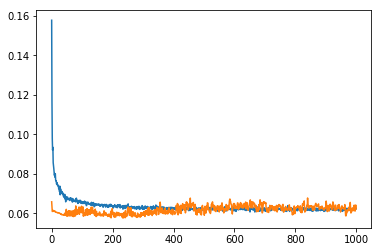

In [64]:
history = tandem.fit(train_Y, train_Y, 
                    epochs=1000, 
                    batch_size=100,
                    validation_data=(test_Y, test_Y), 
                    verbose=2)

train_score = tandem.evaluate(train_Y, train_Y, batch_size=20)
test_score = tandem.evaluate(test_Y, test_Y, batch_size= 50)
print(train_score)
print(test_score)
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')

Two peak Inverse: 200-512-256-100-50-6 Simulator: 20-500-500-200-200<br>
loss = 0.624 val_loss: 0.623
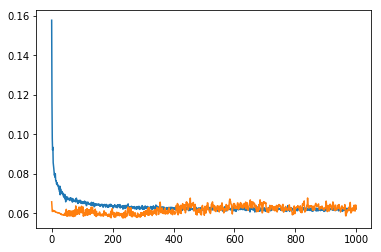

Two peak Inverse: 200-512-256-100-50-6 Simulator: 20-500-500-200-200<br>
loss = 0.627 val_loss: 0.641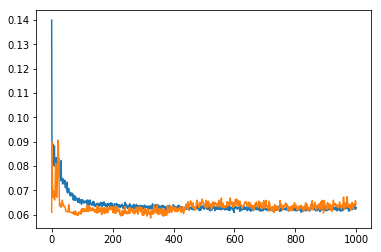

Two peak: Inverse: 200-512-256 sigmoiod Simulator:20-500-500-200-200-200 linear<br>
loss = 0.0598 Val_loss = 0.0678
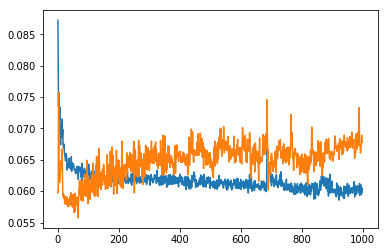

Two peak: Inverse: 512-256 Simulator: 20-500-500-200-200 <br>
loss = 0.666 val_loss = 0.698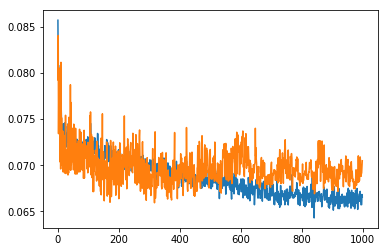

1 2 peak: Inverse: 512-256 Simulator: 20-500-500-200-200  <br> loss = 0.0653 val_loss = 0.724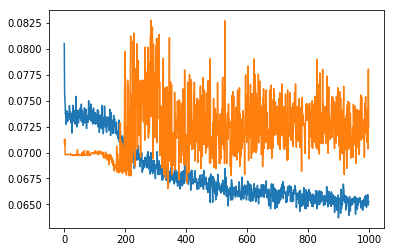

Inverse 512-256 Simulator 20-500-500-200-200-200 <br>loss: 0.0175 val_loss: 0.0177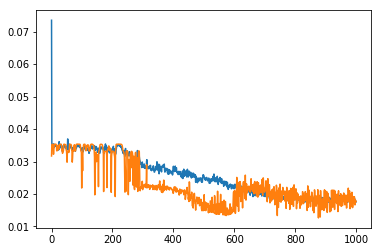

Inverse: 512-256 Simulator: 20-500-500-200-200<br>loss: 0.143 val_loss: 0.154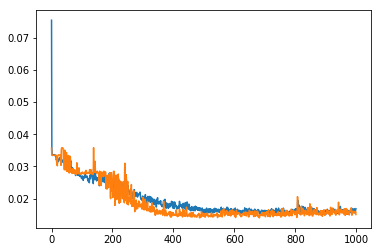

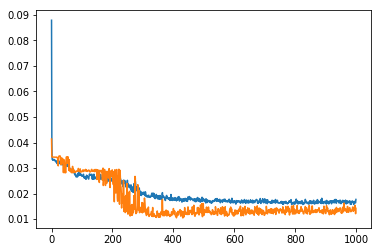

Test 0
True spectrum: 


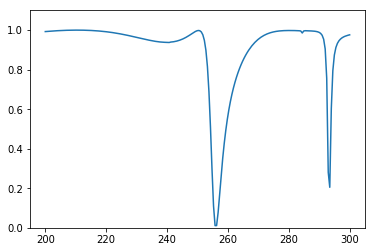

Predicted spectrum: 


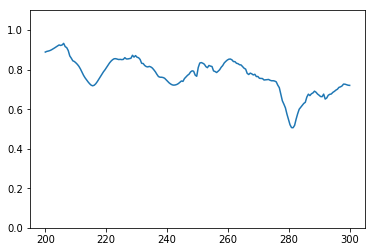

Test 1
True spectrum: 


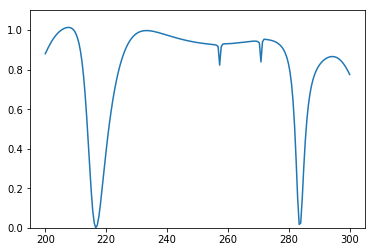

Predicted spectrum: 


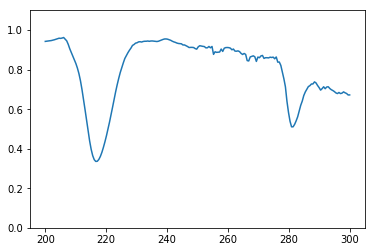

Test 2
True spectrum: 


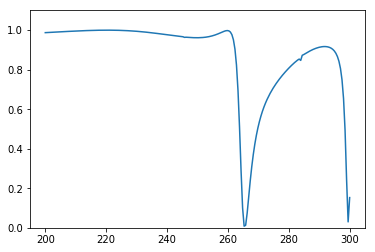

Predicted spectrum: 


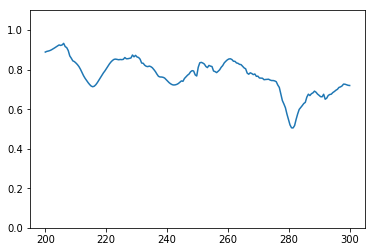

Test 3
True spectrum: 


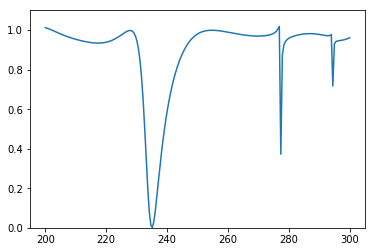

Predicted spectrum: 


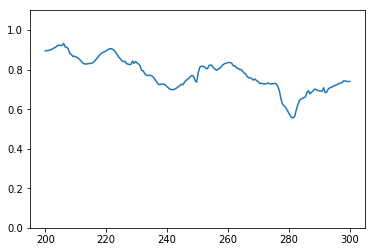

Test 4
True spectrum: 


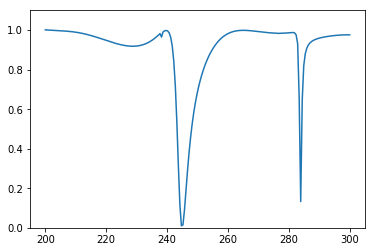

Predicted spectrum: 


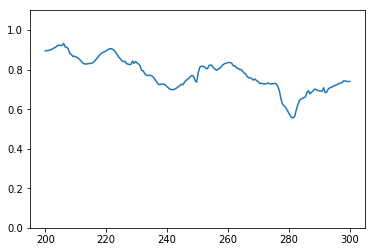

Test 5
True spectrum: 


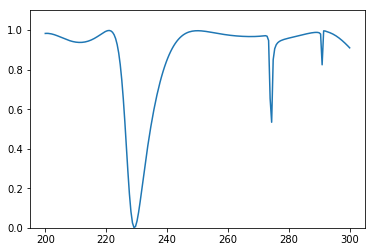

Predicted spectrum: 


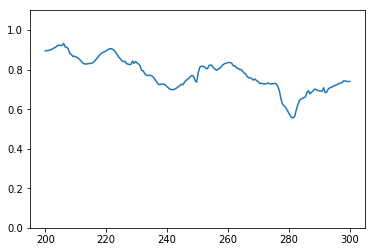

Test 6
True spectrum: 


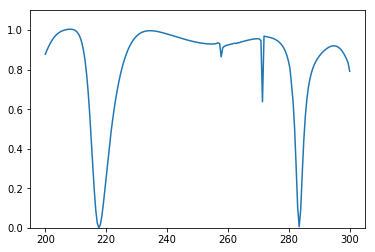

Predicted spectrum: 


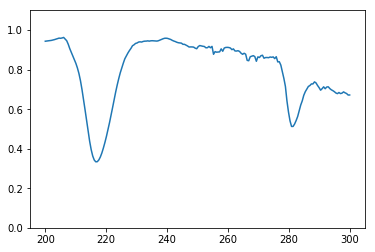

Test 7
True spectrum: 


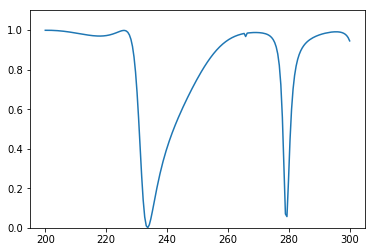

Predicted spectrum: 


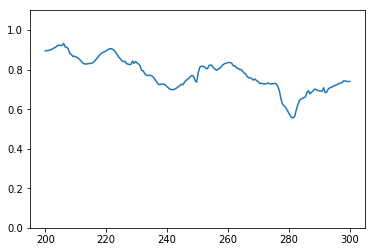

Test 8
True spectrum: 


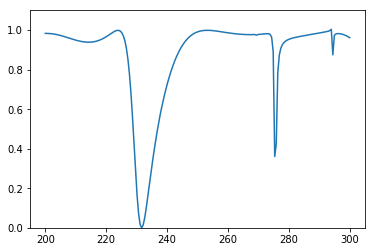

Predicted spectrum: 


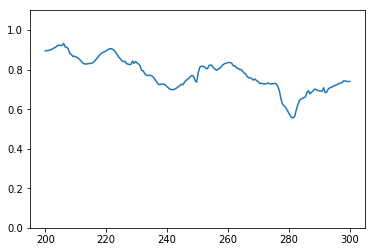

Test 9
True spectrum: 


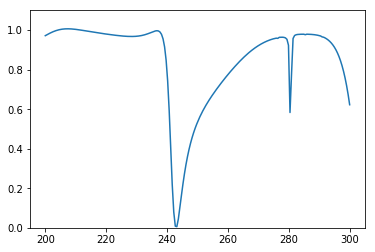

Predicted spectrum: 


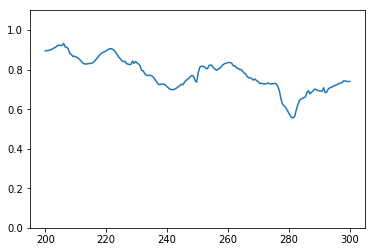

Test 10
True spectrum: 


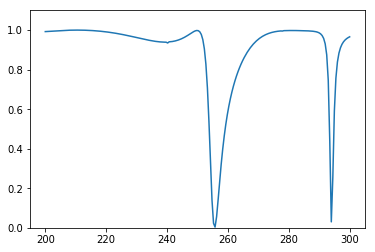

Predicted spectrum: 


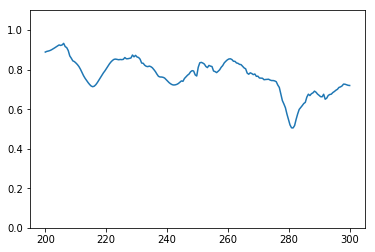

Test 11
True spectrum: 


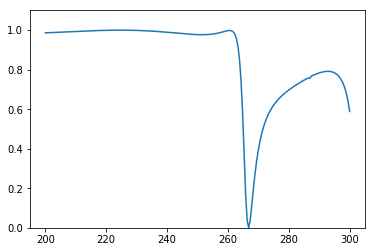

Predicted spectrum: 


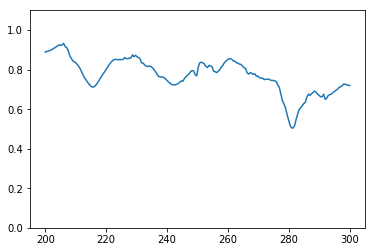

Test 12
True spectrum: 


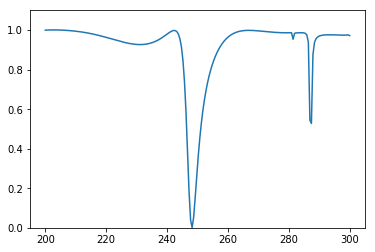

Predicted spectrum: 


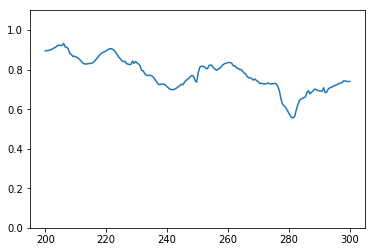

Test 13
True spectrum: 


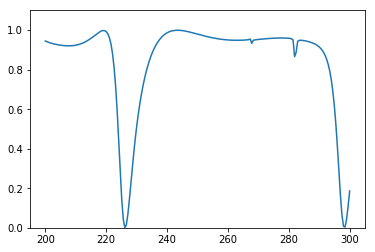

Predicted spectrum: 


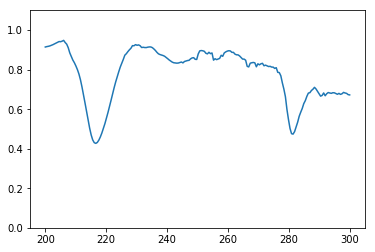

Test 14
True spectrum: 


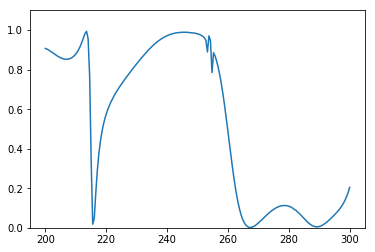

Predicted spectrum: 


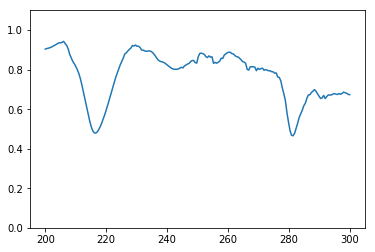

Test 15
True spectrum: 


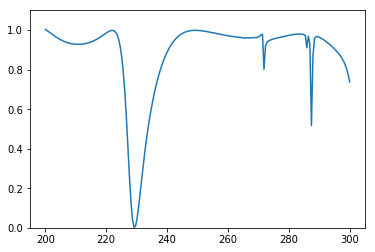

Predicted spectrum: 


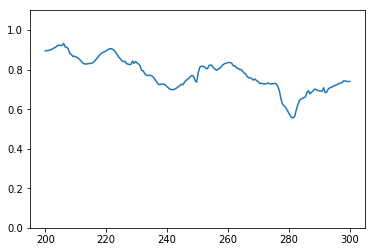

Test 16
True spectrum: 


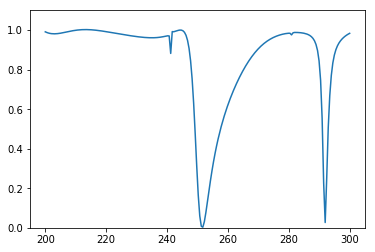

Predicted spectrum: 


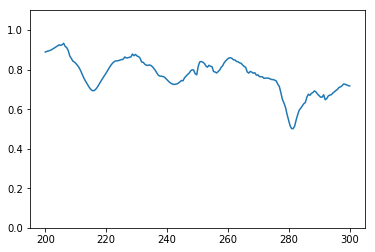

Test 17
True spectrum: 


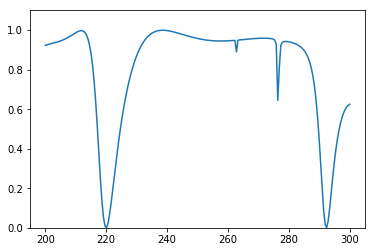

Predicted spectrum: 


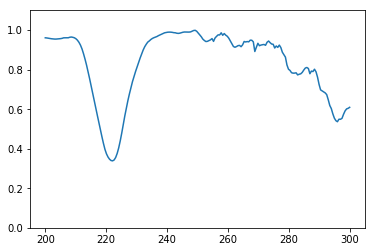

Test 18
True spectrum: 


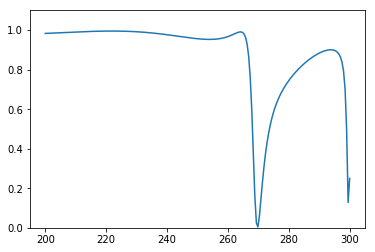

Predicted spectrum: 


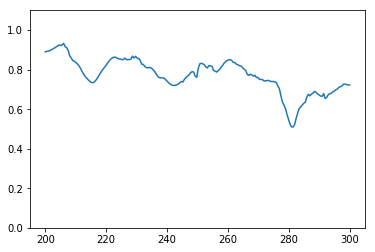

Test 19
True spectrum: 


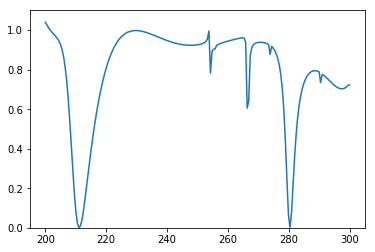

Predicted spectrum: 


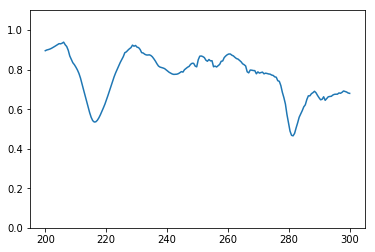

Test 20
True spectrum: 


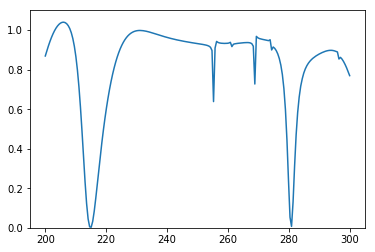

Predicted spectrum: 


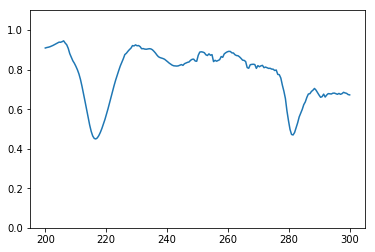

Test 21
True spectrum: 


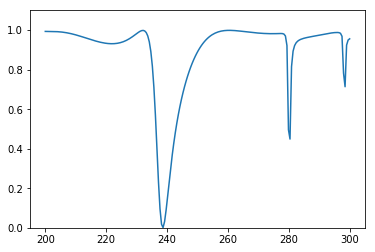

Predicted spectrum: 


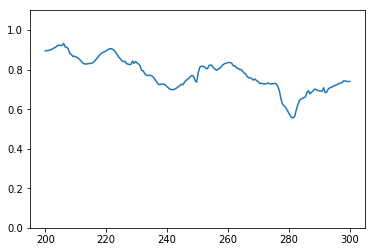

Test 22
True spectrum: 


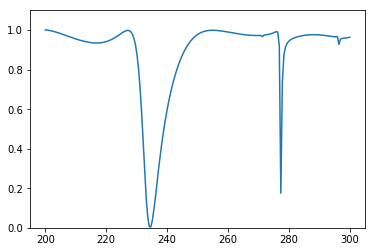

Predicted spectrum: 


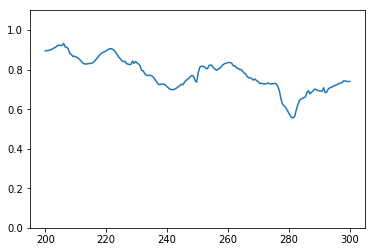

Test 23
True spectrum: 


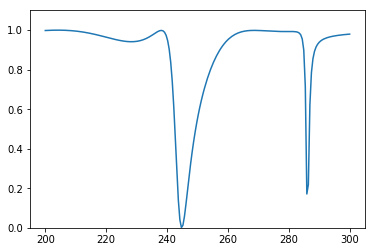

Predicted spectrum: 


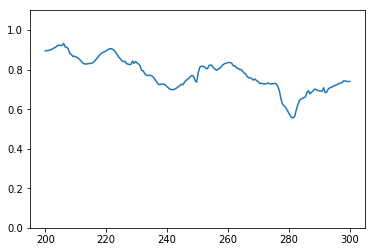

Test 24
True spectrum: 


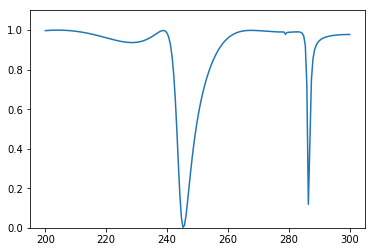

Predicted spectrum: 


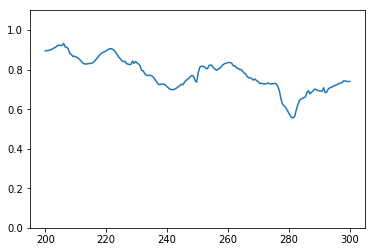

Test 25
True spectrum: 


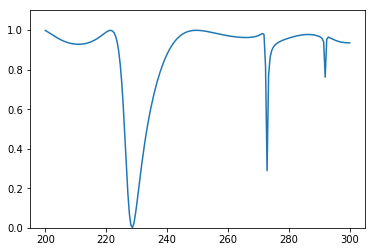

Predicted spectrum: 


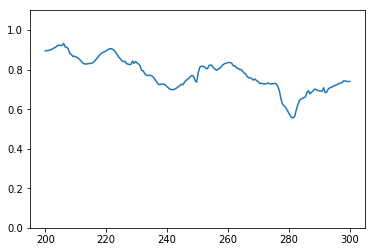

Test 26
True spectrum: 


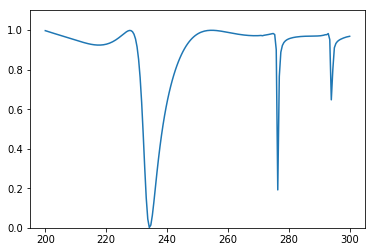

Predicted spectrum: 


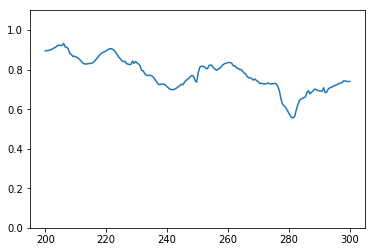

Test 27
True spectrum: 


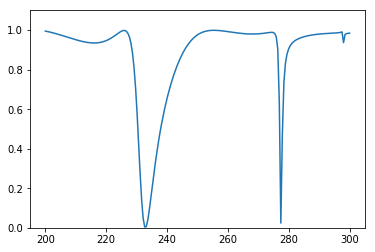

Predicted spectrum: 


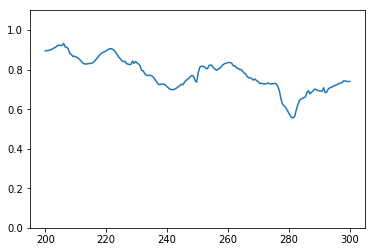

Test 28
True spectrum: 


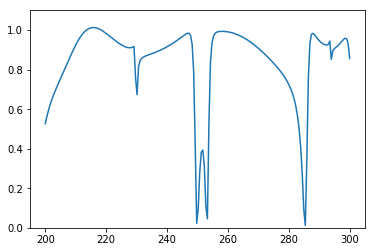

Predicted spectrum: 


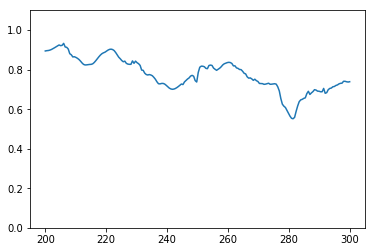

Test 29
True spectrum: 


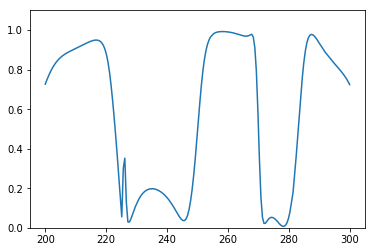

Predicted spectrum: 


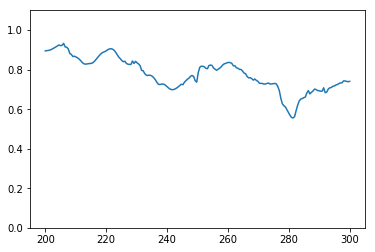

Test 30
True spectrum: 


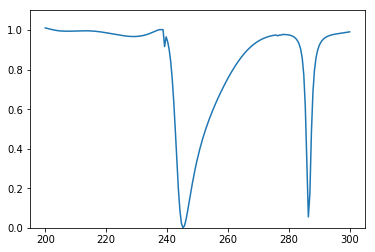

Predicted spectrum: 


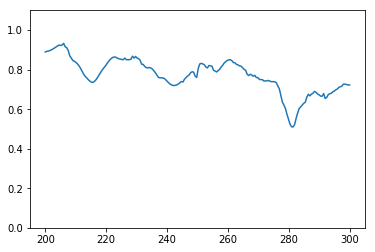

Test 31
True spectrum: 


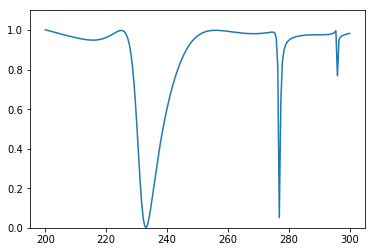

Predicted spectrum: 


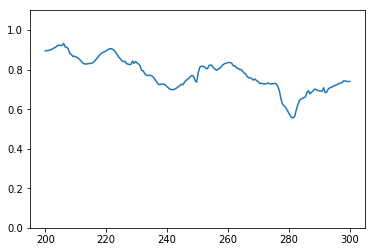

Test 32
True spectrum: 


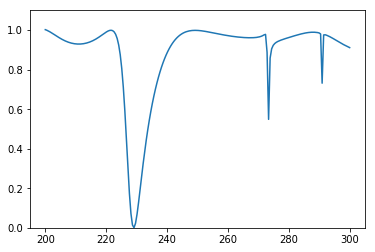

Predicted spectrum: 


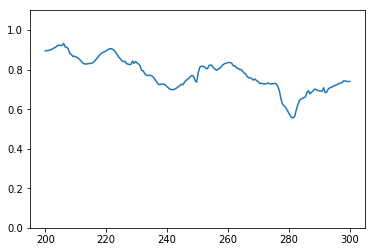

Test 33
True spectrum: 


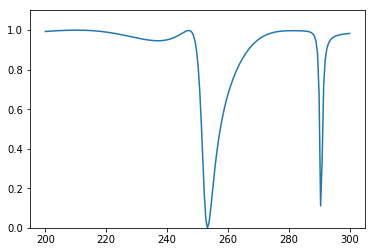

Predicted spectrum: 


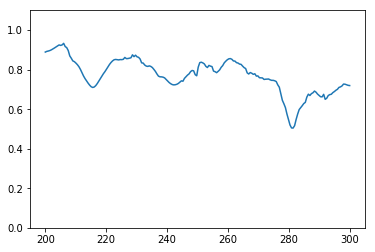

Test 34
True spectrum: 


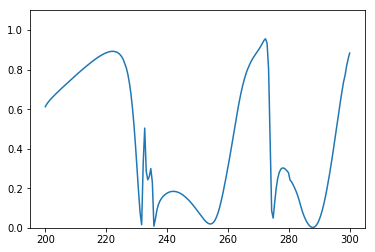

Predicted spectrum: 


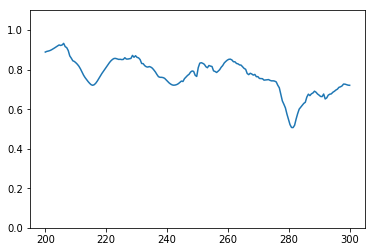

Test 35
True spectrum: 


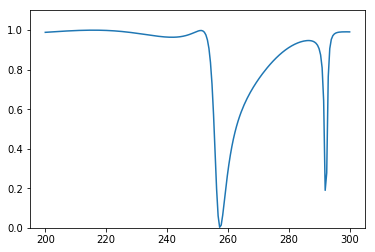

Predicted spectrum: 


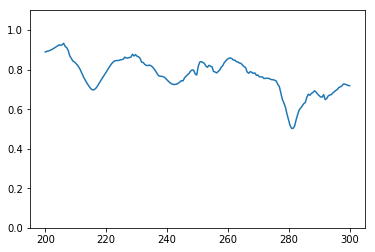

Test 36
True spectrum: 


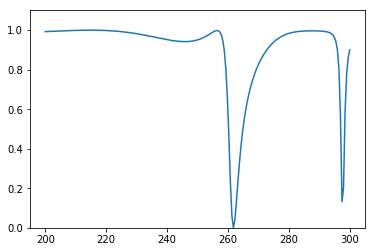

Predicted spectrum: 


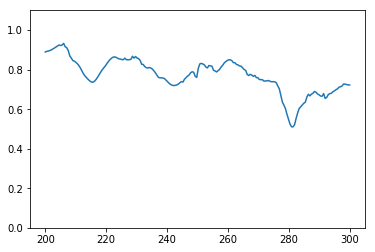

Test 37
True spectrum: 


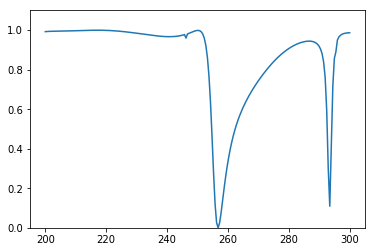

Predicted spectrum: 


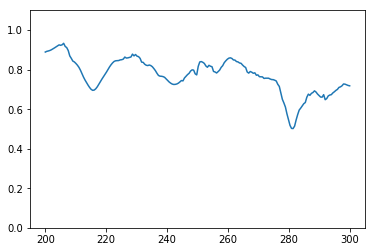

Test 38
True spectrum: 


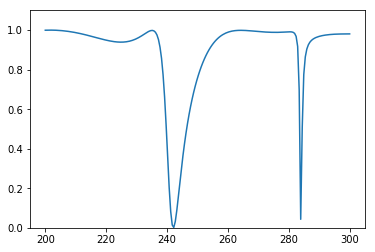

Predicted spectrum: 


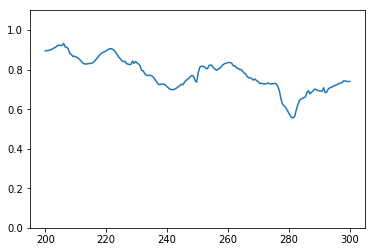

Test 39
True spectrum: 


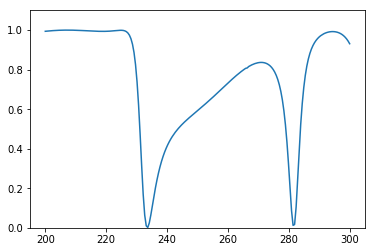

Predicted spectrum: 


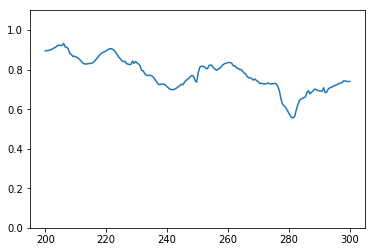

Test 40
True spectrum: 


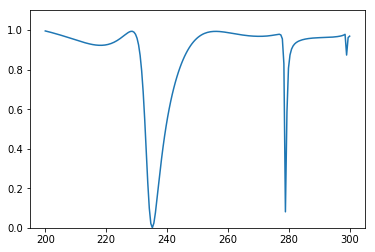

Predicted spectrum: 


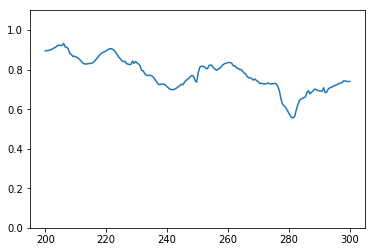

Test 41
True spectrum: 


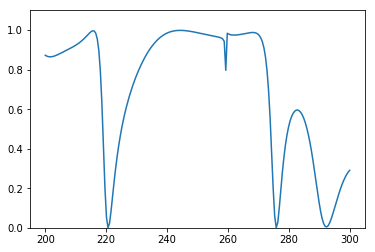

Predicted spectrum: 


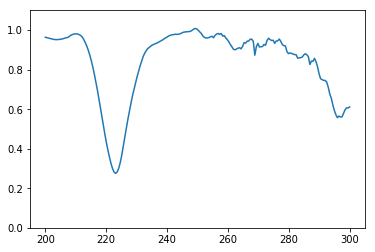

Test 42
True spectrum: 


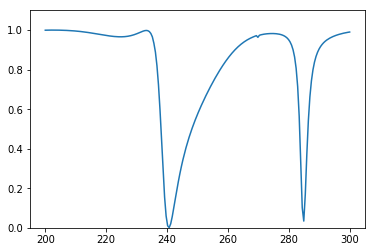

Predicted spectrum: 


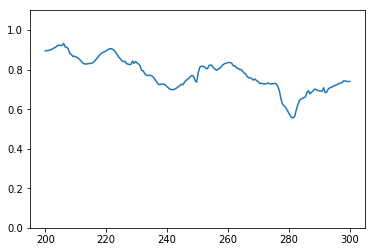

Test 43
True spectrum: 


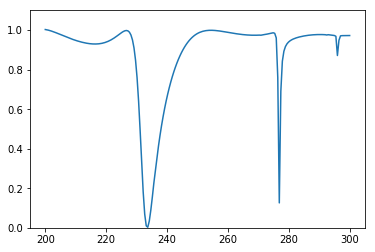

Predicted spectrum: 


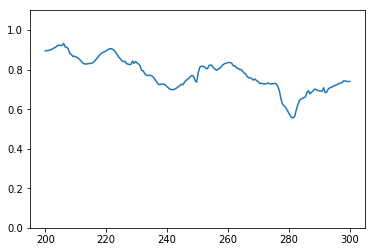

Test 44
True spectrum: 


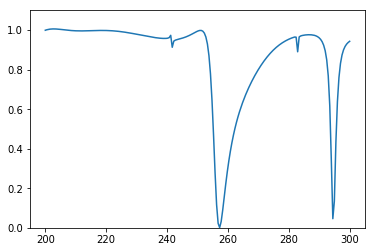

Predicted spectrum: 


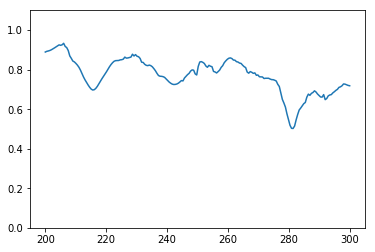

Test 45
True spectrum: 


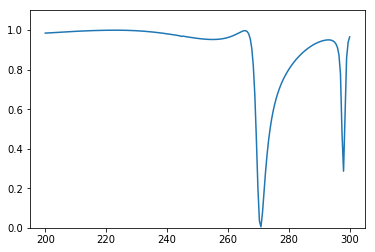

Predicted spectrum: 


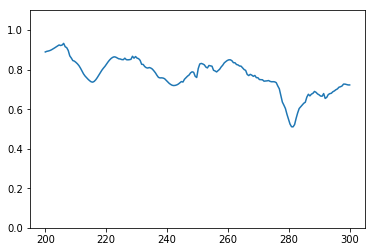

Test 46
True spectrum: 


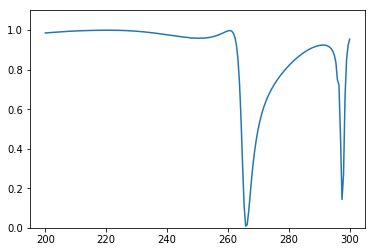

Predicted spectrum: 


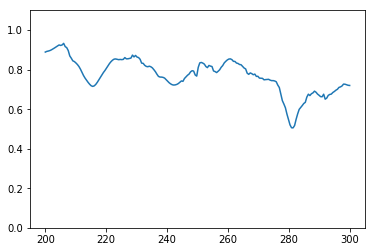

Test 47
True spectrum: 


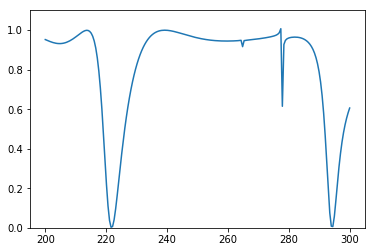

Predicted spectrum: 


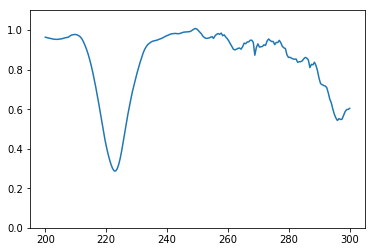

Test 48
True spectrum: 


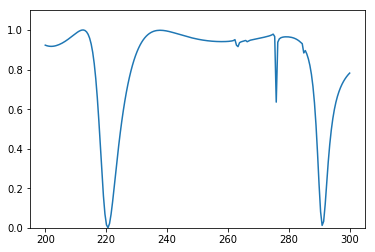

Predicted spectrum: 


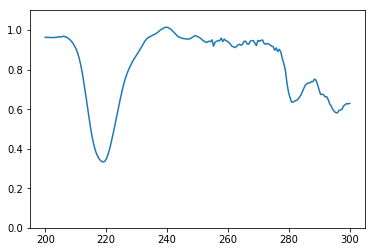

Test 49
True spectrum: 


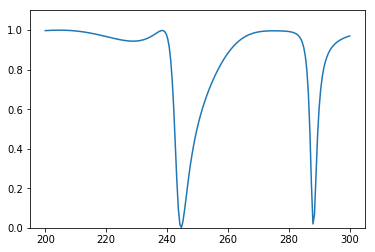

Predicted spectrum: 


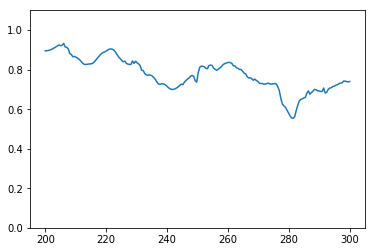

Test 50
True spectrum: 


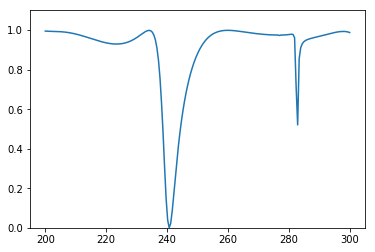

Predicted spectrum: 


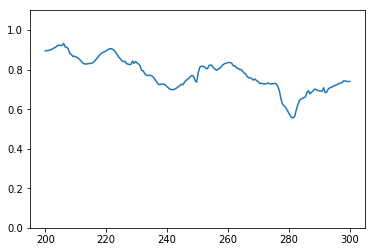

Test 51
True spectrum: 


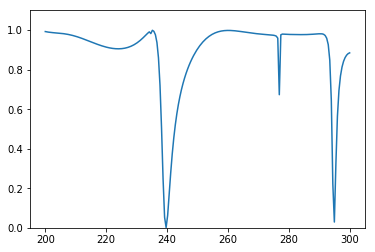

Predicted spectrum: 


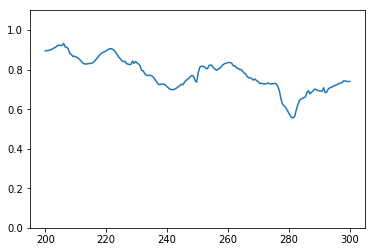

Test 52
True spectrum: 


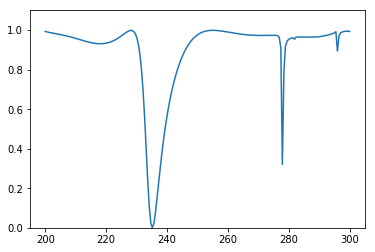

Predicted spectrum: 


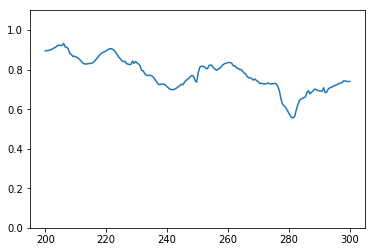

Test 53
True spectrum: 


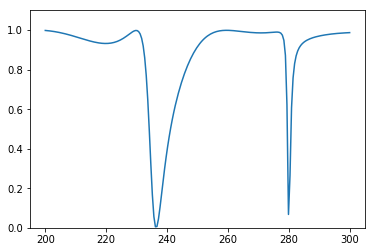

Predicted spectrum: 


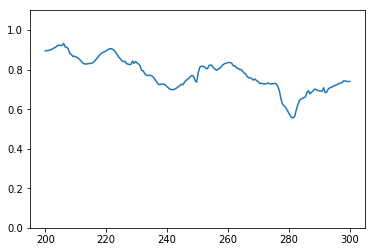

Test 54
True spectrum: 


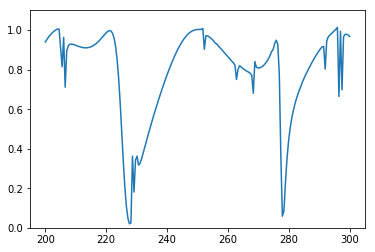

Predicted spectrum: 


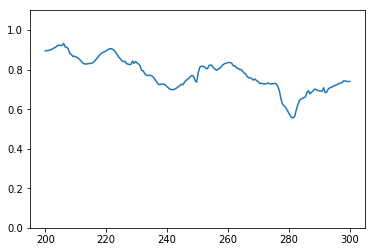

Test 55
True spectrum: 


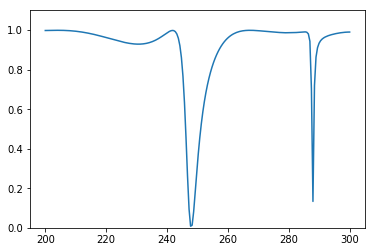

Predicted spectrum: 


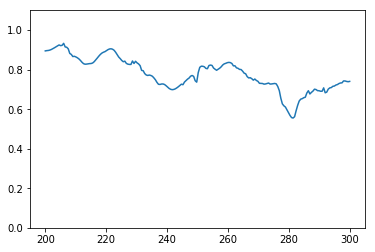

Test 56
True spectrum: 


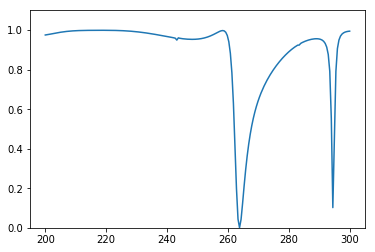

Predicted spectrum: 


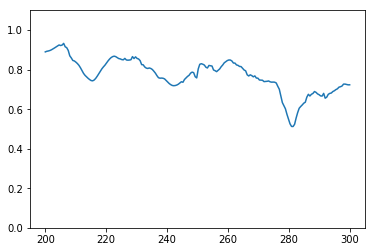

Test 57
True spectrum: 


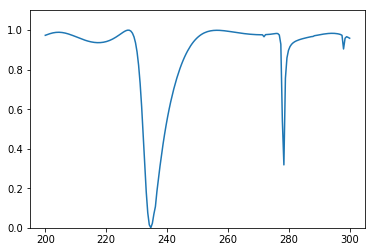

Predicted spectrum: 


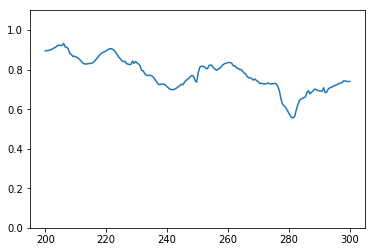

Test 58
True spectrum: 


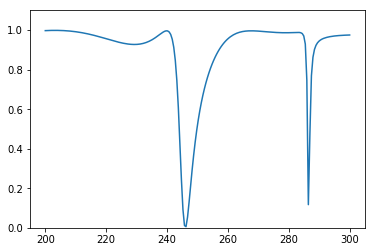

Predicted spectrum: 


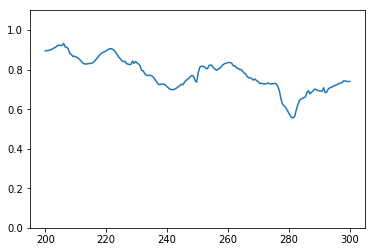

Test 59
True spectrum: 


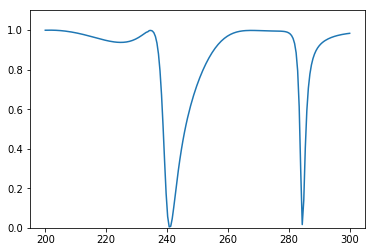

Predicted spectrum: 


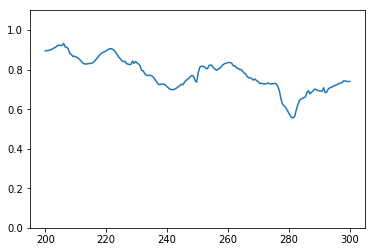

Test 60
True spectrum: 


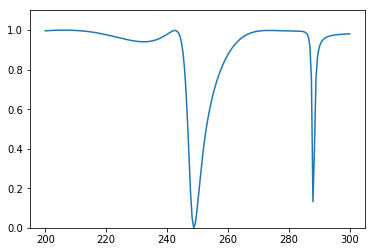

Predicted spectrum: 


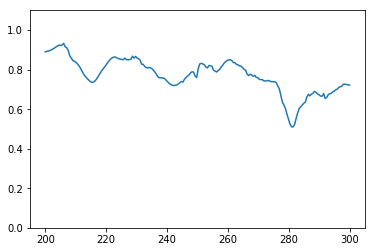

Test 61
True spectrum: 


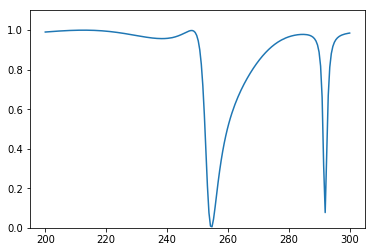

Predicted spectrum: 


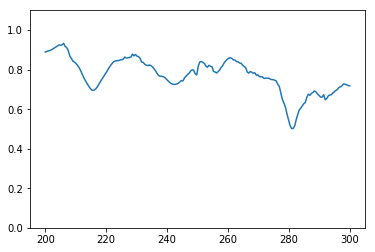

Test 62
True spectrum: 


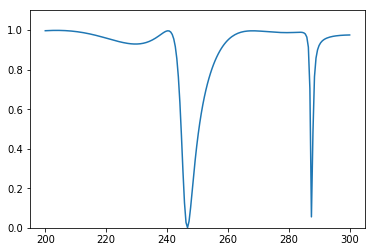

Predicted spectrum: 


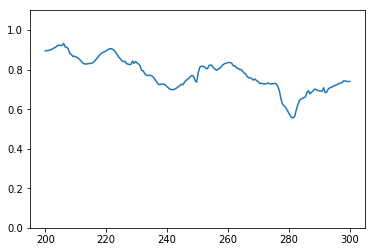

Test 63
True spectrum: 


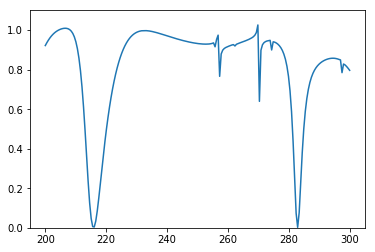

Predicted spectrum: 


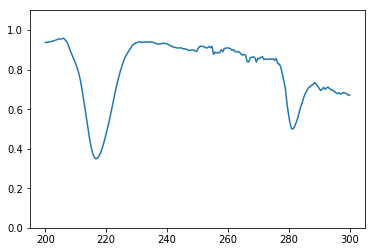

Test 64
True spectrum: 


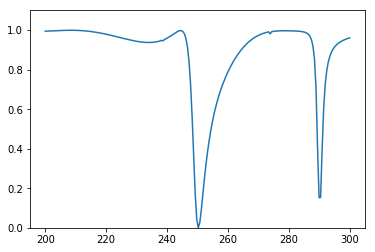

Predicted spectrum: 


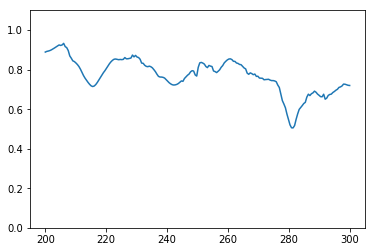

Test 65
True spectrum: 


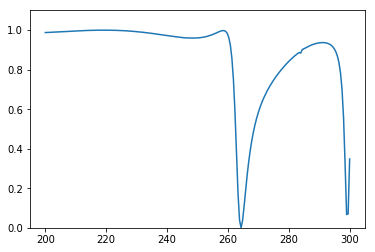

Predicted spectrum: 


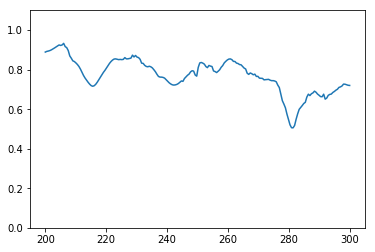

Test 66
True spectrum: 


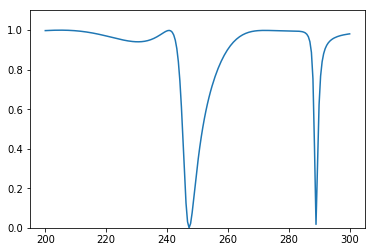

Predicted spectrum: 


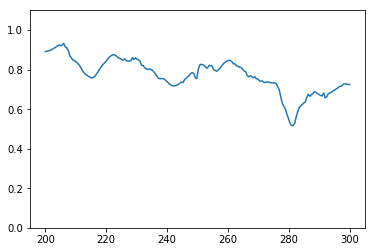

Test 67
True spectrum: 


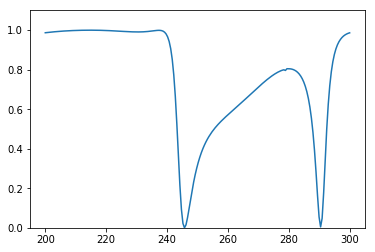

Predicted spectrum: 


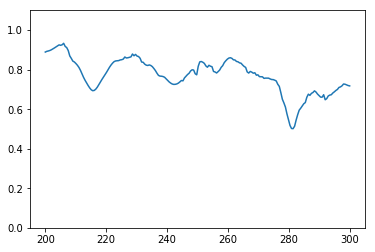

Test 68
True spectrum: 


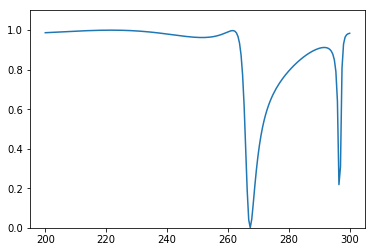

Predicted spectrum: 


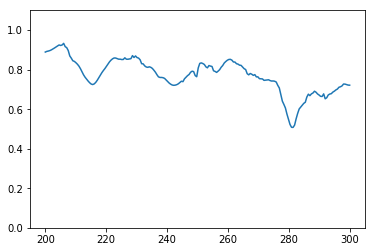

Test 69
True spectrum: 


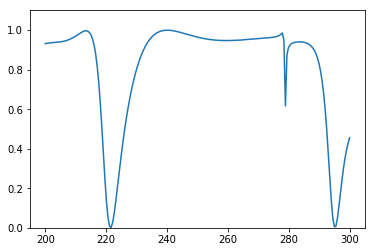

Predicted spectrum: 


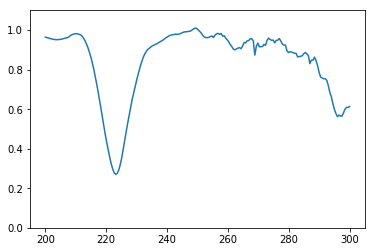

Test 70
True spectrum: 


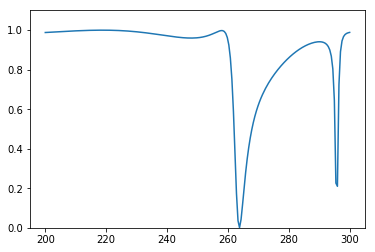

Predicted spectrum: 


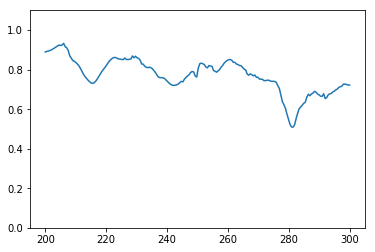

Test 71
True spectrum: 


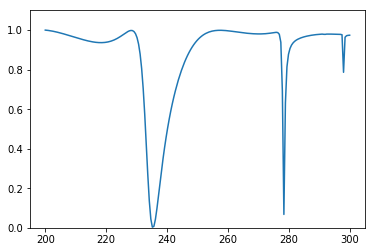

Predicted spectrum: 


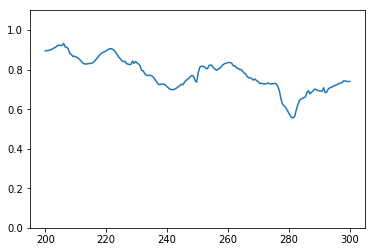

Test 72
True spectrum: 


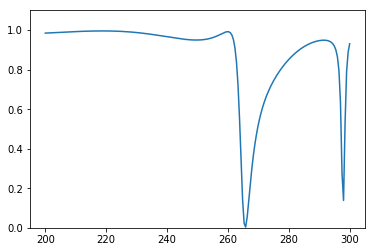

Predicted spectrum: 


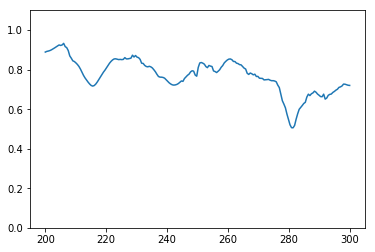

Test 73
True spectrum: 


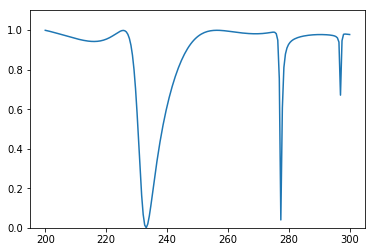

Predicted spectrum: 


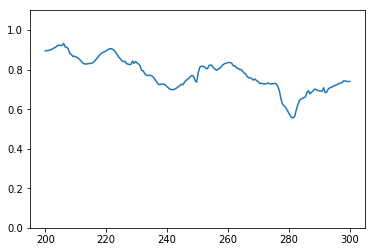

Test 74
True spectrum: 


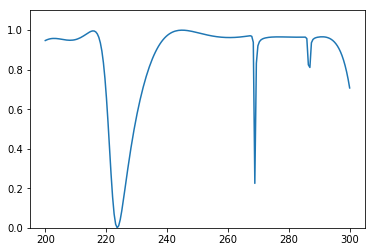

Predicted spectrum: 


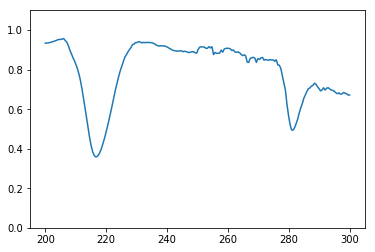

Test 75
True spectrum: 


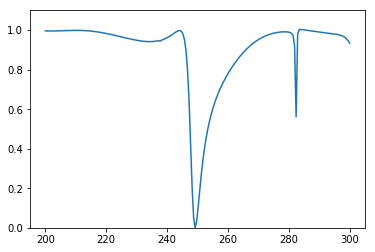

Predicted spectrum: 


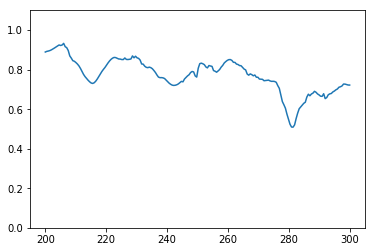

Test 76
True spectrum: 


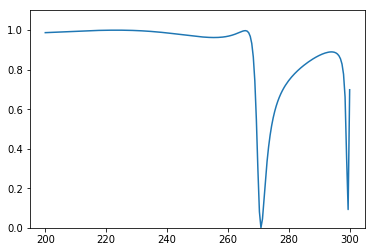

Predicted spectrum: 


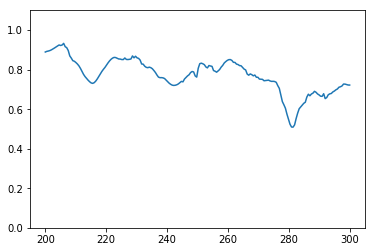

Test 77
True spectrum: 


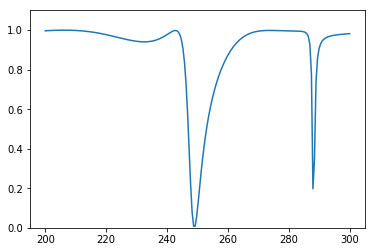

Predicted spectrum: 


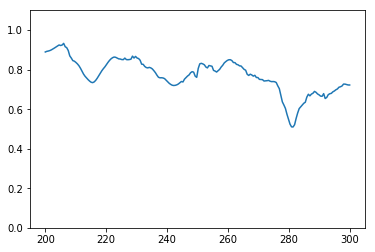

Test 78
True spectrum: 


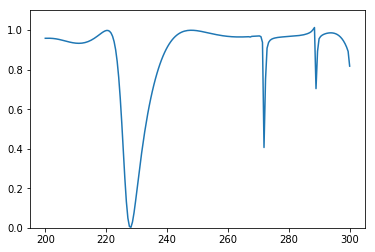

Predicted spectrum: 


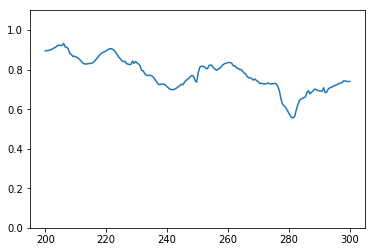

Test 79
True spectrum: 


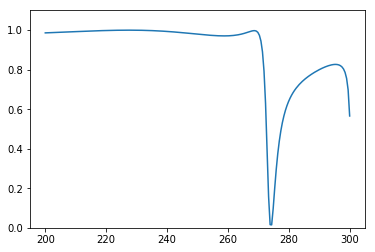

Predicted spectrum: 


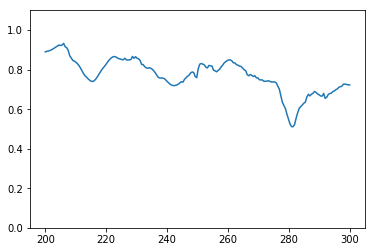

Test 80
True spectrum: 


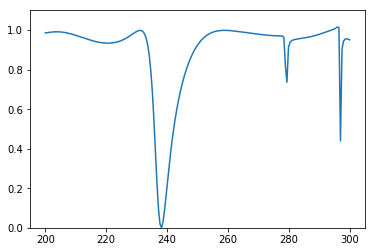

Predicted spectrum: 


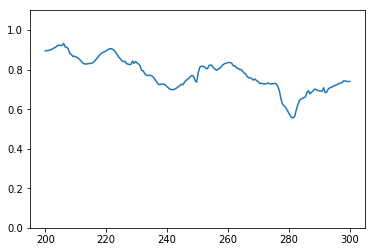

Test 81
True spectrum: 


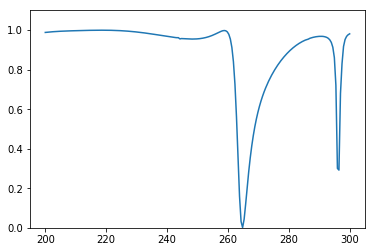

Predicted spectrum: 


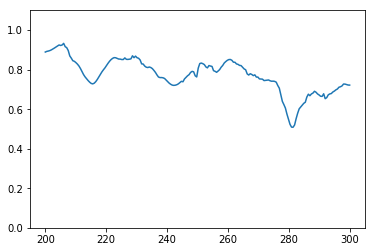

Test 82
True spectrum: 


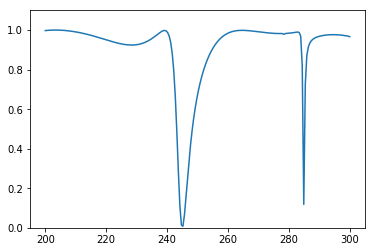

Predicted spectrum: 


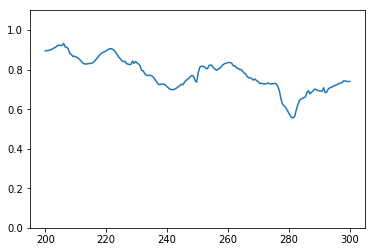

Test 83
True spectrum: 


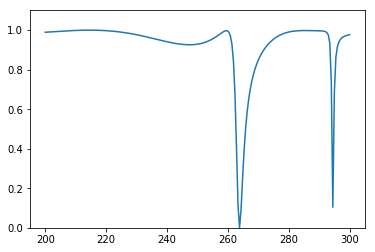

Predicted spectrum: 


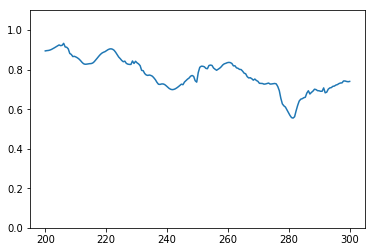

Test 84
True spectrum: 


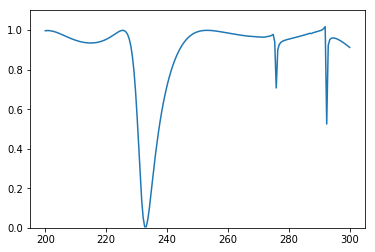

Predicted spectrum: 


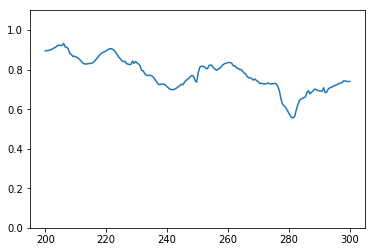

Test 85
True spectrum: 


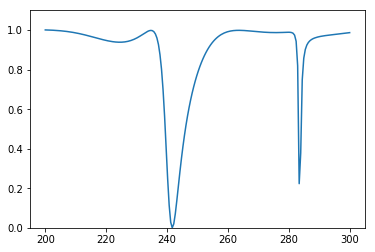

Predicted spectrum: 


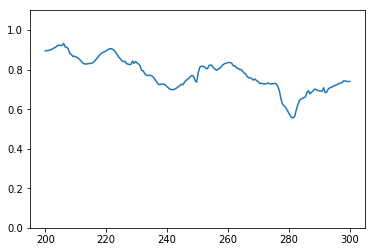

Test 86
True spectrum: 


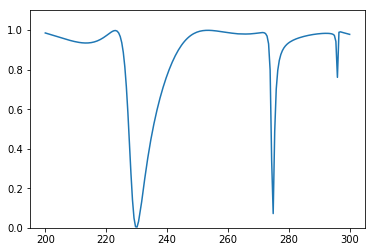

Predicted spectrum: 


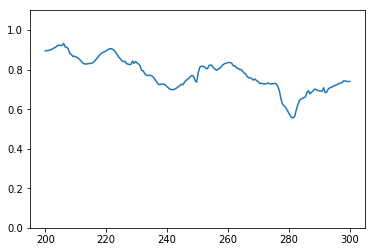

Test 87
True spectrum: 


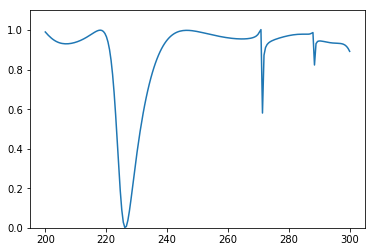

Predicted spectrum: 


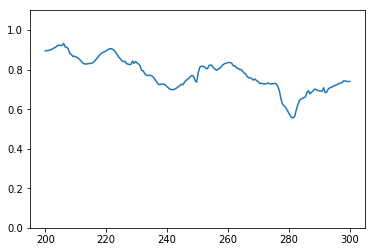

Test 88
True spectrum: 


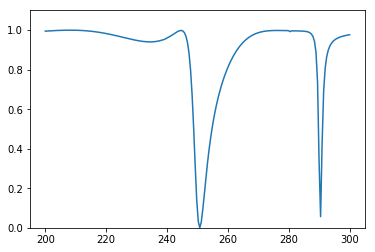

Predicted spectrum: 


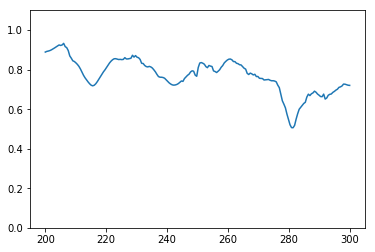

Test 89
True spectrum: 


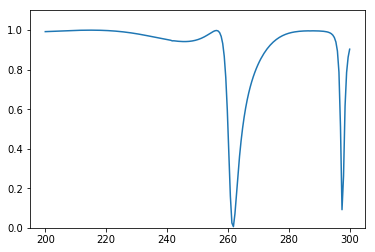

Predicted spectrum: 


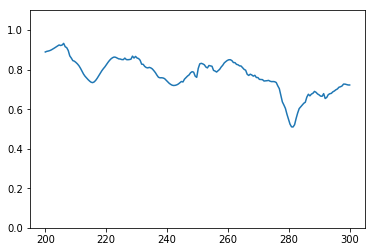

Test 90
True spectrum: 


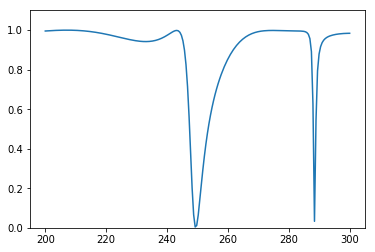

Predicted spectrum: 


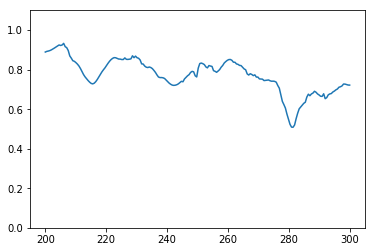

Test 91
True spectrum: 


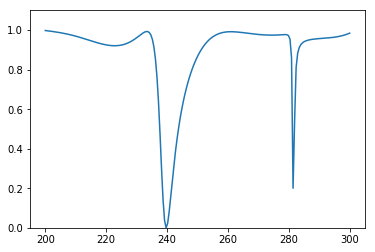

Predicted spectrum: 


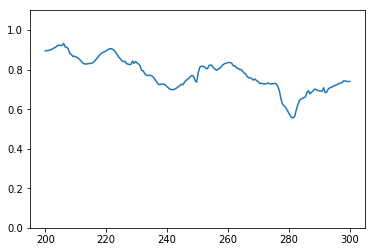

Test 92
True spectrum: 


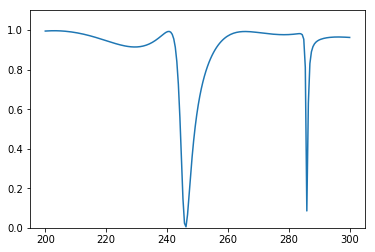

Predicted spectrum: 


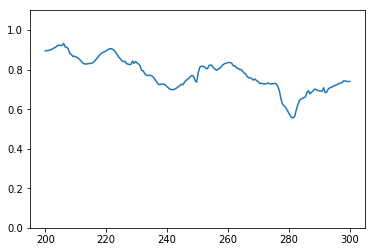

Test 93
True spectrum: 


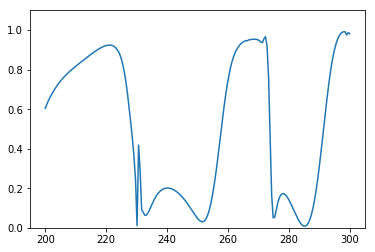

Predicted spectrum: 


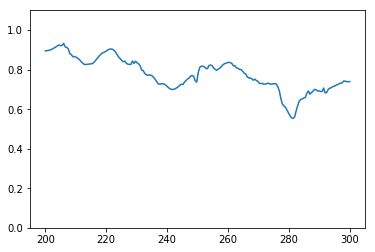

Test 94
True spectrum: 


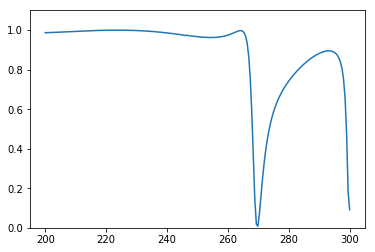

Predicted spectrum: 


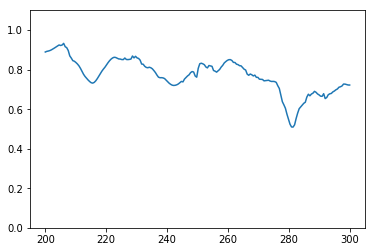

Test 95
True spectrum: 


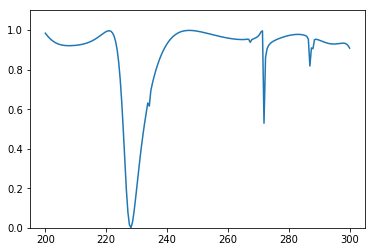

Predicted spectrum: 


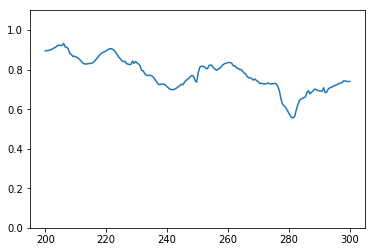

Test 96
True spectrum: 


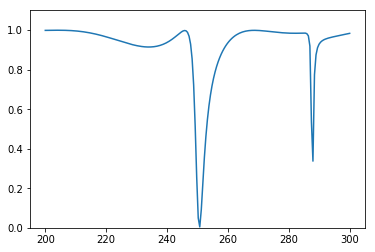

Predicted spectrum: 


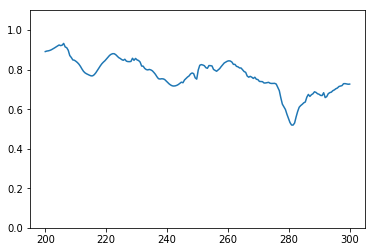

Test 97
True spectrum: 


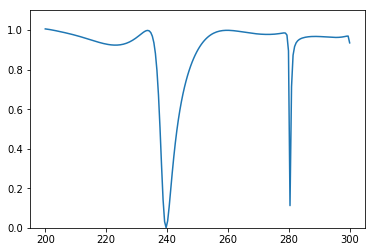

Predicted spectrum: 


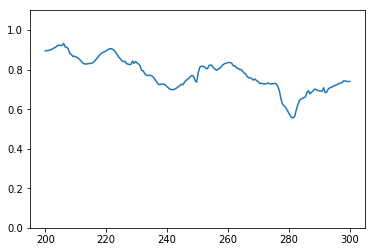

Test 98
True spectrum: 


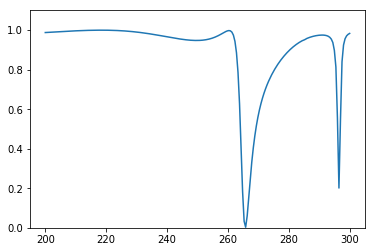

Predicted spectrum: 


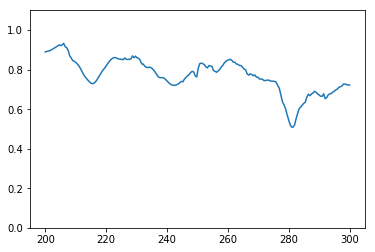

Test 99
True spectrum: 


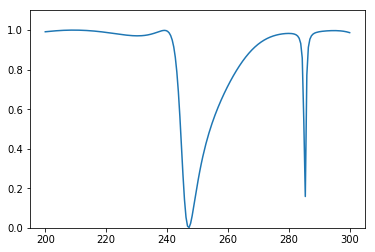

Predicted spectrum: 


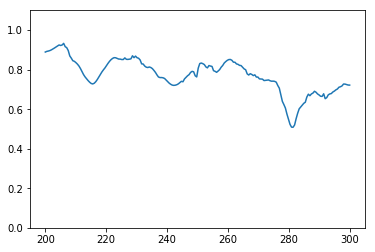

Test 100
True spectrum: 


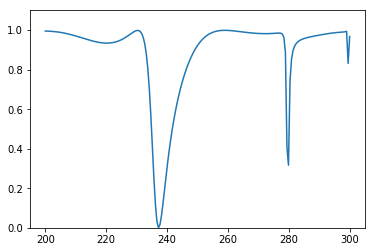

Predicted spectrum: 


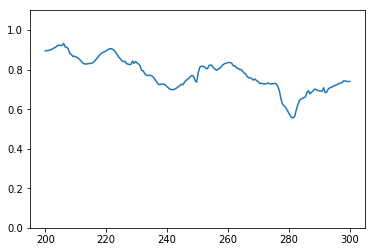

Test 101
True spectrum: 


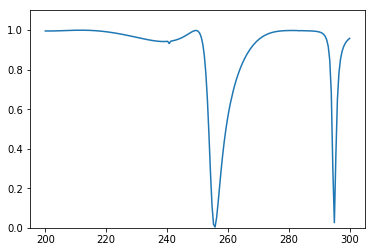

Predicted spectrum: 


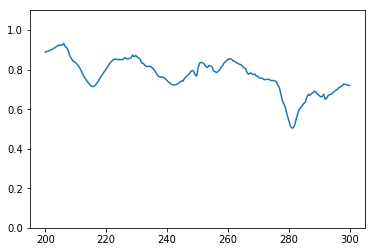

Test 102
True spectrum: 


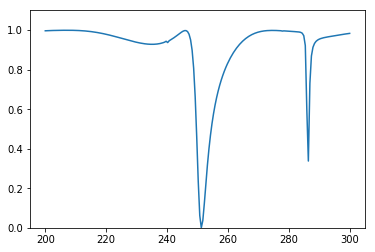

Predicted spectrum: 


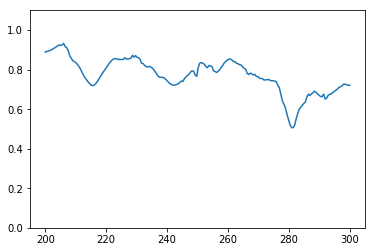

Test 103
True spectrum: 


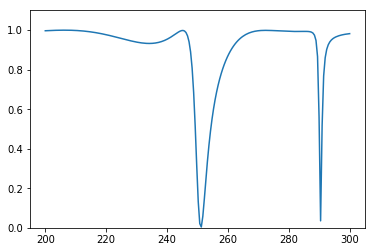

Predicted spectrum: 


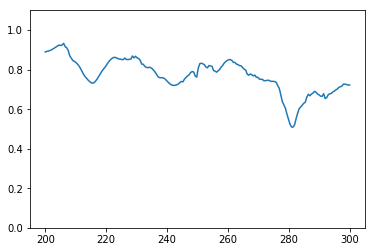

Test 104
True spectrum: 


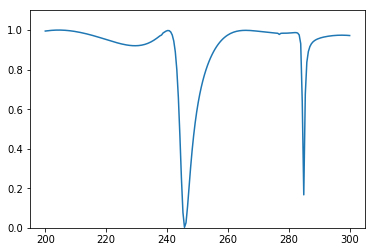

Predicted spectrum: 


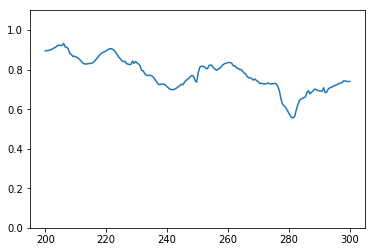

Test 105
True spectrum: 


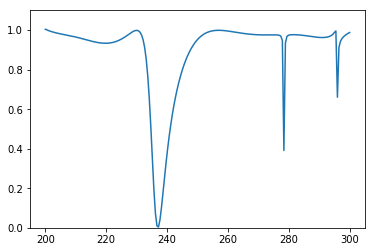

Predicted spectrum: 


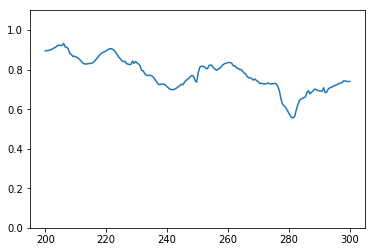

Test 106
True spectrum: 


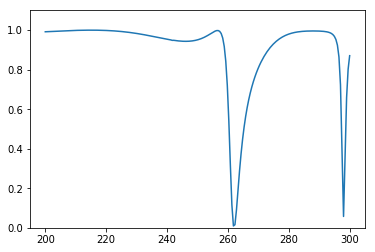

Predicted spectrum: 


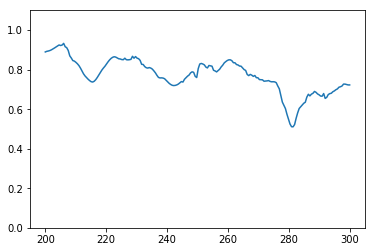

Test 107
True spectrum: 


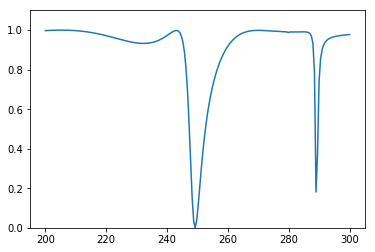

Predicted spectrum: 


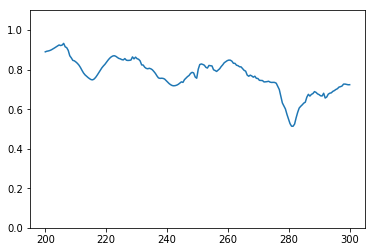

Test 108
True spectrum: 


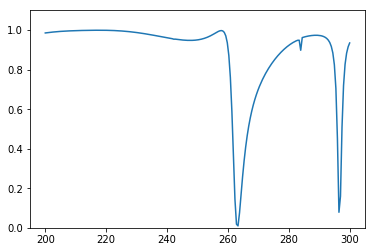

Predicted spectrum: 


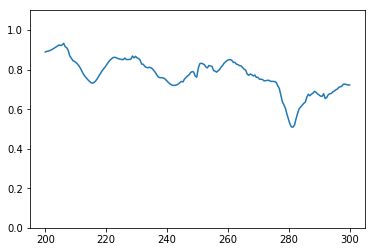

Test 109
True spectrum: 


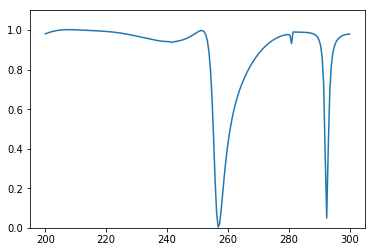

Predicted spectrum: 


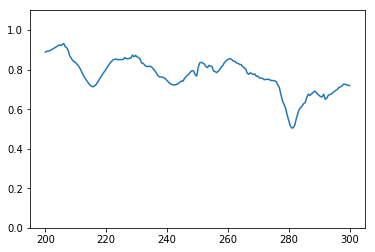

Test 110
True spectrum: 


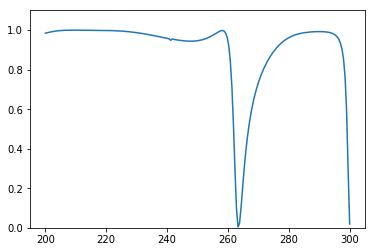

Predicted spectrum: 


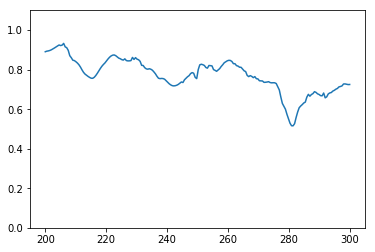

Test 111
True spectrum: 


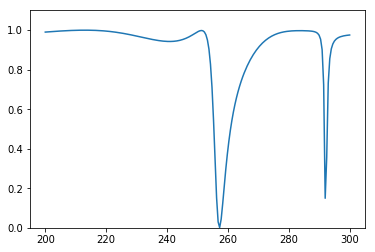

Predicted spectrum: 


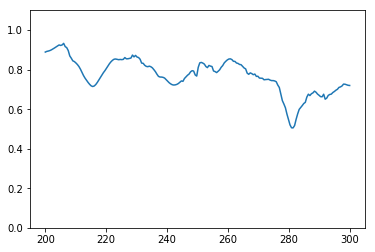

Test 112
True spectrum: 


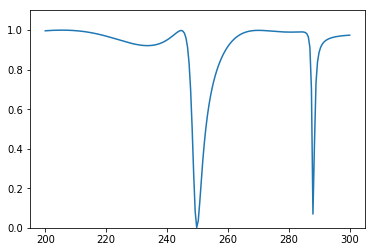

Predicted spectrum: 


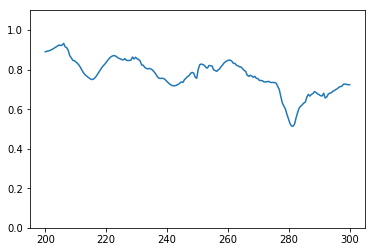

Test 113
True spectrum: 


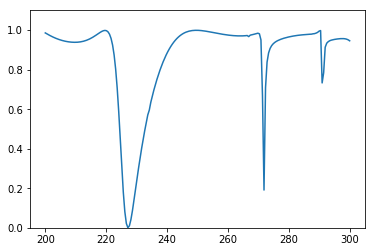

Predicted spectrum: 


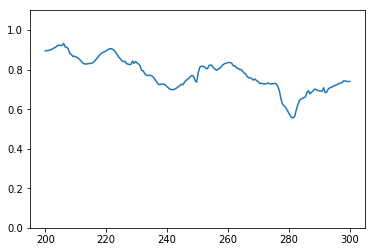

Test 114
True spectrum: 


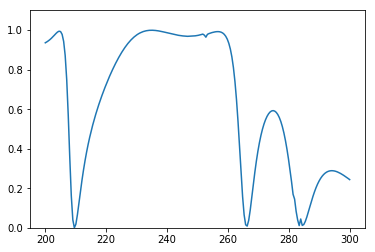

Predicted spectrum: 


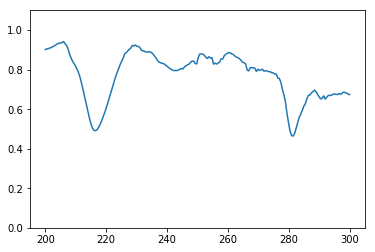

Test 115
True spectrum: 


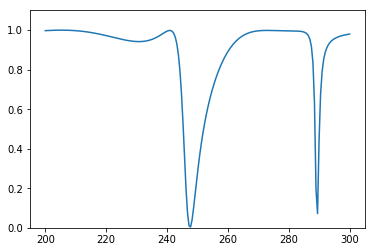

Predicted spectrum: 


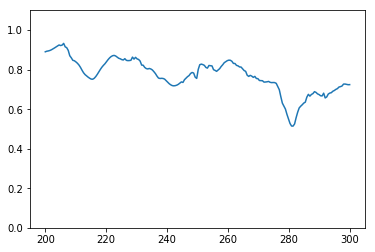

Test 116
True spectrum: 


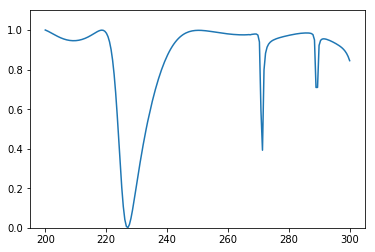

Predicted spectrum: 


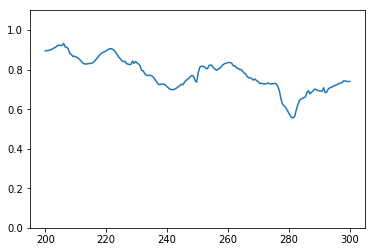

Test 117
True spectrum: 


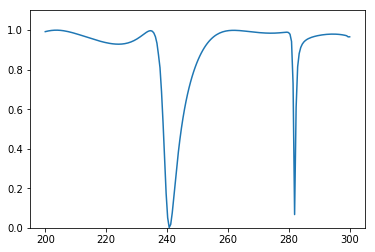

Predicted spectrum: 


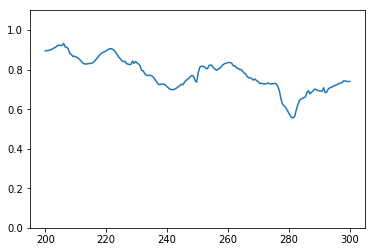

Test 118
True spectrum: 


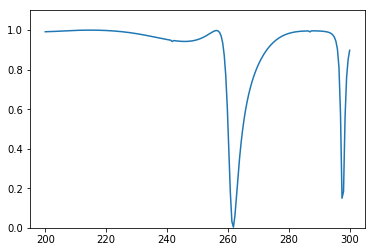

Predicted spectrum: 


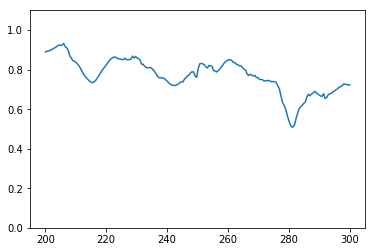

Test 119
True spectrum: 


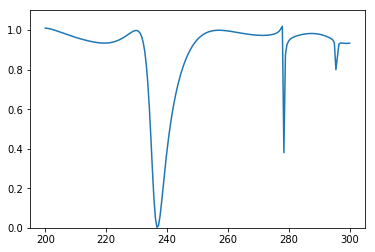

Predicted spectrum: 


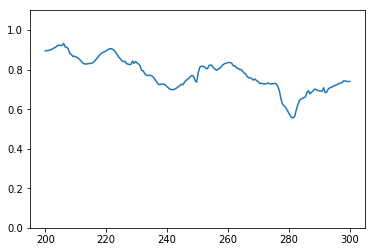

Test 120
True spectrum: 


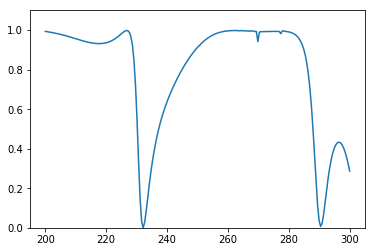

Predicted spectrum: 


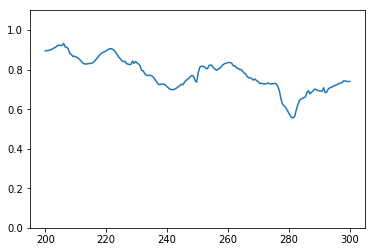

Test 121
True spectrum: 


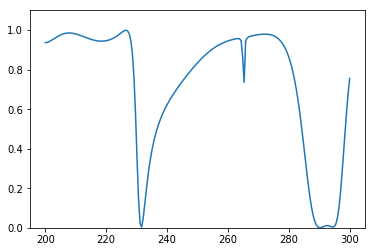

Predicted spectrum: 


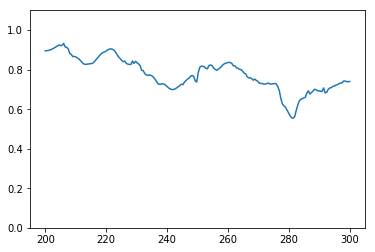

Test 122
True spectrum: 


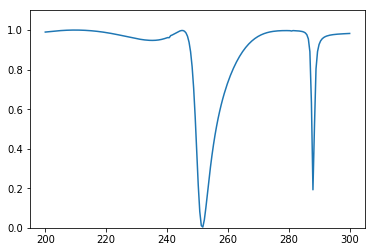

Predicted spectrum: 


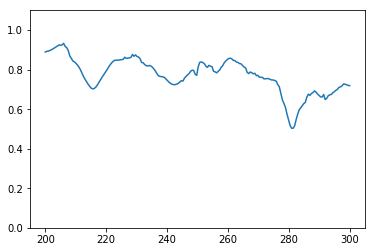

Test 123
True spectrum: 


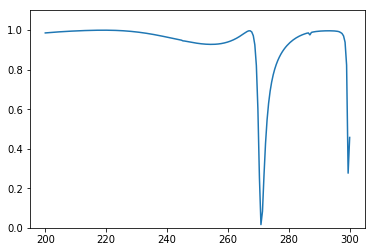

Predicted spectrum: 


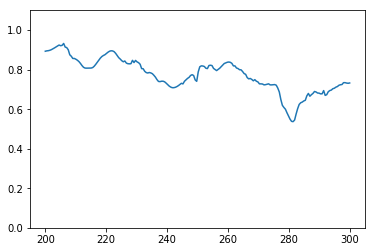

Test 124
True spectrum: 


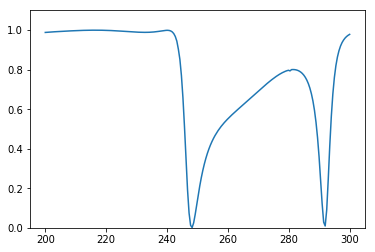

Predicted spectrum: 


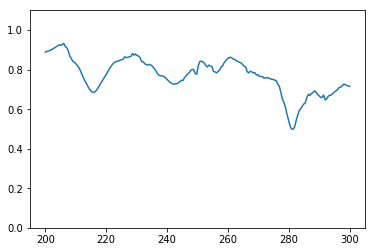

Test 125
True spectrum: 


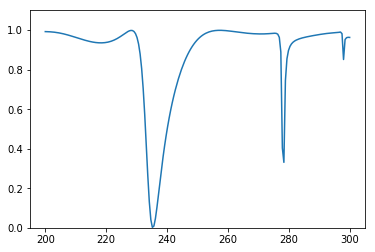

Predicted spectrum: 


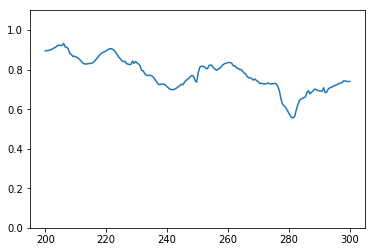

Test 126
True spectrum: 


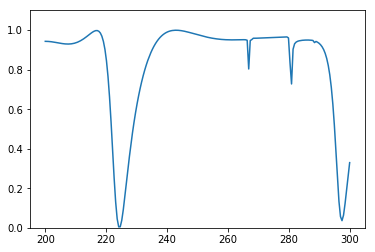

Predicted spectrum: 


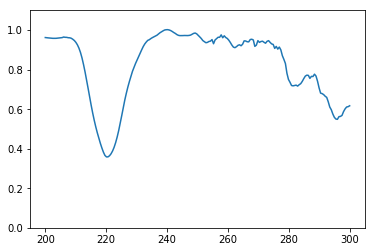

Test 127
True spectrum: 


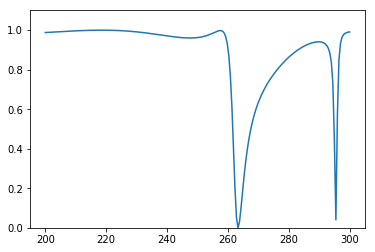

Predicted spectrum: 


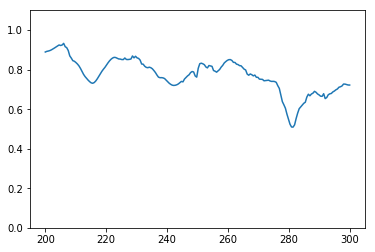

Test 128
True spectrum: 


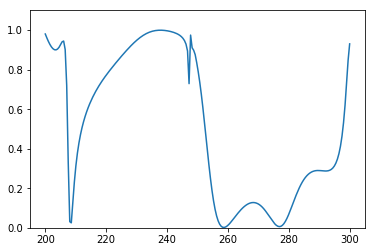

Predicted spectrum: 


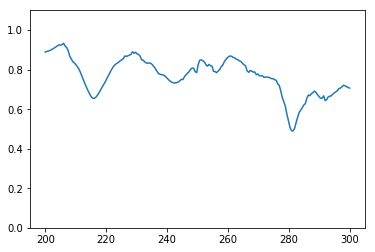

Test 129
True spectrum: 


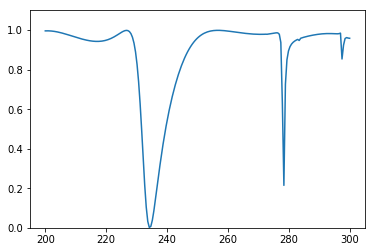

Predicted spectrum: 


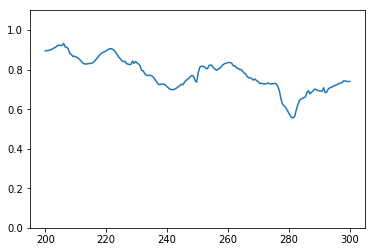

Test 130
True spectrum: 


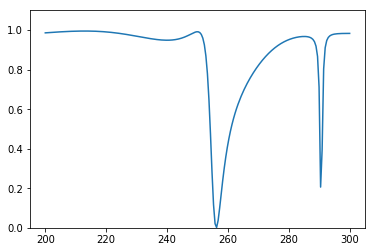

Predicted spectrum: 


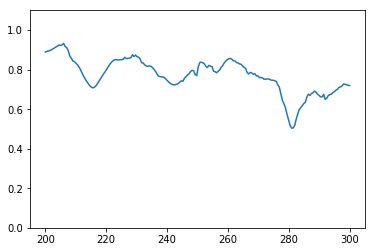

Test 131
True spectrum: 


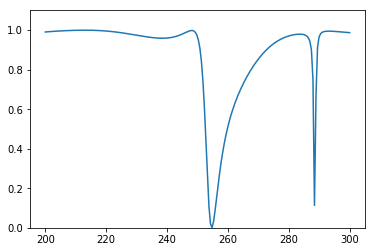

Predicted spectrum: 


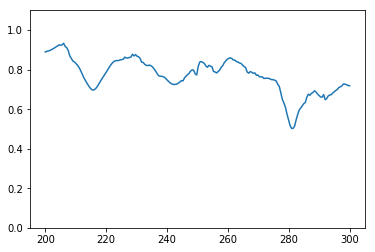

Test 132
True spectrum: 


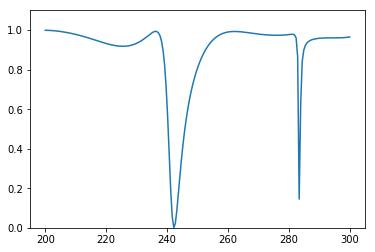

Predicted spectrum: 


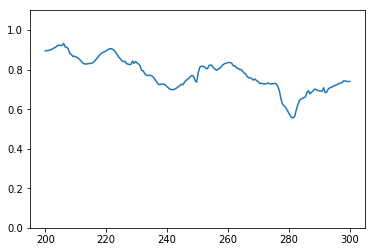

Test 133
True spectrum: 


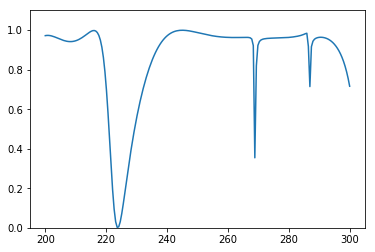

Predicted spectrum: 


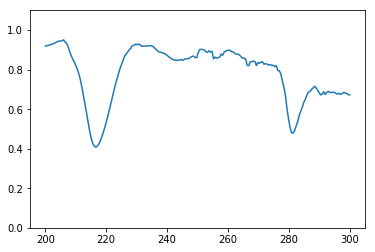

Test 134
True spectrum: 


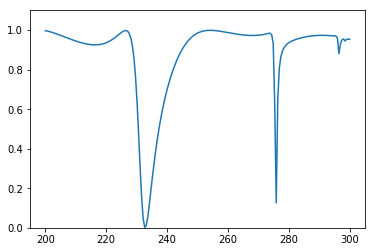

Predicted spectrum: 


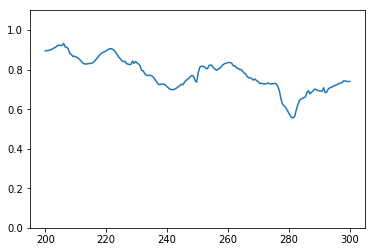

Test 135
True spectrum: 


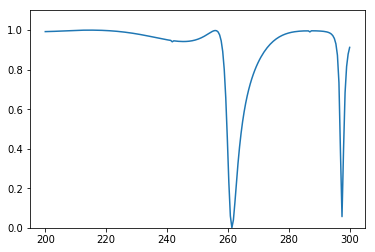

Predicted spectrum: 


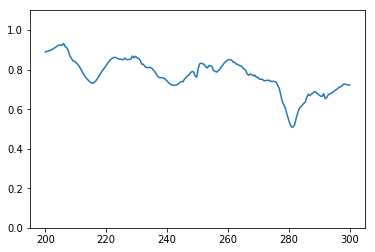

Test 136
True spectrum: 


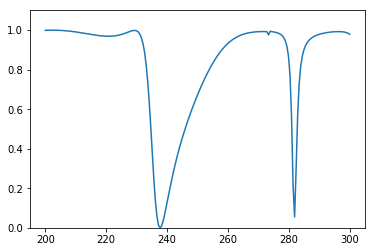

Predicted spectrum: 


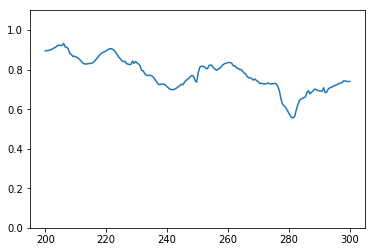

Test 137
True spectrum: 


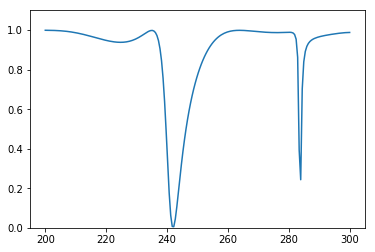

Predicted spectrum: 


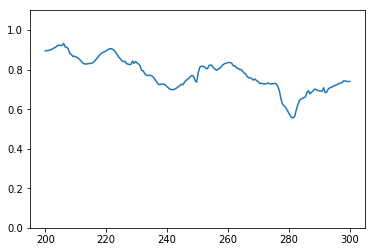

Test 138
True spectrum: 


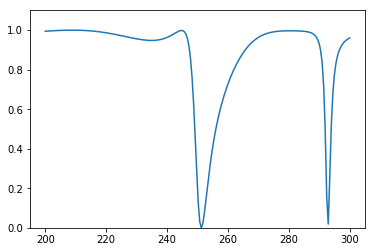

Predicted spectrum: 


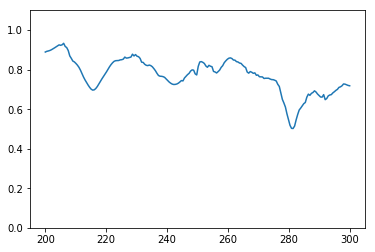

Test 139
True spectrum: 


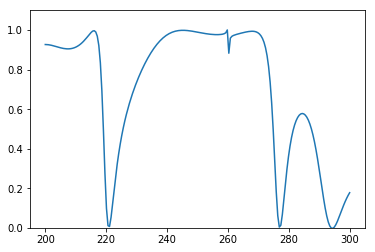

Predicted spectrum: 


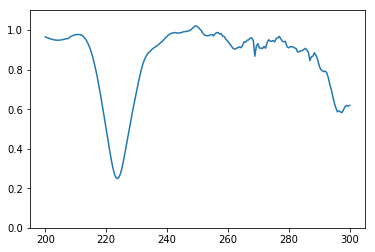

Test 140
True spectrum: 


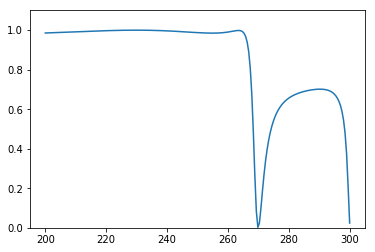

Predicted spectrum: 


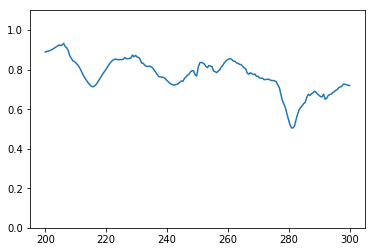

Test 141
True spectrum: 


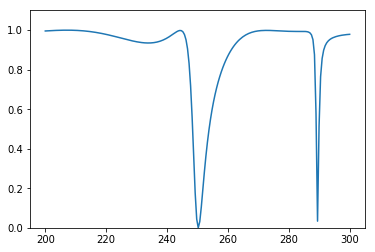

Predicted spectrum: 


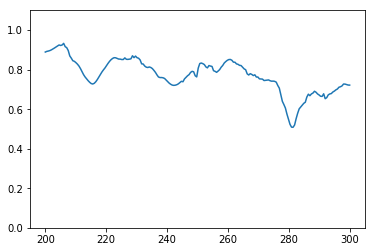

Test 142
True spectrum: 


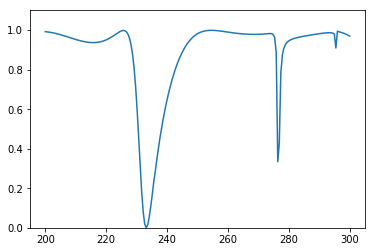

Predicted spectrum: 


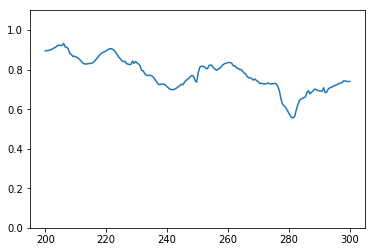

Test 143
True spectrum: 


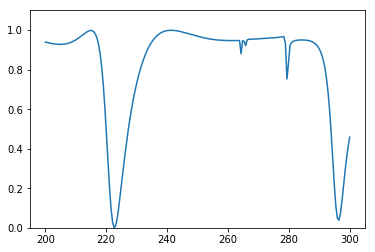

Predicted spectrum: 


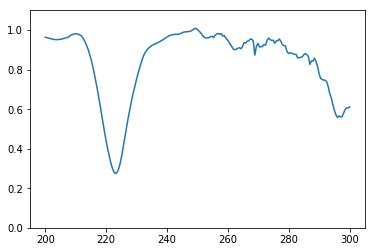

Test 144
True spectrum: 


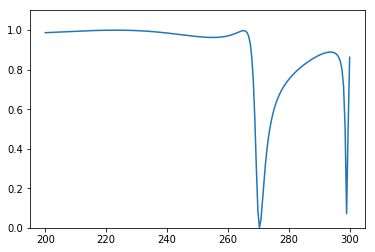

Predicted spectrum: 


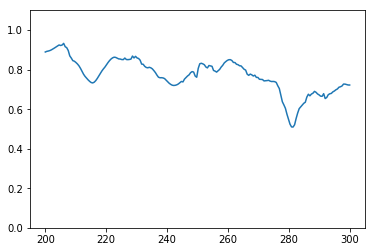

Test 145
True spectrum: 


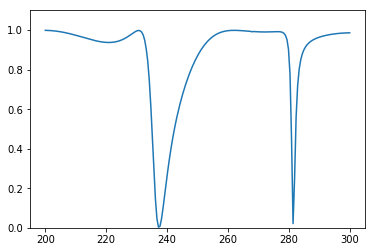

Predicted spectrum: 


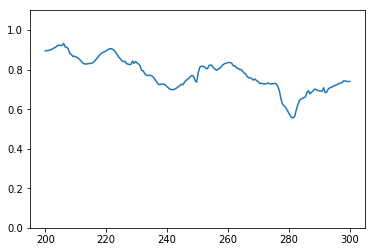

Test 146
True spectrum: 


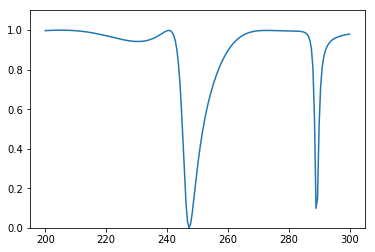

Predicted spectrum: 


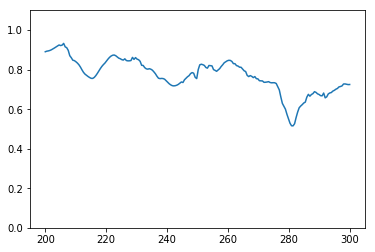

Test 147
True spectrum: 


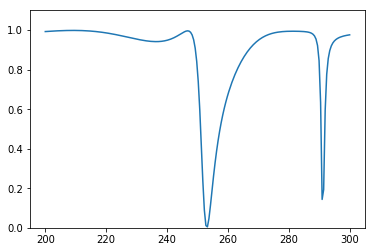

Predicted spectrum: 


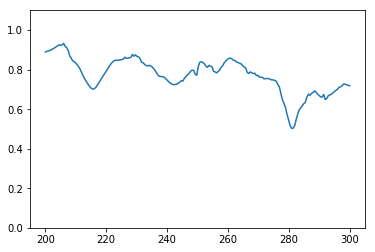

Test 148
True spectrum: 


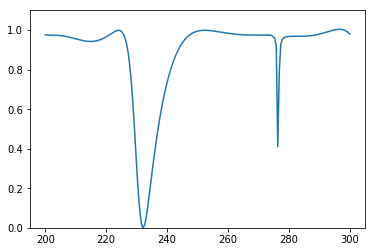

Predicted spectrum: 


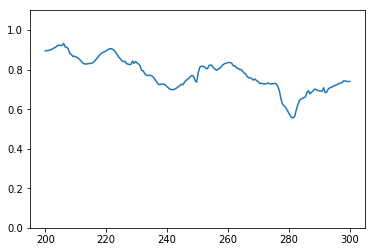

Test 149
True spectrum: 


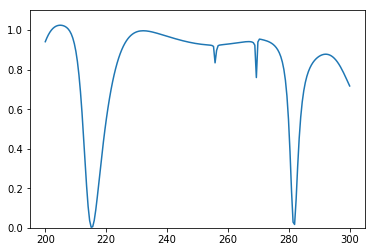

Predicted spectrum: 


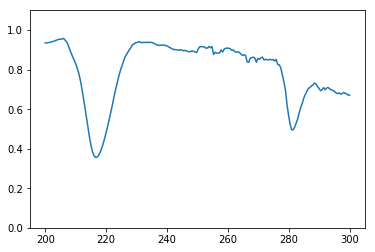

Test 150
True spectrum: 


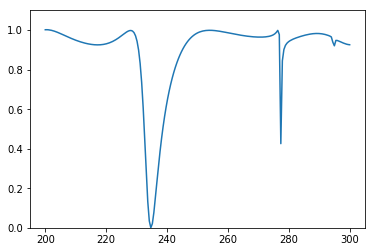

Predicted spectrum: 


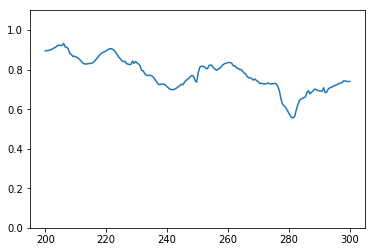

Test 151
True spectrum: 


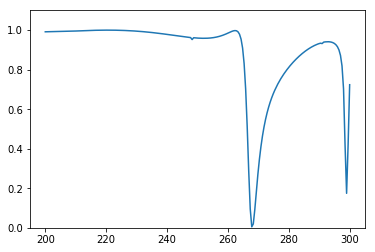

Predicted spectrum: 


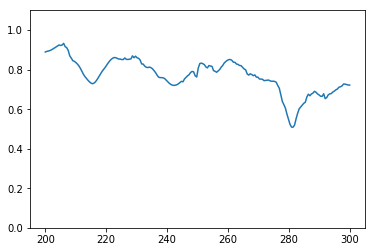

Test 152
True spectrum: 


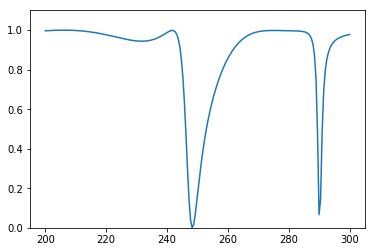

Predicted spectrum: 


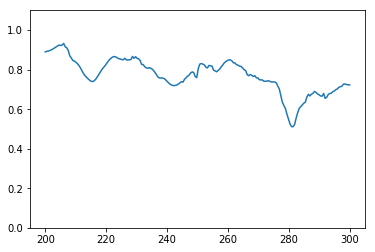

Test 153
True spectrum: 


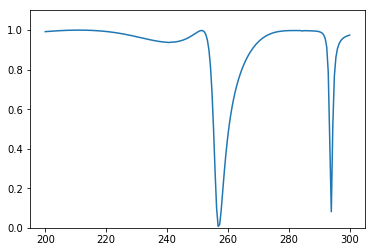

Predicted spectrum: 


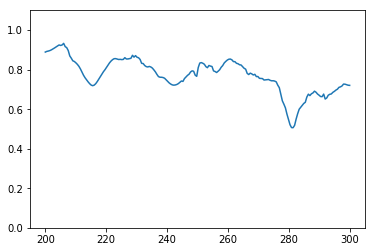

Test 154
True spectrum: 


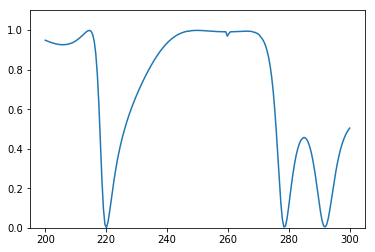

Predicted spectrum: 


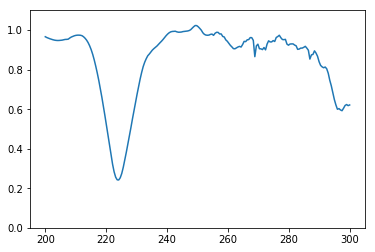

Test 155
True spectrum: 


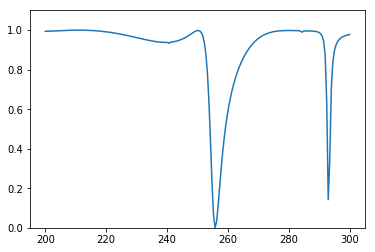

Predicted spectrum: 


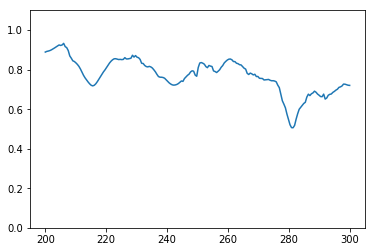

Test 156
True spectrum: 


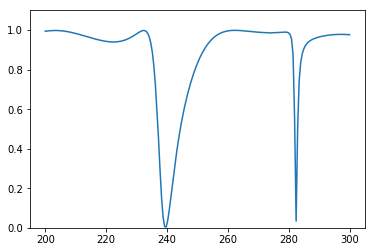

Predicted spectrum: 


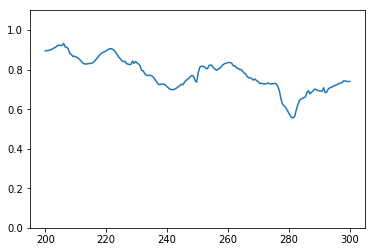

Test 157
True spectrum: 


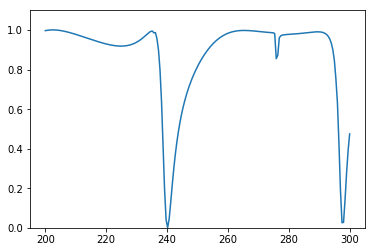

Predicted spectrum: 


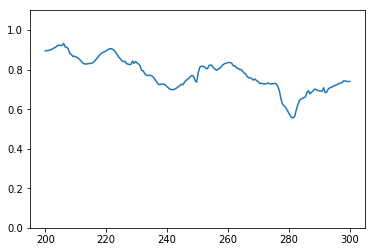

Test 158
True spectrum: 


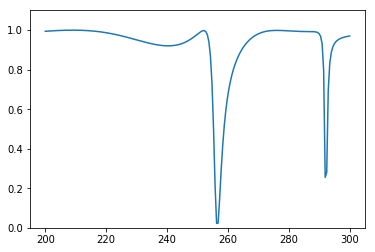

Predicted spectrum: 


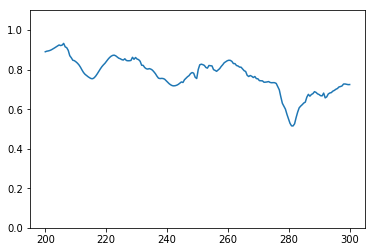

Test 159
True spectrum: 


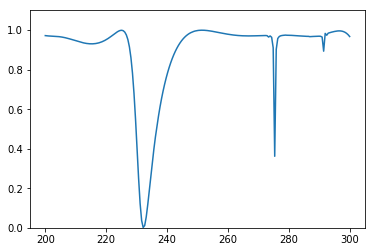

Predicted spectrum: 


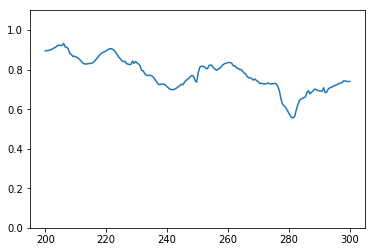

Test 160
True spectrum: 


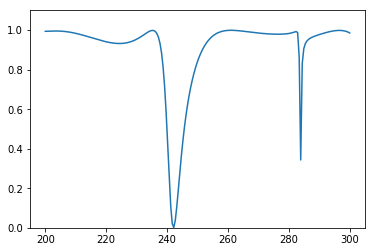

Predicted spectrum: 


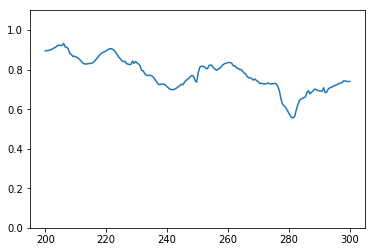

Test 161
True spectrum: 


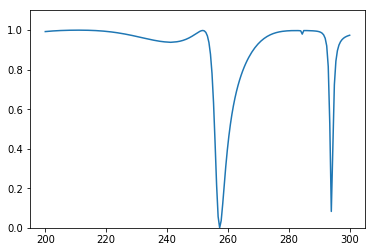

Predicted spectrum: 


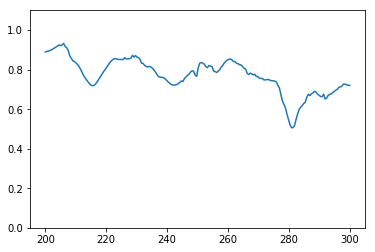

Test 162
True spectrum: 


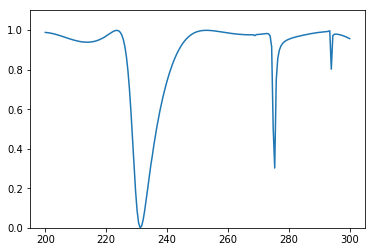

Predicted spectrum: 


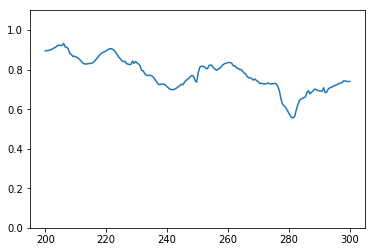

Test 163
True spectrum: 


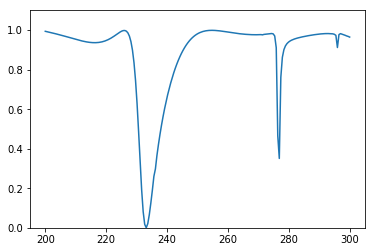

Predicted spectrum: 


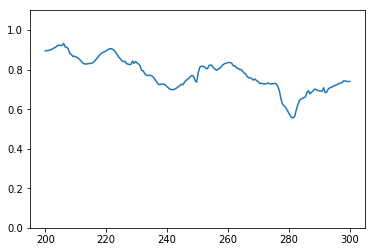

Test 164
True spectrum: 


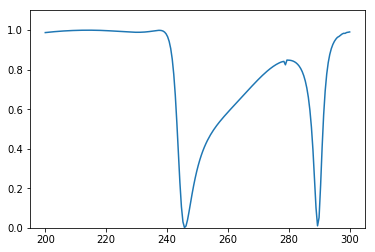

Predicted spectrum: 


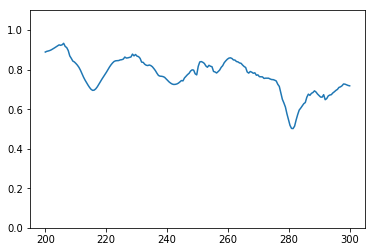

Test 165
True spectrum: 


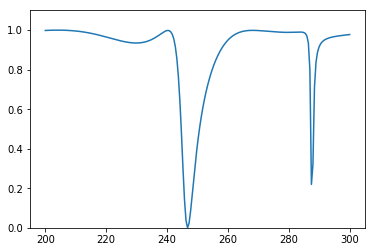

Predicted spectrum: 


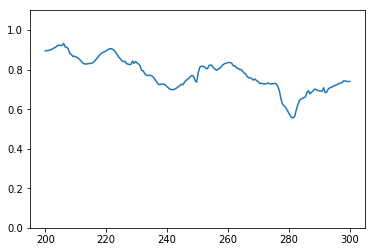

Test 166
True spectrum: 


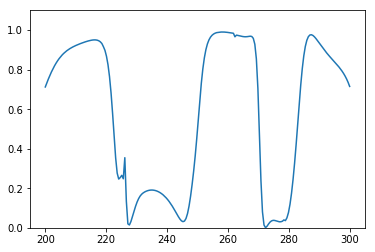

Predicted spectrum: 


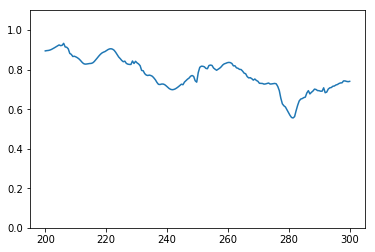

Test 167
True spectrum: 


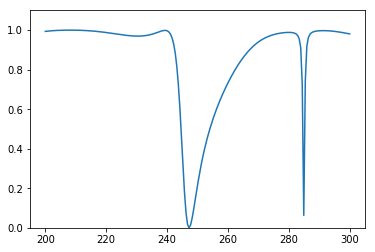

Predicted spectrum: 


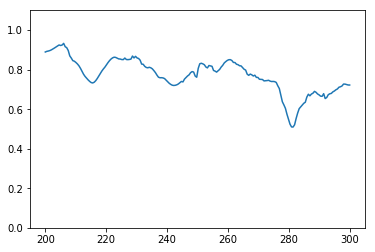

Test 168
True spectrum: 


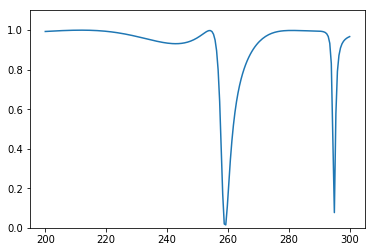

Predicted spectrum: 


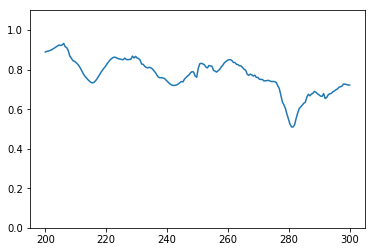

Test 169
True spectrum: 


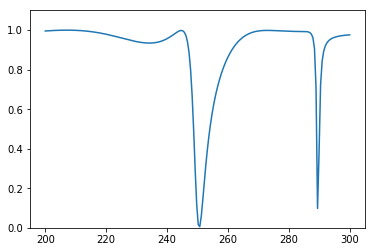

Predicted spectrum: 


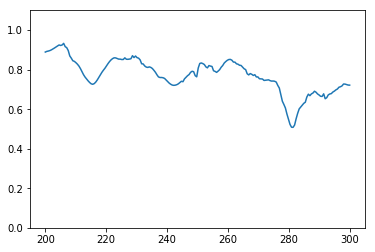

Test 170
True spectrum: 


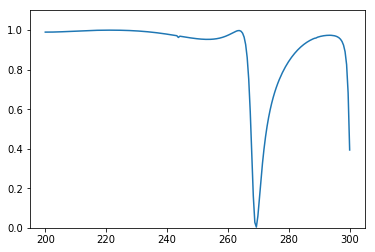

Predicted spectrum: 


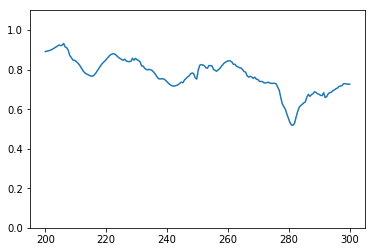

Test 171
True spectrum: 


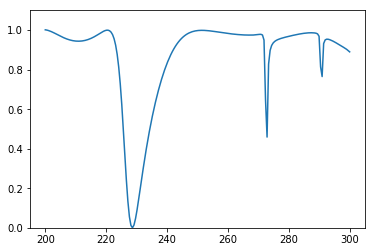

Predicted spectrum: 


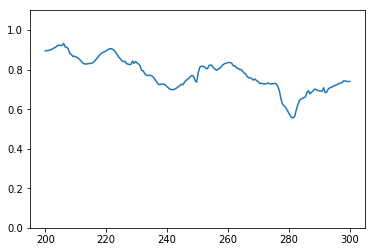

Test 172
True spectrum: 


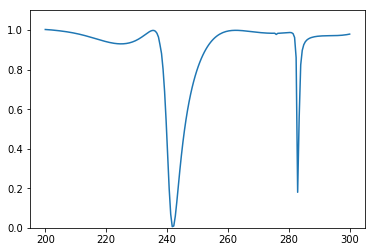

Predicted spectrum: 


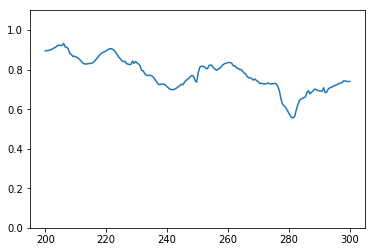

Test 173
True spectrum: 


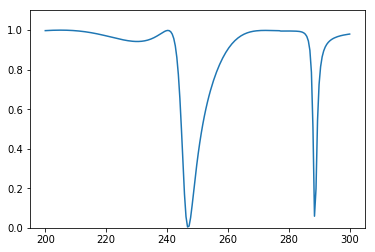

Predicted spectrum: 


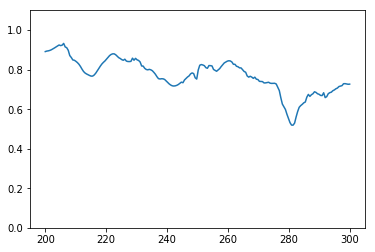

Test 174
True spectrum: 


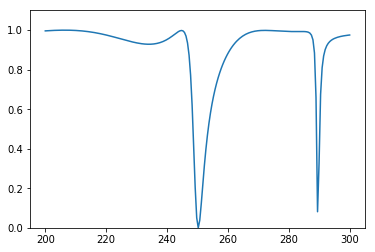

Predicted spectrum: 


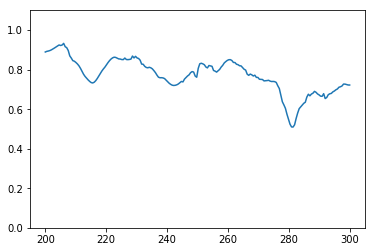

Test 175
True spectrum: 


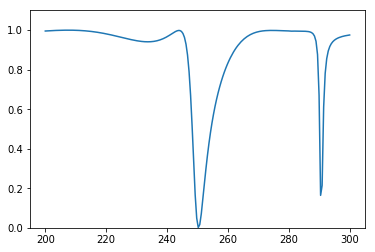

Predicted spectrum: 


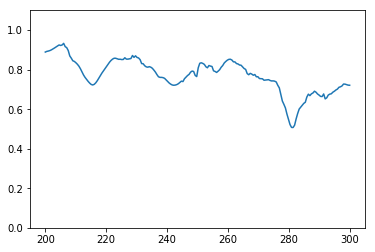

Test 176
True spectrum: 


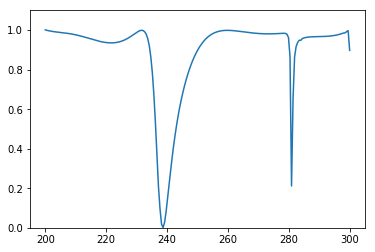

Predicted spectrum: 


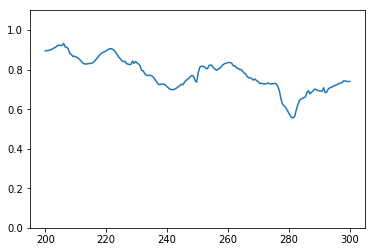

Test 177
True spectrum: 


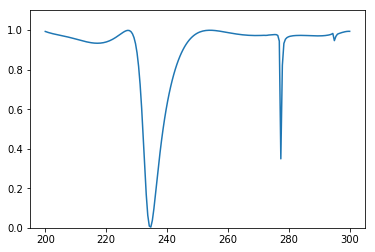

Predicted spectrum: 


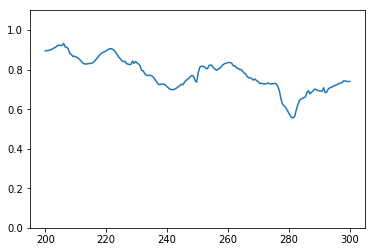

Test 178
True spectrum: 


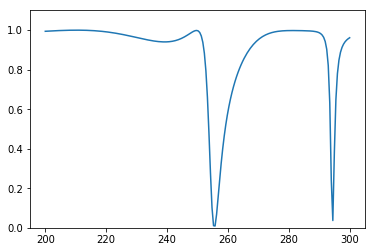

Predicted spectrum: 


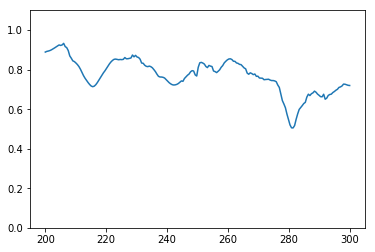

Test 179
True spectrum: 


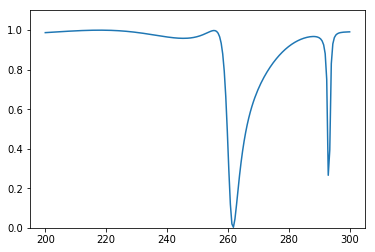

Predicted spectrum: 


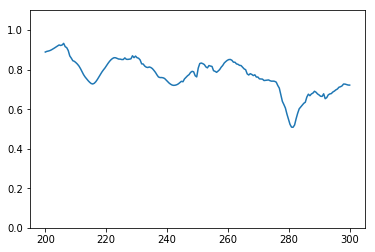

Test 180
True spectrum: 


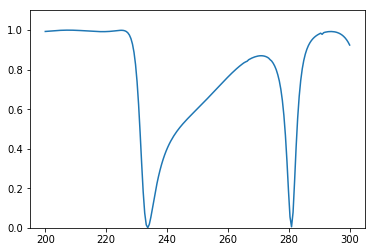

Predicted spectrum: 


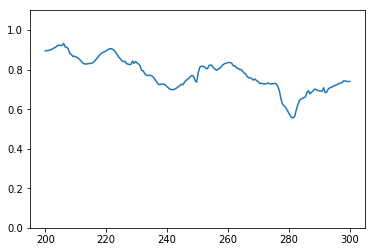

Test 181
True spectrum: 


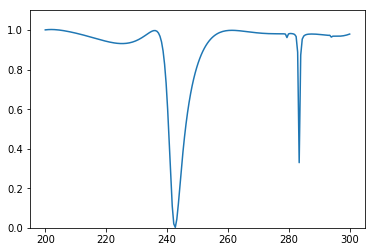

Predicted spectrum: 


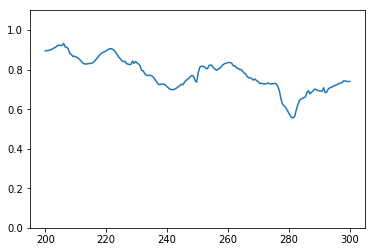

Test 182
True spectrum: 


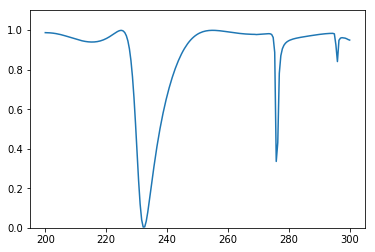

Predicted spectrum: 


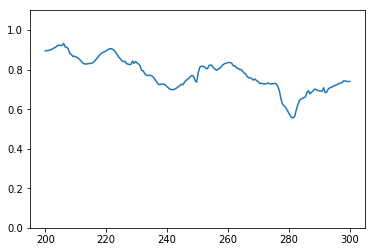

Test 183
True spectrum: 


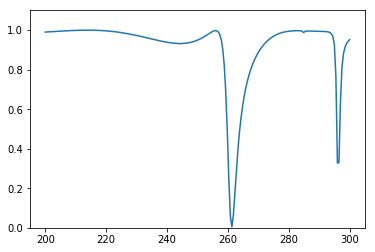

Predicted spectrum: 


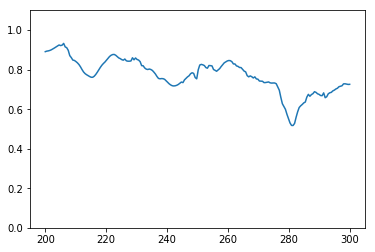

Test 184
True spectrum: 


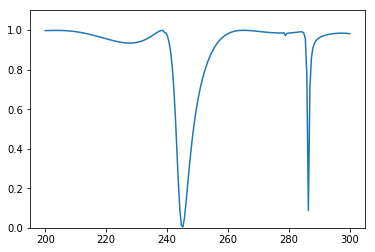

Predicted spectrum: 


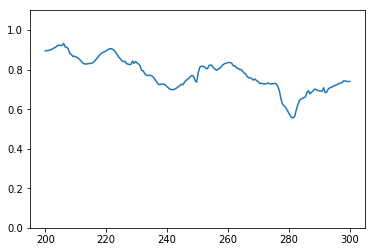

Test 185
True spectrum: 


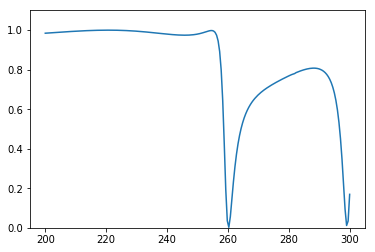

Predicted spectrum: 


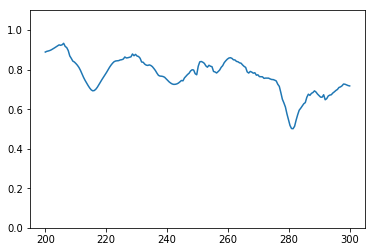

Test 186
True spectrum: 


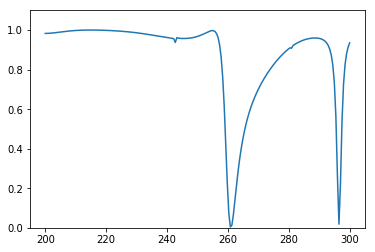

Predicted spectrum: 


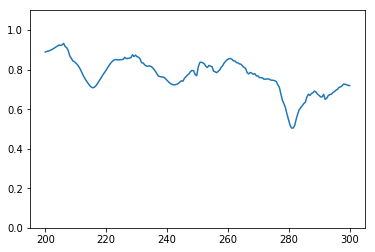

Test 187
True spectrum: 


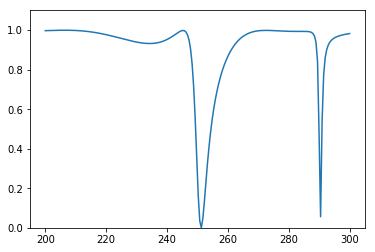

Predicted spectrum: 


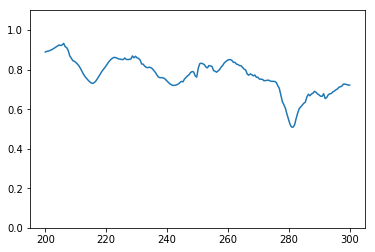

Test 188
True spectrum: 


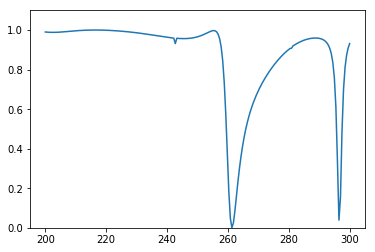

Predicted spectrum: 


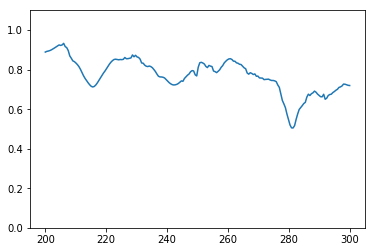

Test 189
True spectrum: 


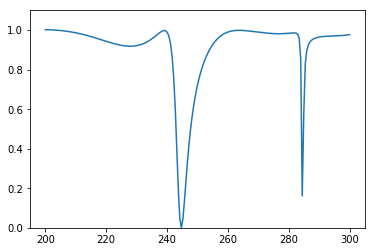

Predicted spectrum: 


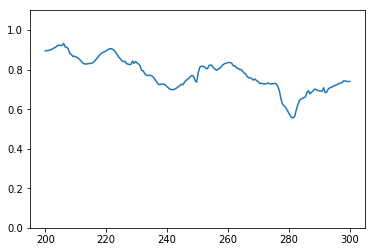

Test 190
True spectrum: 


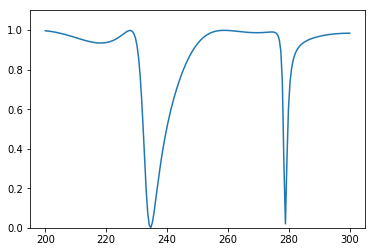

Predicted spectrum: 


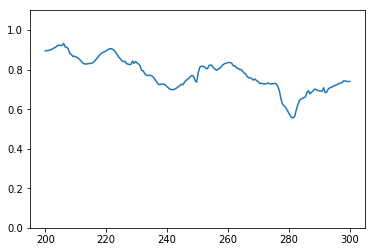

Test 191
True spectrum: 


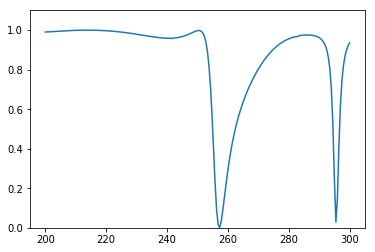

Predicted spectrum: 


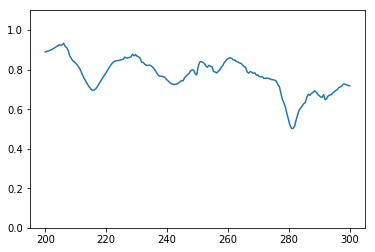

Test 192
True spectrum: 


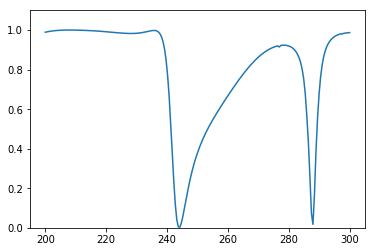

Predicted spectrum: 


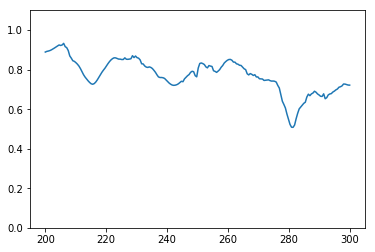

Test 193
True spectrum: 


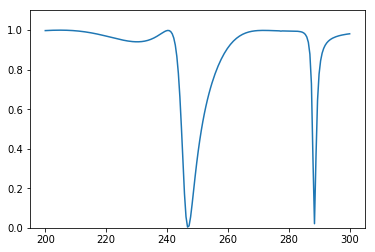

Predicted spectrum: 


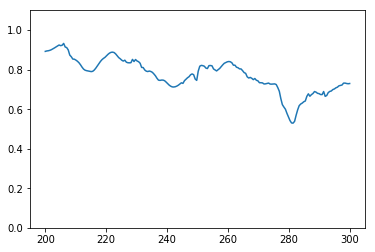

Test 194
True spectrum: 


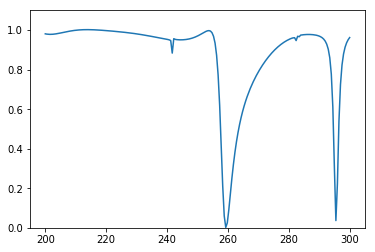

Predicted spectrum: 


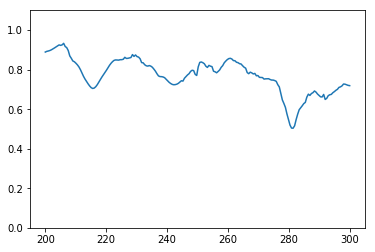

In [59]:
x = np.genfromtxt('meep_code/data/SP_xaxis.txt')
for i in range(len(test_Y)):
    print('Test '+str(i))
    print('True spectrum: ')
    plt.ylim(0, 1.1)
    plt.plot(x, test_Y[i])
    plt.show()
    print('Predicted spectrum: ')
    plt.ylim(0, 1.1)
    plt.plot(x, np.reshape(tandem.predict(np.reshape(test_Y[i], (1, 200))), (200,)))
    plt.show()

In [ ]:
inverse = Sequential()
for layer in tandem.layers[:5]:
    layer.trainable=False
    inverse.add(layer)

In [ ]:
inverse.summary()

In [ ]:
predicted = []
dfnn_o = load_model('DFNN_O')
x = np.genfromtxt('meep_code/data/SP_xaxis.txt')
for i in range(len(test_Y)):
    print('Test '+str(i))
    print('True spectrum: ')
    plt.ylim(0, 1.1)
    plt.plot(x, test_Y[i])
    plt.show()
    print('Predicted spectrum: ')
    print(inverse.predict(np.reshape(test_Y[i], (1, 200))))
    predicted.append(*inverse.predict(np.reshape(test_Y[i], (1, 200))))
    print(dfnn_o.predict(np.reshape(test_Y[i], (1, 200))))
    predicted.append(*dfnn_o.predict(np.reshape(test_Y[i], (1, 200))))

In [45]:
simulator.save('T_S')
tandem.save('T_T')
inverse.save('T_I')

In [ ]:
predicted

In [ ]:
np.savetxt('prediction.txt', predicted)